# Import Packages

In [168]:
%autosave 60 
%matplotlib inline

print('Package Versions: ')
import os
import sys; print("  Python version: ", sys.version_info)
import random
import copy
import math
from math import isclose # check if results are within 10^-9

import numpy as np; print("  Numpy version: ", np.__version__)
import pandas as pd; print("  Pandas version: ", pd.__version__)
import scipy; print("  Scipy version:", scipy.__version__)
import scipy.stats as stats
from scipy.stats import norm
from scipy.stats import lognorm
from scipy.interpolate import griddata
from statistics import median
import statsmodels.api as sm
from scipy.spatial import distance_matrix as dist_mat
# import sklearn as sklearn; print("  Sklearn version:", sklearn.__version__)
# from sklearn.neighbors import KernelDensity
# from sklearn.model_selection import KFold

import matplotlib as mpl; print("  Matplotlib version: ", mpl.__version__)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.ticker import FormatStrFormatter
import matplotlib.lines as mlines
import matplotlib.transforms as mtransforms

import seaborn as sns; print("  Seaborn version: ", sns.__version__)

import pygeostat as gs; print("  Pygeostat version: ", gs.__version__)

import warnings
warnings.filterwarnings("ignore")

Autosaving every 60 seconds
Package Versions: 
  Python version:  sys.version_info(major=3, minor=7, micro=3, releaselevel='final', serial=0)
  Numpy version:  1.18.2
  Pandas version:  1.0.2
  Scipy version: 1.1.0
  Matplotlib version:  2.2.3
  Seaborn version:  0.10.0
  Pygeostat version:  0.6.3


In [169]:
# Set random seed
np.random.seed(20200306)

# Create Directories

In [170]:
# Create executable, ouput and plot folders
exedir = '00_Programs/'
gs.mkdir(exedir)
outdir = '01_Outputs/'
gs.mkdir(outdir)

pltdir = '02_Plots/'
gs.mkdir(pltdir)
ccgdir = '../../../02_CCG/02_2020/0X_XXX_MIK_Class_Means/Figures/'
gs.mkdir(ccgdir)

# Plot subdirectories
plt_g_dir = '02_Plots/Gauss/'
gs.mkdir(plt_g_dir)
ccg_g_dir = ccgdir + 'Gauss/'
gs.mkdir(ccg_g_dir)
plt_ln_dir = '02_Plots/LN/'
gs.mkdir(plt_ln_dir)
ccg_ln_dir = ccgdir + 'LN/'
gs.mkdir(ccg_ln_dir)

# Project Settings

In [171]:
# Print array values with 6 decimals
float_formatter = "{:.6f}".format
np.set_printoptions(formatter={'float_kind':float_formatter})

In [172]:
# Generate subfolder in directory to store figures for thresholds
gs.datautils.utils.ensure_dir(ccg_g_dir+'Appendix_Class_Means/')
gs.datautils.utils.ensure_dir(plt_g_dir+'Appendix_Class_Means/')
gs.datautils.utils.ensure_dir(ccg_g_dir+'Appendix_PosClass_Means/')
gs.datautils.utils.ensure_dir(plt_g_dir+'Appendix_PosClass_Means/')
gs.datautils.utils.ensure_dir(plt_g_dir+'IK_Error/')
gs.datautils.utils.ensure_dir(plt_ln_dir+'IK_Error/')


# Create Grids

In [173]:
# Simulation grid
sim_griddef = gs.GridDef(gridstr="64 4 8 \n64 4 8 \n1 0.5 1")
print(f"Simulation griddef \n{sim_griddef}")
print()
krig_griddef = gs.GridDef(gridstr="512 0 1 \n512 0 1\n1 0.5 1")
print(f"Kriging griddef \n{krig_griddef}")

Simulation griddef 
64 4.0 8.0 
64 4.0 8.0 
1 0.5 1.0

Kriging griddef 
512 0.0 1.0 
512 0.0 1.0 
1 0.5 1.0


In [174]:
x_min = krig_griddef.xmn
y_min = krig_griddef.ymn
x_max = krig_griddef.nx * krig_griddef.xsiz - krig_griddef.xmn
y_max = krig_griddef.ny * krig_griddef.ysiz - krig_griddef.ymn

print(f"Krig Griddef extents in x: {x_min} - {x_max}")
print(f"Krig Griddef extents in y: {y_min} - {y_max}")

Krig Griddef extents in x: 0.0 - 512.0
Krig Griddef extents in y: 0.0 - 512.0


# Gaussian and Log-Normal Distribution Parameters

The variable $Z > 0$ is log-normal with $m$ and $\sigma^2$ when $Y = ln(Z)$ is normal with mean $\alpha$ and variance $\beta^2$. 

Calculate $\alpha$ and $\beta^2$ parameters: 
 - $\alpha = ln(m) - \beta^2 / 2$ 
 - $\beta^2 = ln(1 + \sigma^2 / m^2)$ 


In [175]:
# Gaussian parameters
mu_g = 0
var_g = 1 
sigma_g = np.sqrt(var_g) 
print(
f"""Gaussian distribution parameters: 
    Mean: {mu_g} 
    Variance: {var_g}"""
)

Gaussian distribution parameters: 
    Mean: 0 
    Variance: 1


In [176]:
# Log-normal parameters
mu_ln = 1 
var_ln = 4
print(
f"""Log-normal distribution parameters:
    Mean: {mu_ln}
    Variance: {var_ln}\n"""
)

# Parameters of underlying Gaussian distribution
beta_sq = np.log(1 + var_ln/mu_ln*mu_ln)
beta = np.sqrt(beta_sq)
alpha = np.log(mu_ln) - beta*beta/2

print(
f"""The underlying Gaussian parameters of the log-normal distribution are: 
    \u03B1: {alpha:.3f}
    \u03B2^2: {beta_sq:.3f}"""
)

Log-normal distribution parameters:
    Mean: 1
    Variance: 4

The underlying Gaussian parameters of the log-normal distribution are: 
    α: -0.805
    β^2: 1.609


# Specify No. Thresholds

Calculate the following for each threshold scenario:
 - `nclass`: number of classes for the given threshold scenario (nthresh + 1)
 - `probability`: CDF value of corresponding cut-off value 
 - `gauss_cuts`: Gaussian cut-off values using $mean =$ `mu_g` and $variance = $ `var_g` 
 - `gauss_ln_cuts`: Gaussian cut-off values using $mean = $ `alpha` ($\alpha$) and $variance = $ `beta_sq` ($\beta^2$) 
 - `ln_cuts`: Log-normal distribution with $mean =$ `mu_ln` and $variance = $ `var_ln`
 
The $\alpha$ and $\beta^2$ parameters define the Gaussian distribution underlying the log-normal distribution with specified $mean$ and $variance$ parameters.

In [177]:
def prnt_keys(input_dict):
    """Simple function to print keys of specified dictionary"""
    print(f"Dictionary keys: ")
    for key in input_dict.keys():
        print(f"    {key}")

In [178]:
def thresh_calcs(low, high):
    """This takes the range of thresholds provided and calculates evenly 
    spaced CDF values and corresponding Gaussian and Log-Normal values for 
    each threshold scenario. Dictionaries containing the threshold number, 
    number of classes, CDF values, and Gauss values (all as dictionaries) are 
    returned."""
    
    # Put thresholds in a list and return
    thresh_arr = np.arange(low, high + 1, 1)
    
    # Generate dictionary keys and report range of thresholds
    thresholds = np.arange(low, high + 2, 1) # Plus 2 to make coding easier
    thresh_keys = [str(num) for num in thresholds[:-1]]
    print(
    f"""Range of thresholds to be examined: 
    {thresh_keys[0]} -- {thresh_keys[-1]}"""
    )

    # Items to calculate for each threshold (dict keys)
    info_keys = ['n_thresh', 'n_classes', 'probability', 
                 'gauss_cuts', 'gauss_ln_cuts', 'ln_cuts']
    
    # Lists and dictionaries:    
    info_thresh = [] # store info_keys dictionaries
    nthresh_dict = {}
    nclass_dict = {} 
    mults = []  
    probs_dict = {} 
    g_cuts_dict = {} 
    gln_cuts_dict = {} 
    ln_cuts_dict = {} 
    
    # Calculate CDF increments for each threshold in range
    increment = [1 / (thresh + 1) for thresh in thresholds[:-1]]
    
    for i, thresh in enumerate(thresholds[:-1]):
        # nthresh
        nthresh = int(thresh)
        nthresh_dict.update({thresh_keys[i]: nthresh})
        # nclass 
        nclass = int(thresh) + 1
        nclass_dict.update({thresh_keys[i]: nclass})
        # probability 
        mults.append(np.array(list(range(1, thresholds[i+1]))))
        a = mults[i] * increment[i]
        probs_dict.update({thresh_keys[i]: a})
        # gauss_cuts
        b = norm.ppf(q=a, loc=mu_g, scale=np.sqrt(var_g))
        g_cuts_dict.update({thresh_keys[i]: b})
        # gauss_ln_cuts
        c = lognorm.ppf(q=a, s=beta, loc=0, scale=np.exp(alpha))
        gln_cuts_dict.update({thresh_keys[i]: c})
        # ln_cuts
        d = np.exp(c)
        ln_cuts_dict.update({thresh_keys[i]: d})
    
    info_thresh.extend([nthresh_dict, nclass_dict, probs_dict, 
                        g_cuts_dict, gln_cuts_dict, ln_cuts_dict])
    thresh_dict = dict(zip(info_keys, info_thresh))
    return thresh_dict, thresh_arr

In [179]:
# Set Range of Thesholds to Evaluate
low_thresh = 5
high_thresh = 15

thresh_dict, thresh_arr = thresh_calcs(low_thresh, high_thresh)

Range of thresholds to be examined: 
    5 -- 15


In [180]:
prnt_keys(thresh_dict)

Dictionary keys: 
    n_thresh
    n_classes
    probability
    gauss_cuts
    gauss_ln_cuts
    ln_cuts


# Determine Plot Configuration

In [181]:
# Set number of desired columns for plots:
ncols = 3

## Plotting Thresholds for Upper Half of Gaussian Dist

In [182]:
def upper_cuts(input_list):
    """Find middle cut-off (if length of list is even, take the smaller 
    middle value) and return the upper cut-offs, the number of cut-offs, and 
    the number of classes."""
    mid_cut = int(len(input_list)) // 2
    mid_cls = int(len(input_list)+1) // 2
    if len(input_list) % 2 == 0: # return upper cut-offs, ncuts, nclasses
        return input_list[mid_cut - 1:], int(mid_cut + 1), int(mid_cls + 2)
    else:
        return input_list[mid_cut:], int(mid_cut + 1), int(mid_cls + 1)
                

In [183]:
# new temp dictionary to store values
up_keys = ['up_probs', 'gauss_up_cuts', 'gauss_ln_up_cuts', 'ln_up_cuts']
up_dict = dict.fromkeys(up_keys)

# Filter keys for probability, gauss, gauss-ln, and ln cut-off scenarios
suffices = ('probability', 'cuts')
temp_updict = {key:v for key,v in thresh_dict.items() 
               if key.endswith(suffices)}

# Extract the upper cut-off values in each scenario
for (keys,cuts), keys2 in zip(temp_updict.items(), up_dict):
    up0_dict = {} # updated upper cut-offs
    n1_dict = {} # updated number of upper cut-offs
    n2_dict = {} # updated number of upper classes
    for k in cuts:
        # Determine values and number of upper thresholds
        ucuts = upper_cuts(temp_updict[keys][k])
        up0_dict.update({k: ucuts[0]}) # first return value
        n1_dict.update({k: ucuts[1]}) # second return value
        n2_dict.update({k: ucuts[2]}) # third return value
    up_dict[keys2] = up0_dict
thresh_dict.update(up_dict)

# Take counts of cut-offs and classes and update dictionary
n_dict = {}
n_keys = ['n_upcuts', 'n_upclasses']
n_dict.update(zip(n_keys, (n1_dict, n2_dict)))

thresh_dict.update(n_dict)

# delete temp dicts
del(n_dict)
del(up0_dict)
del(up_dict)

In [184]:
prnt_keys(thresh_dict)

Dictionary keys: 
    n_thresh
    n_classes
    probability
    gauss_cuts
    gauss_ln_cuts
    ln_cuts
    up_probs
    gauss_up_cuts
    gauss_ln_up_cuts
    ln_up_cuts
    n_upcuts
    n_upclasses


## Number of Subplot Rows

`pltrow_dict` is a dictionary containing number of subplot rows needed depending on the number of:
 - `nrow_thresh` : cut-offs
 - `nrow_classes`: classes (thresh + 1)
 - `nrow_upcuts`: upper cut-offs
 - `nrow_upclasses`: upper classes 

In [185]:
def subplt_rows(nplts, ncols):
    """Determine number of subplot rows required given a specified number of 
    plots (nplts) and desired number of plot columns (ncols)."""
    quotient, remainder = divmod(nplts, ncols)
    if quotient == 0:
        a = 1
    else:
        a = quotient
    if remainder:
        a = a + 1
    return(a)

In [186]:
# Extract dictionaries corresponding to number of items to plot
plt_dict = {key:v for key,v in thresh_dict.items() if key.startswith('n_')}

# Generate dictionary with new classes to update into main dictionary
pltrow_keys = ['nrow_thresh', 'nrow_classes', 'nrow_upcuts', 'nrow_upclasses']
pltrow_dict = dict.fromkeys(pltrow_keys)

# Calculate number of rows needed for each key and threshold scenario
for (keys, cuts), keys2 in zip(plt_dict.items(), pltrow_dict):
    temp_dict = {}
    for k in cuts:
        pltrows = subplt_rows(plt_dict[keys][k], ncols)
        temp_dict.update({k: pltrows})
    pltrow_dict[keys2] = temp_dict

del (plt_dict, temp_dict)

In [187]:
prnt_keys(pltrow_dict)

Dictionary keys: 
    nrow_thresh
    nrow_classes
    nrow_upcuts
    nrow_upclasses


## Figure Size

In [188]:
fwdth = ncols * 3 + 1
print(f"Figure width based on {ncols} columns: {fwdth}")

Figure width based on 3 columns: 10


In [189]:
# Calculate figure heights based on the number of rows in the plots.
fhght = 4
fhght_dict = {outerk: {innerk: (innerv * fhght) for (innerk, innerv) in 
                       outerv.items()} 
              for (outerk, outerv) in pltrow_dict.items()}
prnt_keys(fhght_dict)
    

Dictionary keys: 
    nrow_thresh
    nrow_classes
    nrow_upcuts
    nrow_upclasses


# Generate Datasets

In [190]:
# Number of percentiles to define distribution
L = 10000

# Define percentile values
pvals = np.linspace(0.0001, 0.9999, L)
print(f"Number of percentiles used: {L}")

Number of percentiles used: 10000


In [191]:
prnt_msg = ['Gaussian data', 'NS-transform of log-normal data']
prnt_mu = ['mean', 'alpha']
prnt_sigma = ['stdev', 'beta']

# mean and std. dev. parameters for gaussian y-values
mu = [mu_g, alpha] 
sigma = [sigma_g, beta]
yglob_keys = ['Gauss', 'G_LN']

yglob_dict = {}
# Calculate global y-values using percentiles
for i in range(2):
    print(f"Calculating Gaussian quantiles given {prnt_mu[i]}: {mu[i]:.3f} "
          f"and {prnt_sigma[i]}: {sigma[i]:.3f} parameters:")
    yglob = stats.norm.ppf(pvals, loc=mu[i], scale=sigma[i])
    yglob_dict.update({yglob_keys[i]: yglob})
    print(f"Shape of {yglob_keys[i]} quantile array: {yglob.shape} \n")

print("Converting G-LN to log-normal distribution.")
yglob_ln = np.exp(yglob_dict['G_LN'])
yglob_dict.update({'LN': yglob_ln})
print(f"Shape of {[key for key in yglob_dict.keys()][2]} quantile array: "
      f"{yglob_dict['LN'].shape}")
print()
prnt_keys(yglob_dict)

Calculating Gaussian quantiles given mean: 0.000 and stdev: 1.000 parameters:
Shape of Gauss quantile array: (10000,) 

Calculating Gaussian quantiles given alpha: -0.805 and beta: 1.269 parameters:
Shape of G_LN quantile array: (10000,) 

Converting G-LN to log-normal distribution.
Shape of LN quantile array: (10000,)

Dictionary keys: 
    Gauss
    G_LN
    LN


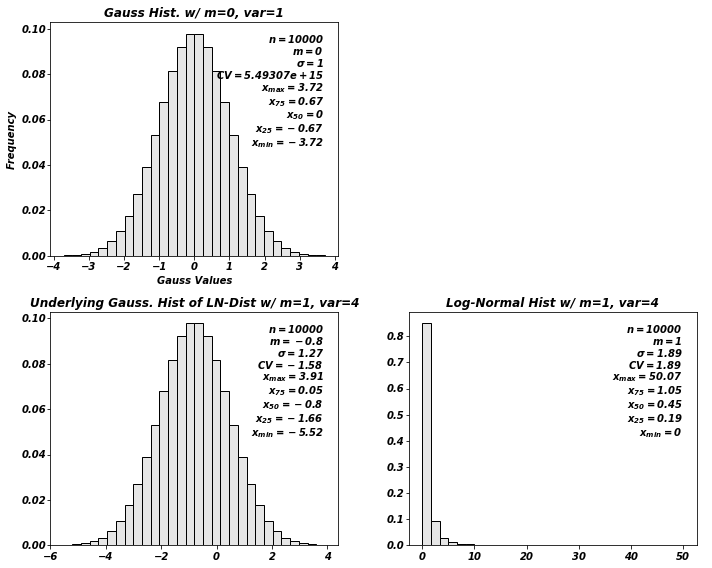

In [192]:
fig, axes = plt.subplots(2, 2, figsize=(10,8), sharey=False, sharex=False)

axes[0,1].axis('off')
gs.histplt(yglob_dict['Gauss'], bins=30, ax=axes[0,0], ylabel='Frequency',
          xlabel='Gauss Values', title='Gauss Hist. w/ m=0, var=1')
gs.histplt(yglob_dict['G_LN'], bins=30, ax=axes[1,0], 
           title='Underlying Gauss. Hist of LN-Dist w/ m=1, var=4')
gs.histplt(yglob_dict['LN'], bins=30, ax=axes[1,1], 
           title='Log-Normal Hist w/ m=1, var=4')

fig.tight_layout()
plt.show()

# Class Means

Generate empty dictionary to store class mean data:
 - `global_cls_mean`: global class means
 - `local_cls_mean`: local class means calculated from CCDF values inside each class 
 
Sub-dictionaries for global and local means:
 - `Gauss`: Gaussian values for each threshold scenario
 - `G_LN` : Gaussian values underlying the log-normal distribution
 - `LN`: Log-normal values for each threshold scenario

In [193]:
# Generate empty dictionaries: class_means_dict, class_std_dict
class_means_dict = {
    'glob_cls_mean': 'empty', 
    'loc_cls_mean': 'empty', 
}
prnt_keys(class_means_dict)

class_std_dict = {
    'glob_cls_std': 'empty', # Not calculated
    'loc_cls_std': 'empty',
}
prnt_keys(class_std_dict)

class_cov_dict = {
    'glob_cls_cov': 'empty',
    'loc_cls_cov': 'empty'
}
prnt_keys(class_cov_dict)

Dictionary keys: 
    glob_cls_mean
    loc_cls_mean
Dictionary keys: 
    glob_cls_std
    loc_cls_std
Dictionary keys: 
    glob_cls_cov
    loc_cls_cov


## Global Class Means

In [194]:
# Extract cut_offs for each data scenario from thresh_dict
cutoff_dict = {
    'Gauss': thresh_dict['gauss_cuts'],
    'G_LN': thresh_dict['gauss_ln_cuts'],
    'LN': thresh_dict['ln_cuts']    
}
for k, v in cutoff_dict.items():
    print(f"{k}: \n {v} \n")

Gauss: 
 {'5': array([-0.967422, -0.430727, 0.000000, 0.430727, 0.967422]), '6': array([-1.067571, -0.565949, -0.180012, 0.180012, 0.565949, 1.067571]), '7': array([-1.150349, -0.674490, -0.318639, 0.000000, 0.318639, 0.674490,
       1.150349]), '8': array([-1.220640, -0.764710, -0.430727, -0.139710, 0.139710, 0.430727,
       0.764710, 1.220640]), '9': array([-1.281552, -0.841621, -0.524401, -0.253347, 0.000000, 0.253347,
       0.524401, 0.841621, 1.281552]), '10': array([-1.335178, -0.908458, -0.604585, -0.348756, -0.114185, 0.114185,
       0.348756, 0.604585, 0.908458, 1.335178]), '11': array([-1.382994, -0.967422, -0.674490, -0.430727, -0.210428, 0.000000,
       0.210428, 0.430727, 0.674490, 0.967422, 1.382994]), '12': array([-1.426077, -1.020076, -0.736316, -0.502402, -0.293381, -0.096559,
       0.096559, 0.293381, 0.502402, 0.736316, 1.020076, 1.426077]), '13': array([-1.465234, -1.067571, -0.791639, -0.565949, -0.366106, -0.180012,
       0.000000, 0.180012, 0.366106, 0.565

In [195]:
# Temporary dict to update with class means for each thresh scenario
update_dict = dict.fromkeys([k for k in cutoff_dict.keys()])

# Iterate through keys and threshold scenarios
for (keys, threshes), (dat, arr) in zip(cutoff_dict.items(), 
                                        yglob_dict.items()):
    print(f"{keys} values: Calculating global class means... ")
    # temp. dict to store mean values
    means_dict = {}
    for k, ncls in zip(threshes, thresh_dict['n_classes'].values()):
        print(f"    With {int(k)} thresholds / {ncls} classes:")
        glob_cm = np.zeros((ncls)) # For class means
        chk_num = np.zeros((ncls)) # To total percentiles in each class
        for i in range(ncls):    
            if i == 0: # Lower Tail
                aa = arr[arr <= min(threshes[k])]
                print(f"      Lower Tail: Y <= {min(threshes[k]):.3f};")
            elif i > 0 and i < len(threshes[k]): # Middle classes
                aa = arr[(arr > threshes[k][i-1]) & 
                         (arr <= threshes[k][i])]
                print(f"      Class {i + 1}: {threshes[k][i-1]:.3f} < Y "
                      f"<= {threshes[k][i]:.3f};")
            else: # Upper Tail
                aa = arr[arr > max(threshes[k])]
                print(f"      Upper Tail: Y > {max(threshes[k]):.3f};")

            glob_cm[i] = np.nanmean(aa)
            chk_num[i] = aa[~np.isnan(aa)].shape[0]
            print(f"          Global Class Mean: {glob_cm[i]:.3f};"
                  f" Number in class: {chk_num[i]}")
        means_dict[k] = glob_cm # Update global class mean dict
        print(f"    Total quantiles calculated (should equal {L}): "
              f"{chk_num.sum(dtype='int32')}")
        print(f"    Shape of output array: {glob_cm.shape}\n")
    update_dict[keys] = means_dict
class_means_dict['glob_cls_mean'] = update_dict

del (means_dict, update_dict)

Gauss values: Calculating global class means... 
    With 5 thresholds / 6 classes:
      Lower Tail: Y <= -0.967;
          Global Class Mean: -1.498; Number in class: 1666.0
      Class 2: -0.967 < Y <= -0.431;
          Global Class Mean: -0.683; Number in class: 1667.0
      Class 3: -0.431 < Y <= 0.000;
          Global Class Mean: -0.212; Number in class: 1667.0
      Class 4: 0.000 < Y <= 0.431;
          Global Class Mean: 0.212; Number in class: 1667.0
      Class 5: 0.431 < Y <= 0.967;
          Global Class Mean: 0.683; Number in class: 1667.0
      Upper Tail: Y > 0.967;
          Global Class Mean: 1.498; Number in class: 1666.0
    Total quantiles calculated (should equal 10000): 10000
    Shape of output array: (6,)

    With 6 thresholds / 7 classes:
      Lower Tail: Y <= -1.068;
          Global Class Mean: -1.579; Number in class: 1428.0
      Class 2: -1.068 < Y <= -0.566;
          Global Class Mean: -0.800; Number in class: 1429.0
      Class 3: -0.566 < Y <= -0.1

### Plot Global Class Means: CDF - COME BACK TO THIS LATER

In [647]:
for k, v in cutoff_dict['G_LN'].items():
    print(k, v)

5 [0.131070 0.258941 0.447214 0.772377 1.525904]
6 [0.115432 0.218122 0.355906 0.561946 0.916919 1.732629]
7 [0.103924 0.190063 0.298509 0.447214 0.669997 1.052284 1.924480]
8 [0.095058 0.169508 0.258941 0.374576 0.533937 0.772377 1.179888 2.103978]
9 [0.087989 0.153750 0.229927 0.324288 0.447214 0.616736 0.869840 1.300817
 2.273007]
10 [0.082202 0.141250 0.207688 0.287319 0.386904 0.516924 0.696091 0.962982
 1.415926 2.433026]
11 [0.077364 0.131070 0.190063 0.258941 0.342434 0.447214 0.584054 0.772377
 1.052284 1.525904 2.585186]
12 [0.073249 0.122600 0.175725 0.236434 0.308229 0.395653 0.505493 0.648869
 0.845901 1.138143 1.631315 2.730416]
13 [0.069699 0.115432 0.163815 0.218122 0.281063 0.355906 0.447214 0.561946
 0.711583 0.916919 1.220893 1.732629 2.869477]
14 [0.066600 0.109275 0.153750 0.202912 0.258941 0.324288 0.402185 0.497283
 0.616736 0.772377 0.985651 1.300817 1.830238 3.003004]
15 [0.063867 0.103924 0.145121 0.190063 0.240557 0.298509 0.366305 0.447214
 0.545993 0.669997

In [663]:
# Calculate the class limits for each threshold scenario
class_limits_dict = {}
keys = [k for k in cutoff_dict.keys()] # copy keys from thresh_dict
#if (k == 'Gauss') | (k == 'LN')

for ((k1, vgcuts), 
     (k2, vglncuts), 
     (k3, vlncuts)) in zip(cutoff_dict['Gauss'].items(), 
                          cutoff_dict['G_LN'].items(),
                          cutoff_dict['LN'].items()):
    tg_dict, tgln_dict, tln_dict = {}, {}, {}
    tg, tgln, tln = [], [], []
    for idx, (vg, vgln, vln) in enumerate(zip(vgcuts, vglncuts, vlncuts)):
        # Generate cut-off intervals for each threshold
        a = vgcuts[idx: idx + 2]
        tg.append(a) # Gauss
        b = vglncuts[idx: idx + 2]
        tgln.append(b) # Gauss-LN
        c = vlncuts[idx: idx + 2]
        tln.append(c) # LN
        
    # Insert Lower and Upper Tail intervals
    tg.insert(0, np.array([-5, tg[0][0]]))
    tg[-1] = np.append(vgcuts[-1], np.array([5]))
    tgln.insert(0, np.array([-1, tgln[0][0]]))
    tgln[-1] = np.append(vgcuts[-1], np.array([10]))
    tln.insert(0, np.array([0, tln[0][0]]))
    tln[-1] = np.append(vgcuts[-1], np.array([50]))
    
    # Update dictionaries
    tg_dict[k1] = tg     
#     a = ncuts[cut_idx:cut_idx+2]
#     cls_lst.append(a)
#     cls_lst.insert(0, np.array([-5, cls_lst[0][0]])) # -5 min in lower tail
#     cls_lst[-1] = np.append(cls_lst[-1], np.array([5])) # 5 max in upper tail
#     class_limits_dict[num_cuts[idx]] = cls_lst
# class_limits_lst = [class_limits_dict[thresh] for thresh in thresh_dict]

TG: 15, [array([-5.000000, -0.967422]), array([-0.967422, -0.430727]), array([-0.430727, 0.000000]), array([0.000000, 0.430727]), array([0.430727, 0.967422]), array([0.967422, 5.000000])]
TG_LN: 15, [array([-1.000000, 0.131070]), array([0.131070, 0.258941]), array([0.258941, 0.447214]), array([0.447214, 0.772377]), array([0.772377, 1.525904]), array([0.967422, 10.000000])]
TLN: 15, [array([0.000000, 1.140047]), array([1.140047, 1.295557]), array([1.295557, 1.563948]), array([1.563948, 2.164906]), array([2.164906, 4.599300]), array([0.967422, 50.000000])]
TG: 15, [array([-5.000000, -1.067571]), array([-1.067571, -0.565949]), array([-0.565949, -0.180012]), array([-0.180012, 0.180012]), array([0.180012, 0.565949]), array([0.565949, 1.067571]), array([1.067571, 5.000000])]
TG_LN: 15, [array([-1.000000, 0.115432]), array([0.115432, 0.218122]), array([0.218122, 0.355906]), array([0.355906, 0.561946]), array([0.561946, 0.916919]), array([0.916919, 1.732629]), array([1.067571, 10.000000])]
TLN

In [198]:
# # Generate limits for histogram class limits
# glob_cdf_classes = []
# for i, v in enumerate(cut_offs[0]):
#     a = cut_offs[0][i:i+2]
#     glob_cdf_classes.append(a)
# glob_cdf_classes.insert(0, np.array([-5, glob_cdf_classes[0][0]]))
# glob_cdf_classes[-1] = np.append(glob_cdf_classes[-1], np.array([5]))
# glob_cdf_classes

In [199]:
# # Plot global class for threshold scenario: 9
# thresh_probs = thresh_dict['9'][0]
# thresh_xvals = thresh_dict['9'][1]
# glob_cls_mean = global_class_mean_dict['9']
# cls_lims = class_limits_dict['9']

# ## FIGURE
# fig, ax = plt.subplots(1, 1, figsize=(6,5))

# xlim_gauss = (-4.5, 4.5)

# # Generate N(0,1) CDF
# glob_cdf_xvals = stats.norm.ppf(pvals, mu_g, sigma_g)

# # ymax values CDF
# glob_class_mean_yvals = stats.norm.cdf(glob_cls_mean, mu_g, sigma_g)
# glob_class_yvals = stats.norm.cdf(thresh_xvals, mu_g, sigma_g)

# gs.histplt(yglob, icdf=True, ax=ax, xlabel='Values (Gauss. Units)',
#            xlim=xlim_gauss, color='k', stat_blk=False, alpha=0.8)

# # Plot class means and shade class limits
# for idx, means in enumerate(glob_cls_mean):
#     # Plot vertical class-mean lines
#     ax.vlines(glob_cls_mean, ymin=0, ymax=glob_class_mean_yvals, 
#               colors='k', linestyles='dashed', alpha=0.3)
#     ax.hlines(thresh_probs, xmin=xlim_gauss[0], 
#               xmax=thresh_xvals, colors='whitesmoke', 
#               linestyles='dashed')
#     # Plot class boundaries
#     mask_cdf = [(glob_cdf_xvals > cls_lims[idx][0]) & 
#                 (glob_cdf_xvals <= cls_lims[idx][1])]
#     if idx % 2 == 0:
#         plt.fill_between(glob_cdf_xvals[mask_cdf[0]], y1=pvals[mask_cdf[0]], 
#                          color='lightgrey', alpha=0.4)
#     else:
#         plt.fill_between(glob_cdf_xvals[mask_cdf], y1=pvals[mask_cdf], 
#                          color='darkgrey', alpha=0.4)

# # y-axis labels:
# ax.yaxis.set_major_locator(plt.FixedLocator(list(np.arange(0,1.1,0.1))))
# ylab = [item.get_text() for item in ax.get_yticklabels()]
# y_str_labels = ['0.0', '', '', '', '', '0.5', '', '', '', '', '1.0']
# ax.set_yticklabels(y_str_labels)

# # x-axis labels:
# ax.xaxis.set_major_locator(plt.MaxNLocator(2))
# # ax.xaxis.set_major_locator(plt.FixedLocator([round(elem, 2) for elem in glob_class_mean[0]]))
# # for tick in ax.xaxis.get_major_ticks()[1::2]:
# #     tick.set_pad(15)
# # x_extraticks = [-3, 3]
# # ax.set_xticks(list(ax.get_xticks()) + x_extraticks)

# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# plt.savefig(pltdir+'glob_class_mean.png', dpi=600, transparent=True)
# plt.savefig(ccgdir+'glob_class_mean.pdf', dpi=600, transparent=True)

### Plot Global Class Means: PDF (COME BACK TO THIS LATER)

In [629]:
cutoff_dict

{'Gauss': {'5': array([-0.967422, -0.430727, 0.000000, 0.430727, 0.967422]),
  '6': array([-1.067571, -0.565949, -0.180012, 0.180012, 0.565949, 1.067571]),
  '7': array([-1.150349, -0.674490, -0.318639, 0.000000, 0.318639, 0.674490,
         1.150349]),
  '8': array([-1.220640, -0.764710, -0.430727, -0.139710, 0.139710, 0.430727,
         0.764710, 1.220640]),
  '9': array([-1.281552, -0.841621, -0.524401, -0.253347, 0.000000, 0.253347,
         0.524401, 0.841621, 1.281552]),
  '10': array([-1.335178, -0.908458, -0.604585, -0.348756, -0.114185, 0.114185,
         0.348756, 0.604585, 0.908458, 1.335178]),
  '11': array([-1.382994, -0.967422, -0.674490, -0.430727, -0.210428, 0.000000,
         0.210428, 0.430727, 0.674490, 0.967422, 1.382994]),
  '12': array([-1.426077, -1.020076, -0.736316, -0.502402, -0.293381, -0.096559,
         0.096559, 0.293381, 0.502402, 0.736316, 1.020076, 1.426077]),
  '13': array([-1.465234, -1.067571, -0.791639, -0.565949, -0.366106, -0.180012,
         0.00

NameError: name 'class_limits_dict' is not defined

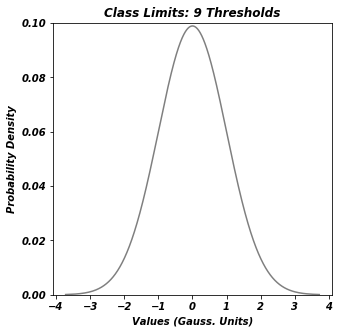

In [627]:
# Example plot for scenario with 9 thresholds
thresh_val = '9'

# Calculate weights for correct probability density values
weights = np.ones(len(yglob_dict['Gauss'])) / len(yglob_dict['Gauss']) # weight data equally
#   prob_wts are the correct probability density values
prob_wts, bins = np.histogram(yglob_dict['Gauss'], bins=30, weights=weights, 
                              normed=True)
prob_dens = prob_wts.sum()

# Generate Figure
fig, ax = plt.subplots(1, 1, figsize=(5,5))

#  Plot as PDF
glob_dist = norm(loc=mu_g, scale=sigma_g)
glob_probs = [glob_dist.pdf(value) for value in yglob_dict['Gauss']]
pdf_yvals = glob_probs/prob_wts.sum() # correctly scaled prob. density values
ax.plot(yglob_dict['Gauss'], pdf_yvals, 'k', alpha=0.5)

# # Compare PDF to gs.histplt and ax.hist as check
# gs.histplt(yglob_dict['Gauss'], bins=30, ax=ax, alpha=0.2, stat_blk='minimal')
# ax.hist(yglob_dict['Gauss'], normed=False, weights=weights, bins=30, alpha=0.3)

ax.set_title('Class Limits: 9 Thresholds')
ax.set_xlabel('Values (Gauss. Units)')
ax.set_ylabel('Probability Density')
ax.set_ylim(0,0.10)

# Plot class means and limits
thresh_xvals = thresh_dict['gauss_cuts'][thresh_val]
cls_lims = class_limits_dict[thresh_val]
glob_cls_mean = global_class_mean_dict[thresh_val]
#  Calculate y-values of class thresholds to intercept pdf
glob_class_yvals = [glob_dist.pdf(value) for value in yglob] / prob_dens
glob_cls_mean_yvals = [glob_dist.pdf(value) for value in \
                       glob_cls_mean] / prob_dens

# Plot class means and shade class limits
for idx, means in enumerate(glob_cls_mean):
    # Plot vertical class-mean lines
    ax.vlines(glob_cls_mean, ymin=0, ymax=glob_cls_mean_yvals, 
              colors='k', linestyles='dashed', alpha=0.3)
    # Plot class boundaries
    mask_cdf = [(yglob > cls_lims[idx][0]) & (yglob <= cls_lims[idx][1])]
    if idx % 2 == 0:
        plt.fill_between(yglob[mask_cdf[0]], 
                         y1=glob_class_yvals[mask_cdf[0]].T.squeeze(), 
                         color='lightgrey', alpha=0.4)
    else:
        plt.fill_between(yglob[mask_cdf], 
                         y1=glob_class_yvals[mask_cdf].T.squeeze(), 
                         color='darkgrey', alpha=0.4)
plt.show()

## Conditional Estimates

Generate empty dictionary to store class mean data:
 - `mc_varc_dict`: conditional mean and variance values from MG Kriging

1. Simulate Gaussian Random Field (RF) with following parameters:
 - $1 \times 1$ units grid of points within a $512 \times 512$ units region
 - Isotropic variogram with single spherical structure and range of 64 units
 
2. Add coordinates and then sample using the following grid spacing sizes (`xygrids`):
 - $8 \times 8$ units 
 - $16 \times 16$ units
 - $32 \times 32$ units
 - $64 \times 64$ units
 - Grids are offset to avoid sampling the same location (`s_offset`)<br>


3. Multivariate Gaussian kriging with the various sample grid data.

4. Split each estimate into 4 equally sized regions, select a different region from each estimate, and then combine into new estimate.

5. Plot conditional mean ($m_c$) and variance ($\sigma^2_c$) values to view sampling of space of uncertainty:
 - Multiply $m_c$ by -1 to double the number of valid $m_c$/$\sigma^2_c$ pairs and improve sample density inside space of uncertainty
 - Reduce sample density by selecting 1 sample from every region defined by 0.04 $m_c$ units and 0.01 $\sigma^2_c$ units
 - `dataflname_dict` stores the output file names for reference
 - `datafl_dict` stores the datafiles (not sure if really useful or not)


6. Store final $m_c$ (`mc`) and $\sigma^2_c$ (`varc`) pairs in dictionary `mc_varc_dict`  

### Gaussian Random Field

In [201]:
sgsim = gs.Program(exedir+'sgsim', getpar=True)

C:\Users\jvinc\Google Drive\02_School\UofA\Masters_Program\03_Research\00_Thesis\03_Jup_Notebooks\02_MIK_Method_Gauss\tmp8gbyfc_o\sgsim.par has been copied to the clipboard


In [202]:
parstr = """                  Parameters for SGSIM
                  ********************

START OF PARAMETERS:
nodata.dat                    -file with data
1  2  0  3  5  0              -  columns for X,Y,Z,vr,wt,sec.var.
-10       1.0e21              -  trimming limits
0                             -transform the data (0=no, 1=yes)
sgsim.trn                     -  file for output trans table
0                             -  consider ref. dist (0=no, 1=yes)
histsmth.out                  -  file with ref. dist distribution
1  2                          -  columns for vr and wt
0.0    15.0                   -  zmin,zmax(tail extrapolation)
1       0.0                   -  lower tail option, parameter
1      15.0                   -  upper tail option, parameter
0                             -debugging level: 0,1,2,3
sgsim.dbg                     -file for debugging output
{outfl}                       -file for simulation output
1                             -number of realizations to generate
{griddef}       
20190531                      -random number seed
20    30                      -min and max original data for sim
20                            -number of simulated nodes to use
1                             -assign data to nodes (0=no, 1=yes)
1     3                       -multiple grid search (0=no, 1=yes),num
0                             -maximum data per octant (0=not used)
64   64   1.0                 -maximum search radii (hmax,hmin,vert)
 0.0   0.0   0.0              -angles for search ellipsoid
51    51    11                -size of covariance lookup table
0      1     1.0              -ktype: 0=SK,1=OK,2=LVM,3=EXDR,4=COLC
../data/ydata.dat             -  file with LVM, EXDR, or COLC variable
4                             -  column for secondary variable
1    0.0                      -nst, nugget effect
1    1  0.0   0.0   0.0       -it,cc,ang1,ang2,ang3
        64    64    1.0       -a_hmax, a_hmin, a_vert
"""


In [203]:
pars = dict(outfl = outdir+'sgsim.out',
            griddef = krig_griddef)
sgsim.run(parstr=parstr.format(**pars), liveoutput=False)

Calling:  ['00_Programs/sgsim', 'temp']


In [204]:
# Add coordinates
addcoord = gs.Program(exedir+'addcoord', getpar=True)

C:\Users\jvinc\Google Drive\02_School\UofA\Masters_Program\03_Research\00_Thesis\03_Jup_Notebooks\02_MIK_Method_Gauss\tmpg3bryq_p\addcoord.par has been copied to the clipboard


In [205]:
parstr = """                  Parameters for ADDCOORD
                  ***********************

START OF PARAMETERS:
{datfl}                          -file with data
{outfl}                          -file for output
1                                -realization number
{griddef}  
"""

In [206]:
pars = dict(datfl = outdir+'sgsim.out',
            outfl = outdir+'addcoord.out',
            griddef = krig_griddef)
addcoord.run(parstr=parstr.format(**pars), liveoutput=False)

Calling:  ['00_Programs/addcoord', 'temp']


### Plot Simulated Data

In [207]:
data = gs.DataFile(outdir+'addcoord.out', x='X', y='Y', z='Z', 
                   griddef=krig_griddef)
data.data.describe()

,X,Y,Z,value
count,262144.000000,262144.000000,262144.0,262144.000000
mean,255.500000,255.500000,0.5,-0.080615
std,147.801669,147.801669,0.0,1.047427
min,0.000000,0.000000,0.5,-3.747924
25%,127.750000,127.750000,0.5,-0.782017
50%,255.500000,255.500000,0.5,-0.101560
75%,383.250000,383.250000,0.5,0.601047
max,511.000000,511.000000,0.5,3.799926


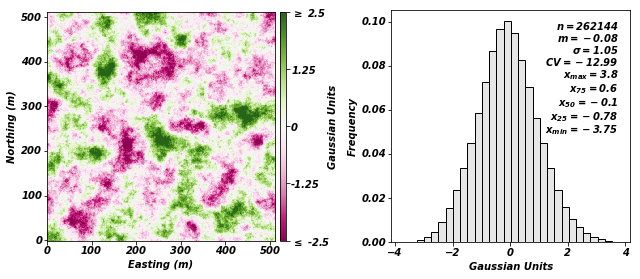

In [208]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,4))
gs.pixelplt(data=data, griddef=krig_griddef, vlim=(-2.5,2.5), title=False, 
            ax=ax1, cmap='PiYG', cbar_label=('Gaussian Units'))
gs.histplt(data.data['value'], bins=30, ax=ax2, ylabel='Frequency',
           xlabel='Gaussian Units')

fig.tight_layout()
plt.show()

### Sample Realization at Various Grid Spacings

In [209]:
gsamp = gs.Program(exedir+'gsample', getpar=True)

C:\Users\jvinc\Google Drive\02_School\UofA\Masters_Program\03_Research\00_Thesis\03_Jup_Notebooks\02_MIK_Method_Gauss\tmpqtuu8ehn\gsample.par has been copied to the clipboard


In [210]:
parstr = """       Parameters for gsample
       **********************
       
START OF PARAMETERS:
1                            - Number of files to sample
{datfl}                      - File with first grid
1  4                         - Number of variables and columns
1                            - Realization to sample
{griddef}
0                            - Sampling spacing option (0=regular, 1=random)
{xyspace}                    -  If 0, spacing in X, Y
{xycoll}                     -  If 0, collar of the first sample, X and Y (inside sampling grid)
10  69069                    -  If 1, number of drill holes and seed number
0  90                        - Azimuth and dip
0.5                          - Sample spacing downhole
001                          - Starting drill hole ID for new drills
2                            - Number of decimal places (coordinates precision, up to 6)
0   512                      - Sampling grid: xmin, xmax
0   512                      -                ymin, ymax
0   0.999                    -                zmin, zmax
{outfl}                      - Output file with new drill holes
0                            - Output keyout file? (0=no, 1=yes)
1                            -  If keyout (0=input grid inside sampling grid, 1=input blocks with assays)
./outputs/keyout.out         - Keyout file
"""

In [211]:
# Set sample grid spacing
xygrids = [[8,8], [16,16], [32,32], [64,64]]
s_offset = [[4,4], [7, 15], [23, 11], [49, 48]] 

In [212]:
# Empty dictionary for sample files
datafl_dict = {}
dataflname_dict = {}
no_samps = []

for i, xypair in enumerate(xygrids):
    a = str(xygrids[i][0])
    b = str(xygrids[i][1])
    xyspace = str(a + '  ' + b) # Sample spacing
    print(f"Sample grid spacing in (x,y): {xygrids[i][0]} x {xygrids[i][1]}")
    
    c = str(int(s_offset[i][0]))
    d = str(int(s_offset[i][1]))
    xycoll = str(c + '  ' + d) # xy collar of first sample
    print(f"Location of first sample in (x,y): "
          f"{s_offset[i][0]} x {s_offset[i][1]}")
    
    # Run gsample program
    pars = dict(datfl = outdir+'addcoord.out',
                griddef = krig_griddef,
                xyspace = xyspace,
                xycoll = xycoll,
                outfl = outdir+'temp.dat')
    gsamp.run(parstr=parstr.format(**pars), liveoutput=False)
    
    # Remove duplicate sample values
    inputsamps = gs.DataFile(outdir+'temp.dat')
    inputsamps = inputsamps[inputsamps['Z'] != 1]
    inputsamps.data.reset_index(drop=True, inplace=True)
    inputsamps.setvarcols(variables=['value'], 
                          notvariables=['Drill ID', 'MD', 'Block ID'])
    
    # Rewrite file with duplicate lines removed
    inputsamps.writefile(outdir+'samples_' + a + '_' + b + '.dat', 
                         fltype='gslib')
    
    # Update dictionary with data file
    datafl_dict.update({str(xygrids[i][0]): inputsamps.data}) # data in file
    dataflname_dict.update({'samp_' + str(xygrids[i][0]): 
                        outdir+'samples_' + a + '_' + b + '.dat'}) # datafile
    a = datafl_dict[str(xygrids[i][0])]['value'].count()
    no_samps.append(a)
    print(f"{a} records in the datafile \n")

Sample grid spacing in (x,y): 8 x 8
Location of first sample in (x,y): 4 x 4
Calling:  ['00_Programs/gsample', 'temp']
4096 records in the datafile 

Sample grid spacing in (x,y): 16 x 16
Location of first sample in (x,y): 7 x 15
Calling:  ['00_Programs/gsample', 'temp']
1024 records in the datafile 

Sample grid spacing in (x,y): 32 x 32
Location of first sample in (x,y): 23 x 11
Calling:  ['00_Programs/gsample', 'temp']
256 records in the datafile 

Sample grid spacing in (x,y): 64 x 64
Location of first sample in (x,y): 49 x 48
Calling:  ['00_Programs/gsample', 'temp']
64 records in the datafile 



In [213]:
prnt_keys(datafl_dict)

Dictionary keys: 
    8
    16
    32
    64


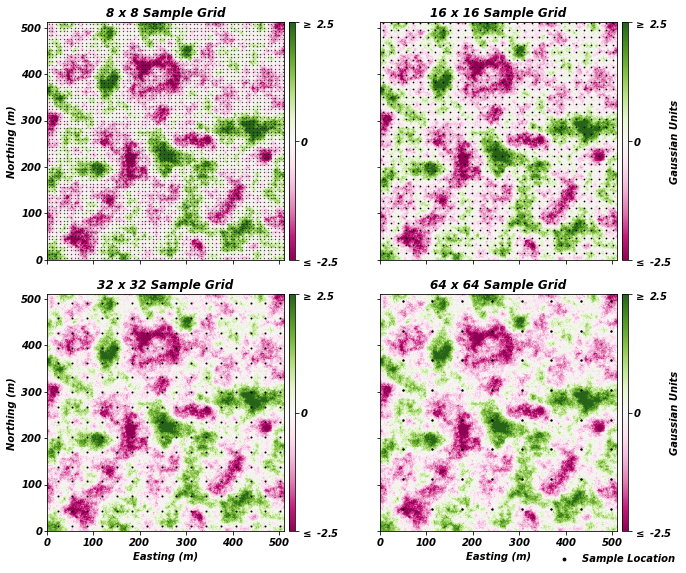

In [214]:
keys = [key for key in datafl_dict.keys()] # copy keys from samplefl_dict
size = [0.1, 0.5, 1.0, 2.0]
cbar_lab = [None, 'Gaussian Units', None, 'Gaussian Units']
fignames = ['Sampled_Gaussian_RF']

# Gaussian Data and Log-Normal Data plots
fig, axes = plt.subplots(2, 2, figsize=(10,8), sharey=True, sharex=True)
# plt.suptitle('Gaussian Random Field', y=0.96)

for i, ax in enumerate(axes.flat):
    ax.scatter(datafl_dict[keys[i]]['X'], datafl_dict[keys[i]]['Y'], 
               s=size[i], c='k', alpha=0.99, marker='o', 
               label='Sample Location')
    gs.pixelplt(data=data.data['value'], griddef=krig_griddef, 
                vlim=(-2.5,2.5), ax=ax, cmap='PiYG', cbar_label=cbar_lab[i], 
                cbar_nticks=3, xlabel=False, ylabel=False, 
                title=f'{keys[i]} x {keys[i]} Sample Grid')
    if i % 2 == 0:
        ax.set_ylabel('Northing (m)')
    if i >= 2:
        ax.set_xlabel('Easting (m)')

# Legend entry
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc = 'best', markerscale=2,
           bbox_to_anchor=(0.95, 0.05), frameon=False)

fig.tight_layout()
# plt.savefig(plt_g_dir+fignames[j]+'.png', dpi=600, transparent=True)
# plt.savefig(ccg_g_dir+fignames[j]+'.pdf', dpi=600, transparent=True)

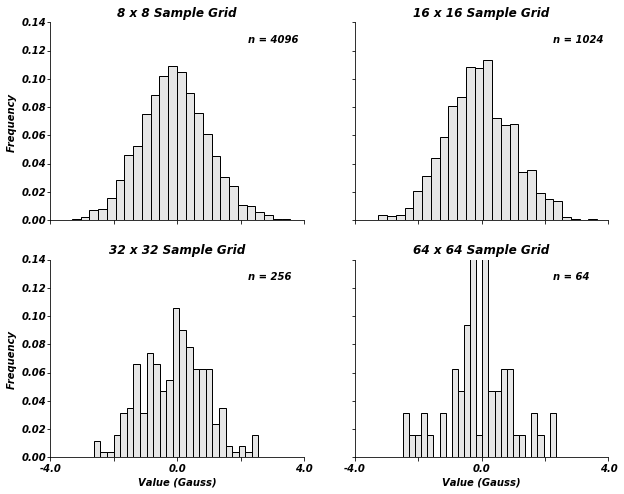

In [215]:
keys = [key for key in datafl_dict.keys()] # copy keys from samplefl_dict

fig, axes = plt.subplots(2, 2, figsize=(10,8), sharey=True, sharex=True)
# plt.suptitle('Gaussian Sample Distribution', y=0.94)

for i, ax in enumerate(axes.flat): 
    gs.histplt(datafl_dict[keys[i]]['value'], bins=25, icdf=False, ax=ax, 
               xlabel=False, ylim=(0, 0.14), ylabel=None, stat_blk=False,
               title=f'{keys[i]} x {keys[i]} Sample Grid')
    ax.text(0.78, 0.90, f'n = {no_samps[i]}', transform=ax.transAxes)

    # X-axis
    ax.set_xlim(-4.0, 4.0)
    ax.xaxis.set_ticks(np.arange(-4.0, 4.01, 2))
    xlab = [item.get_text() for item in ax.get_xticklabels()]
    xstr_labels = ['-4.0', '', '0.0', '', '4.0']
    ax.set_xticklabels(xstr_labels)

    # Y-axis
#     ax.set_ylim(0.0, 0.14)
#     ax.yaxis.set_ticks(np.arange(0.0, 0.14, 0.2))
#     ylab = [item.get_text() for item in ax.get_yticklabels()]
#     ystr_labels = ['0.0', '', '', '', '', '0.10', '', '']
#     ax.set_yticklabels(ystr_labels)

    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    if i >= 2:
        ax.set_xlabel('Value (Gauss)')
    if i == 0 or i == 2:
        ax.set_ylabel('Frequency')

plt.savefig(plt_g_dir+'Global_CDF_GaussRF.png', dpi=600, transparent=True)
plt.savefig(ccg_g_dir+'Global_CDF_GaussRF.pdf', dpi=600, transparent=True)

### Combine Samples

In [216]:
print(f"Splitting and recombining samples...")

# Split grid into 4 equal subgrids. Use middle coordinate in x,y (256, 256) 
xsplit, ysplit = 256., 256.
smpdf = pd.DataFrame()
for k, v in datafl_dict.items():
    if k == '8':
        tmp = v.loc[(v['X'] < xsplit) & (v['Y'] < ysplit)]
    elif k == '16':
        tmp = v.loc[(v['X'] >= xsplit) & (v['Y'] < ysplit)]
    elif k == '32':
        tmp = v.loc[(v['X'] >= xsplit) & (v['Y'] >= ysplit)]
    elif k == '64':
        tmp = v.loc[(v['X'] < xsplit) & (v['Y'] >= ysplit)]
    smpdf = pd.concat([smpdf, tmp], axis=0, sort=False)
smpdf.drop(columns=['MD', 'Block ID'], inplace=True)

# check for duplicates:
smpdf.sort_values(['X', 'Y'], inplace=True)
smpdf.drop_duplicates(['X', 'Y'], keep=False, inplace=True)

# Add equivalent LN-value based on alpha and beta parameters
print(f"Calculating equivalent log-normal sample value with "
      f"\u03b1 = {alpha:.3f} and \u03b2 = {beta:.3f} parameters.")
smpdf['ln_value'] = np.exp(smpdf['value'] * beta + alpha)

# Convert to DataFile and export
print(f"Exporting to data file. \nSummary statistics are: ")
samps = gs.DataFile(data=smpdf, variables=['value', 'ln_value'])
gs.write_gslib(samps, flname=outdir+'samps.out')
samps.data.describe()

Splitting and recombining samples...
Calculating equivalent log-normal sample value with α = -0.805 and β = 1.269 parameters.
Exporting to data file. 
Summary statistics are: 


,Drill ID,X,Y,Z,value,ln_value
count,1360.000000,1360.000000,1360.000000,1360.0,1360.000000,1360.000000
mean,818.923529,188.576471,144.329412,0.5,-0.144129,0.992894
std,614.485634,131.479597,95.024401,0.0,1.076983,2.496849
min,1.000000,4.000000,4.000000,0.5,-3.325600,0.006580
25%,260.750000,84.000000,68.000000,0.5,-0.857325,0.150717
50%,664.500000,168.000000,140.000000,0.5,-0.176700,0.357405
75%,1356.250000,252.000000,204.000000,0.5,0.567550,0.918784
max,2016.000000,503.000000,496.000000,0.5,3.645500,45.608516


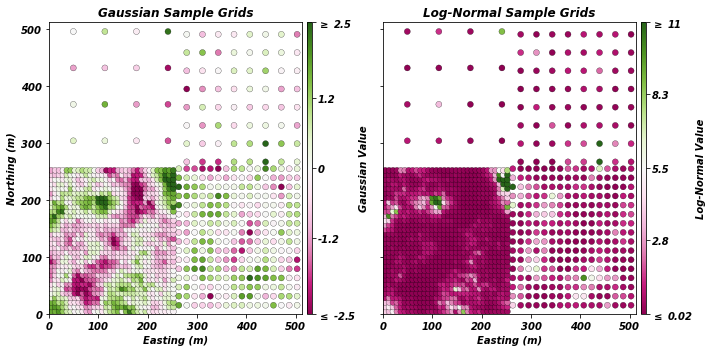

In [217]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
gs.scatplt(x=samps['X'], y=samps['Y'], c=samps['value'], cmap='PiYG',
           xlabel='Easting (m)', ylabel='Northing (m)', xlim=(0,512), 
           ylim=(0,512), cbar=True, cbar_label='Gaussian Value', 
           clim=(-2.5,2.5), ax=ax1, edgecolor='k', linewidth=0.25,
           title='Gaussian Sample Grids', stat_blk=False)
gs.scatplt(x=samps['X'], y=samps['Y'], c=samps['ln_value'], cmap='PiYG',
           xlabel='Easting (m)', ylabel=False, xlim=(0,512), ylim=(0,512), 
           cbar=True, cbar_label='Log-Normal Value', clim=(0.02,11), ax=ax2, 
           edgecolor='k', linewidth=0.25, title='Log-Normal Sample Grids',
           stat_blk=False)
fig.tight_layout()
plt.show()

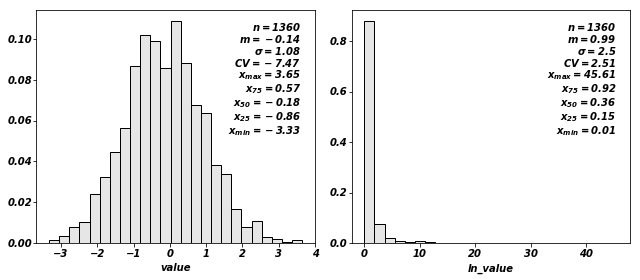

In [218]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4), sharey=False)
gs.histplt(samps['value'], bins=25, ax=ax1)
gs.histplt(samps['ln_value'], bins=25, ax=ax2)
fig.tight_layout()
plt.show()

### MG Kriging

In [219]:
kt3dn = gs.Program(exedir+'kt3dn', getpar=True)

C:\Users\jvinc\Google Drive\02_School\UofA\Masters_Program\03_Research\00_Thesis\03_Jup_Notebooks\02_MIK_Method_Gauss\tmp93xz5th8\kt3dn.par has been copied to the clipboard


In [220]:
parstr = """                 Parameters for KT3DN
                 ********************

START OF PARAMETERS:
{datfl}                          -file with data
1  2  3  4  {col}  0             -   columns for DH,X,Y,Z,var,sec var
-5   5                           -   trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
kt3dn_dataspacing.out            -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
0    100                         -debugging level: 0,3,5,10; max data for GSKV
{dbg}                            -file for debugging output
{outfl}                          -file for kriged output
{griddef} 
1    1      1                    -x,y and z block discretization
16   24   12    1                -min, max data for kriging,upper max for ASO,ASO incr
0      0                         -max per octant, max per drillhole (0-> not used)
512  512   1.0                   -maximum search radii
 0.0   0.0   0.0                 -angles for search ellipsoid
0                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift
{mean}   0   0                   -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
extdrift.out                     -gridded file with drift/mean
4                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
1    0.0                         -nst, nugget effect
1    1.0  0.0   0.0   0.0        -it,cc,ang1,ang2,ang3
     64  64   1.0                -a_hmax, a_hmin, a_vert
"""

In [221]:
print("Kriging Gaussian Data") 
pars = dict(datfl = outdir + 'samps.out',
            col = 5,
            dbg = outdir + 'kt3dn.dbg',
            outfl = outdir + 'kt3dn.out',
            griddef = krig_griddef,
            mean = mu_g)
kt3dn.run(parstr=parstr.format(**pars), liveoutput=False)

# Update datafile name dictionary
dataflname_dict.update({'mg_krig': outdir + 'kt3dn.out'})
print("Estimation finished.")

Kriging Gaussian Data
Calling:  ['00_Programs/kt3dn', 'temp']
Estimation finished.


### Addcoords to estimates

In [222]:
# Add coordinates to estimate
addcoord = gs.Program(exedir+'addcoord', getpar=True)

C:\Users\jvinc\Google Drive\02_School\UofA\Masters_Program\03_Research\00_Thesis\03_Jup_Notebooks\02_MIK_Method_Gauss\tmpcx2rsufa\addcoord.par has been copied to the clipboard


In [223]:
parstr = """                  Parameters for ADDCOORD
                  ***********************

START OF PARAMETERS:
{datafl}                          -file with data
{outfl}                           -file for output
1                                 -realization number
{griddef}
"""

In [224]:
pars = dict(datafl = dataflname_dict['mg_krig'],
            outfl = outdir + 'mgest.out', griddef = krig_griddef)             
addcoord.run(parstr=parstr.format(**pars), liveoutput=False)

# Update data file dictionary
dataflname_dict.update({'mgest': outdir + 'mgest.out'})

# Import datafile
print(f"    Importing file:")
mgest = gs.DataFile(flname=dataflname_dict['mgest'], 
                    columns=['X', 'Y', 'Z', 'MG_Mean', 'MG_Var'])

# Flag original estimates
mgest.data['Orig_Est'] = 1.

# Update dictionary
datafl_dict.update({'MG': mgest.data}) # data in file
print(datafl_dict['MG'].describe())
print()

Calling:  ['00_Programs/addcoord', 'temp']
    Importing file:
                   X              Y         Z        MG_Mean         MG_Var  \
count  262144.000000  262144.000000  262144.0  262144.000000  262144.000000   
mean      255.500000     255.500000       0.5      -0.069247       0.320767   
std       147.801669     147.801669       0.0       0.888433       0.259826   
min         0.000000       0.000000       0.5      -3.325600       0.000000   
25%       127.750000     127.750000       0.5      -0.623337       0.099734   
50%       255.500000     255.500000       0.5      -0.069142       0.202465   
75%       383.250000     383.250000       0.5       0.481547       0.416820   
max       511.000000     511.000000       0.5       3.645500       0.999772   

       Orig_Est  
count  262144.0  
mean        1.0  
std         0.0  
min         1.0  
25%         1.0  
50%         1.0  
75%         1.0  
max         1.0  



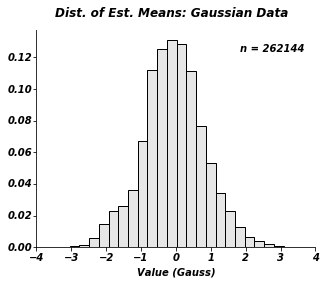

In [225]:
no_samp = datafl_dict['MG']['MG_Mean'].count()

fig, ax = plt.subplots(1, 1, figsize=(5,4))
plt.suptitle(f'Dist. of Est. Means: Gaussian Data', y=0.96)
gs.histplt(datafl_dict['MG']['MG_Mean'], bins=25, icdf=False, ax=ax, 
           xlabel=('Value (Gauss)'), xlim=(-4,4), stat_blk=False)
ax.text(0.73, 0.90, f'n = {no_samp}', transform=ax.transAxes)


ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# plt.savefig(pltdir + 'hist_mgest.png', dpi=600, transparent=True)
# plt.savefig(ccgdir + 'hist_mgest.pdf', dpi=600, transparent=True)

### Relationship of Conditional Mean and Variance

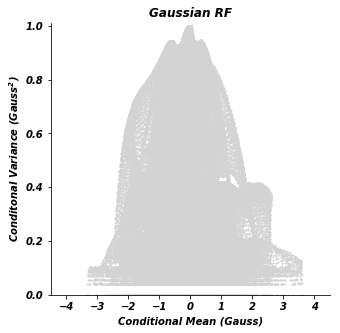

In [226]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))

ax.scatter(datafl_dict['MG']['MG_Mean'], 
           datafl_dict['MG']['MG_Var'], c='lightgrey', s=1)
ax.set_title('Gaussian RF')

ax.set_xlim(-4.5, 4.5)
ax.set_ylim(0, 1.01)

ax.set_xlabel('Conditional Mean (Gauss)')
ax.set_ylabel('Conditonal Variance (Gauss$^2$)')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.show()

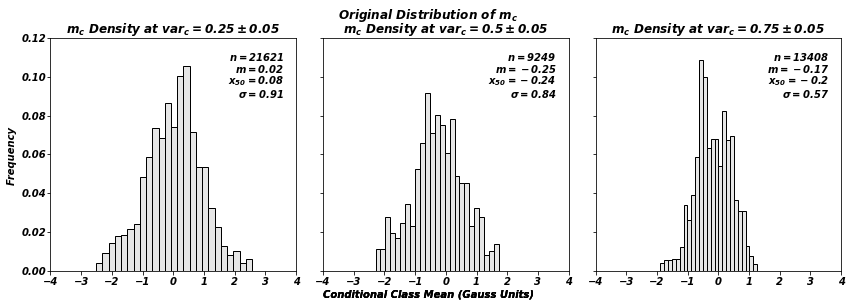

In [734]:
# Plot histogram of m_c data density along chosen var_c +/- 0.05
varc = [0.25, 0.50, 0.75] # var_c intervals

dat = datafl_dict['MG']
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)
plt.suptitle(r'Original Distribution of $m_c$', y=1.01)

for i, v in enumerate(varc):
    mc_hist = dat.loc[(dat['MG_Var'] >= varc[i] - 0.05) &
                      (dat['MG_Var'] <= varc[i] + 0.05)]

    gs.histplt(mc_hist['MG_Mean'].values, bins=25, ax=axes[i], xlabel=None,
               xlim=(-4,4), stat_blk='minimal', ylim=(0,0.12),
               title=f'$m_c$ Density at $var_c = {varc[i]} \pm 0.05$')
    fig.text(0.5, 0.001, 'Conditional Class Mean (Gauss Units)', ha='center')
axes[0].set_ylabel('Frequency')    
fig.tight_layout()    
plt.show()

### Multiply $m_c$ by -1 to Double Number of Valid Pairs

In [227]:
print(f"Multiplying conditional means by -1...")
# Temp dataframe to hold additonal m_c values (m_c * -1)
temp_df = datafl_dict['MG'].copy(deep=True)
temp_df.drop(columns=['Orig_Est'], inplace=True) # drop copied values
temp_df['Orig_Est'] = 10.
temp_df['MG_Mean'] = datafl_dict['MG']['MG_Mean'].values * -1

# Concatenate with original dataframe and overwrite 
mc_varc_pairs_df = pd.DataFrame()
mc_varc_pairs_df = pd.concat([datafl_dict['MG'], temp_df], ignore_index=True)
mc_varc_pairs_df['MG_StDev'] = mc_varc_pairs_df['MG_Var'] ** (1/2)

# Verify 'Orig_Est' flag values
orig_ests = len(mc_varc_pairs_df.loc[mc_varc_pairs_df['Orig_Est'] == 1.])
dup_ests = len(mc_varc_pairs_df.loc[mc_varc_pairs_df['Orig_Est'] == 10.])
print(f"Updated dictionary has {orig_ests} original values and "
      f"{dup_ests} new values.")

Multiplying conditional means by -1...
Updated dictionary has 262144 original values and 262144 new values.


In [228]:
# Flag original data locations
mc_varc_pairs_df['Dat_Loc'] = 10
mc_varc_pairs_df.loc[mc_varc_pairs_df['MG_Var'] == 0., 'Dat_Loc'] = 1.
orig_locs = len(mc_varc_pairs_df.loc[(mc_varc_pairs_df['Dat_Loc'] == 1.) &
                                     (mc_varc_pairs_df['Orig_Est'] == 1.)])

print(f"Number of original data locations: {orig_locs}")

# Reorder df columns and sort
mc_varc_pairs_df = mc_varc_pairs_df[['X', 'Y', 'Z', 'Orig_Est', 'Dat_Loc', 
                                     'MG_Mean', 'MG_Var', 'MG_StDev']]
mc_varc_pairs_df.sort_values(by=['Y', 'X', 'Orig_Est'], inplace=True)

# Update datafile dictionary with combined model
datafl_dict.update({'mc_varc_pairs': mc_varc_pairs_df}) 
print(f"Updated dataframe has {mc_varc_pairs_df['MG_Mean'].count()} records.")
mc_varc_pairs_df.describe()

Number of original data locations: 1360
Updated dataframe has 524288 records.


,X,Y,Z,Orig_Est,Dat_Loc,MG_Mean,MG_Var,MG_StDev
count,524288.000000,524288.000000,524288.0,524288.000000,524288.000000,524288.000000,524288.000000,524288.000000
mean,255.500000,255.500000,0.5,5.500000,9.953308,0.000000,0.320767,0.521351
std,147.801528,147.801528,0.0,4.500004,0.646566,0.891127,0.259826,0.221270
min,0.000000,0.000000,0.5,1.000000,1.000000,-3.645500,0.000000,0.000000
25%,127.750000,127.750000,0.5,1.000000,10.000000,-0.559195,0.099734,0.315807
50%,255.500000,255.500000,0.5,5.500000,10.000000,0.000000,0.202465,0.449961
75%,383.250000,383.250000,0.5,10.000000,10.000000,0.559195,0.416820,0.645616
max,511.000000,511.000000,0.5,10.000000,10.000000,3.645500,0.999772,0.999886


In [229]:
# Filter estimate files with -1*m_c values into new dictionary:
mc_varc_dict = {k: v for k, v in datafl_dict.items() if k.endswith('pairs')}
prnt_keys(mc_varc_dict)

Dictionary keys: 
    mc_varc_pairs


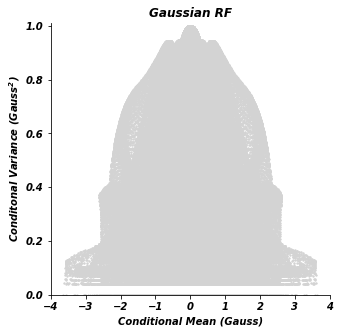

In [230]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))

ax.scatter(mc_varc_dict['mc_varc_pairs']['MG_Mean'], 
           mc_varc_dict['mc_varc_pairs']['MG_Var'], 
           c='lightgrey', s=2)
ax.set_title('Gaussian RF')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_xlim(-4.0, 4.0)
ax.set_ylim(0, 1.01)
ax.set_xlabel('Conditional Mean (Gauss)')
ax.set_ylabel('Conditonal Variance (Gauss$^2$)')

plt.show()
# plt.savefig(pltdir + 'bivar_mc_mv_-1_mgest.png', dpi=600, transparent=True)
# plt.savefig(ccgdir + 'bivar_mc_mv_-1_mgest.pdf', dpi=600, transparent=True)

In [705]:
dat = mc_varc_dict['mc_varc_pairs']
dat

,X,Y,Z,Orig_Est,Dat_Loc,MG_Mean,MG_Var,MG_StDev
0,0.0,0.0,0.5,1.0,10.0,1.487787,0.240188,0.490090
262144,0.0,0.0,0.5,10.0,10.0,-1.487787,0.240188,0.490090
1,1.0,0.0,0.5,1.0,10.0,1.519278,0.214085,0.462693
262145,1.0,0.0,0.5,10.0,10.0,-1.519278,0.214085,0.462693
2,2.0,0.0,0.5,1.0,10.0,1.549542,0.191531,0.437643
...,...,...,...,...,...,...,...,...
524285,509.0,511.0,0.5,10.0,10.0,0.792559,0.702435,0.838114
262142,510.0,511.0,0.5,1.0,10.0,-0.794188,0.709202,0.842141
524286,510.0,511.0,0.5,10.0,10.0,0.794188,0.709202,0.842141
262143,511.0,511.0,0.5,1.0,10.0,-0.793864,0.716602,0.846523


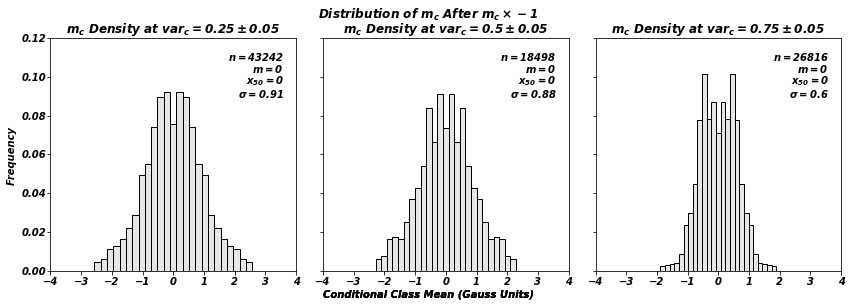

In [736]:
# Plot histogram of m_c data density along chosen var_c +/- 0.05
varc = [0.25, 0.50, 0.75] # var_c intervals

dat = mc_varc_dict['mc_varc_pairs']
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)
plt.suptitle(r'Distribution of $m_c$ After $m_c \times -1$', y=1.01)

for i, v in enumerate(varc):
    mc_hist = dat.loc[(dat['MG_Var'] >= varc[i] - 0.05) &
                      (dat['MG_Var'] <= varc[i] + 0.05)]

    gs.histplt(mc_hist['MG_Mean'].values, bins=25, ax=axes[i], xlabel=None,
               xlim=(-4,4), stat_blk='minimal', ylim=(0,0.12),
               title=f'$m_c$ Density at $var_c = {varc[i]} \pm 0.05$')
    fig.text(0.5, 0.001, 'Conditional Class Mean (Gauss Units)', ha='center')
axes[0].set_ylabel('Frequency')    
fig.tight_layout()    
plt.show()

### Decimate Data

In [231]:
# Generate m_c and var_c bins 
mc_bins = np.arange(-4.0, 4.04, 0.04)
varc_bins = np.arange(0, 1.01, 0.01)

In [232]:
# Select at random, one m_c, var_c pair in each bin, to reduce sample density
print('Decimating data...')
temp = mc_varc_dict['mc_varc_pairs'].copy(deep=True)
newdf = pd.DataFrame(columns=mc_varc_dict['mc_varc_pairs'].columns)
for mc in mc_bins:
    lt = mc - 0.020
    ut = mc + 0.020
    temp2 = temp[(temp['MG_Mean']>=lt) & 
                 (temp['MG_Mean']<=ut)].copy(deep=True)
    if len(temp2) == 1:
        newdf = pd.concat([newdf,temp2], axis=0, ignore_index=True)
    if len(temp2) > 1:
        for vc in varc_bins:
            lt = vc - 0.005
            ut = vc + 0.005
            temp3 = temp2[(temp2['MG_Var']>=lt) & 
                          (temp2['MG_Var']<=ut)].copy(deep=True)
            if len(temp3) == 1:
                newdf = pd.concat([newdf, temp3], axis=0, 
                                  ignore_index=True)
            if len(temp3) > 1:
                temp4 = temp3.sample(n=1) # randomly choose 1 sample in bin
                newdf = pd.concat([newdf, temp4], axis=0, 
                                  ignore_index=True)
# Summary
orig_locs = len(newdf.loc[(newdf['Dat_Loc'] == 1.) & 
                          (newdf['Orig_Est'] == 1.)])
dup_locs = len(newdf.loc[(newdf['Dat_Loc'] == 1.) & 
                         (newdf['Orig_Est'] == 10.)])
orig_ests = len(newdf.loc[newdf['Orig_Est'] == 1.])
dup_ests = len(newdf.loc[newdf['Orig_Est'] == 10.])
print(f"    There are {len(newdf['X'])} records in the dataframe:")
print(f"    {orig_locs} original data locations, \n"
      f"    {dup_locs} duplicate data locations, \n"
      f"    {orig_ests} original estimates, \n"
      f"    {dup_ests} duplicate estimates.")
print("Finished.")

Decimating data...
    There are 10342 records in the dataframe:
    73 original data locations, 
    84 duplicate data locations, 
    5149 original estimates, 
    5193 duplicate estimates.
Finished.


In [233]:
# Sort df and remove location (X,Y) duplicates
print("Sorting and identifying duplicate locations...")
newdf.sort_values(by=['Y', 'X', 'Orig_Est'], ignore_index=True, inplace=True)
mask = newdf.duplicated(['X', 'Y', 'MG_Var'], keep='first')
print(f"Identified {newdf['X'][mask].count()} duplicate values.")
print("Deleting duplicates...")
newdf.drop(newdf[mask].index, inplace=True)

# Export combined model to file
print(f"Exporting final conditional mean and variance pairs to: "
      f"{outdir + 'final_mc_varc_pairs.out'}\n")
gs.write_gslib(newdf, outdir + 'final_mc_varc_pairs.out')

# Update datafile dictionary with combined model
mc_varc_dict.update({'final_mc_varc_pairs': newdf}) # data in file

# Summary
orig_locs = len(newdf.loc[(newdf['Dat_Loc'] == 1.) & 
                          (newdf['Orig_Est'] == 1.)])
dup_locs = len(newdf.loc[(newdf['Dat_Loc'] == 1.) & 
                         (newdf['Orig_Est'] == 10.)])
orig_ests = len(newdf.loc[newdf['Orig_Est'] == 1.])
dup_ests = len(newdf.loc[newdf['Orig_Est'] == 10.])
print(f"    There are {len(newdf['X'])} records in the dataframe:")
print(f"    {orig_locs} original data locations, \n"
      f"    {dup_locs} duplicate data locations, \n"
      f"    {orig_ests} original estimates, \n"
      f"    {dup_ests} duplicate estimates.")
print("Finished.")
newdf.describe(include='all')

Sorting and identifying duplicate locations...
Identified 660 duplicate values.
Deleting duplicates...
Exporting final conditional mean and variance pairs to: 01_Outputs/final_mc_varc_pairs.out

    There are 9682 records in the dataframe:
    73 original data locations, 
    68 duplicate data locations, 
    5149 original estimates, 
    4533 duplicate estimates.
Finished.


,X,Y,Z,Orig_Est,Dat_Loc,MG_Mean,MG_Var,MG_StDev
count,9682.000000,9682.000000,9682.0,9682.000000,9682.000000,9682.000000,9682.000000,9682.000000
mean,259.051229,309.652964,0.5,5.213696,9.868932,-0.017098,0.406682,0.598531
std,128.011532,126.851541,0.0,4.491115,1.078217,1.422264,0.254551,0.220108
min,0.000000,0.000000,0.5,1.000000,1.000000,-3.572550,0.000000,0.000000
25%,176.250000,237.000000,0.5,1.000000,10.000000,-1.103389,0.182018,0.426636
50%,251.000000,317.000000,0.5,1.000000,10.000000,-0.033488,0.377768,0.614628
75%,343.000000,407.000000,0.5,10.000000,10.000000,1.027193,0.608056,0.779779
max,511.000000,511.000000,0.5,10.000000,10.000000,3.645500,0.999169,0.999584


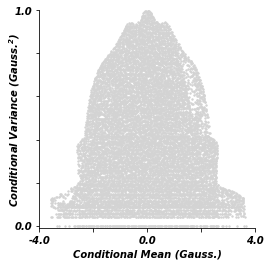

In [234]:
# Display final bivariate m_c/var_c plots
fig, ax = plt.subplots(1, 1, figsize=(4,4))
ax.scatter(mc_varc_dict['final_mc_varc_pairs']['MG_Mean'], 
           mc_varc_dict['final_mc_varc_pairs']['MG_Var'], c='lightgrey', s=2)
# ax.set_title('Gaussian RF')

# X-axis
ax.set_xlim(-4.0, 4.0)
ax.xaxis.set_ticks(np.arange(-4.0, 4.01, 2))
xlab = [item.get_text() for item in ax.get_xticklabels()]
xstr_labels = ['-4.0', '', '0.0', '', '4.0']
ax.set_xticklabels(xstr_labels)
ax.set_xlabel('Conditional Mean (Gauss.)')

# Y-axis
ax.set_ylim(-0.01, 1.0)
ax.yaxis.set_ticks(np.arange(0.0, 1.01, 0.2))
ylab = [item.get_text() for item in ax.get_yticklabels()]
ystr_labels = ['0.0', '', '', '', '', '1.0']
ax.set_yticklabels(ystr_labels)
ax.yaxis.set_label_coords(-0.08, 0.50)
ax.set_ylabel('Conditional Variance (Gauss.$^2$)')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

fig.subplots_adjust(left=0.15)

# Save fig
plt.savefig(plt_g_dir + 'bivar_mc_mv.png', dpi=600, transparent=True)
plt.savefig(ccg_g_dir + 'bivar_mc_mv.pdf', dpi=600, transparent=True)

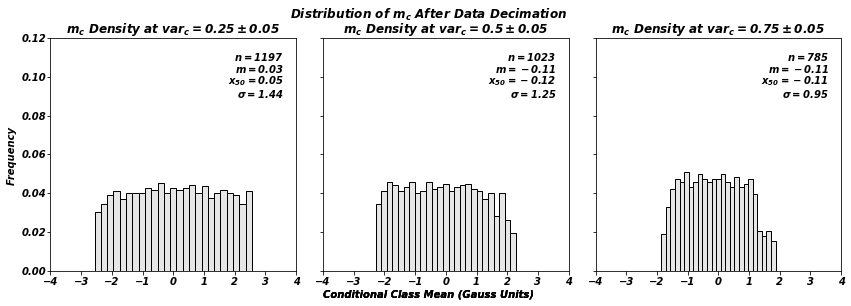

In [733]:
# Plot histogram of m_c data density along chosen var_c +/- 0.05
varc = [0.25, 0.50, 0.75] # var_c intervals

dat = mc_varc_dict['final_mc_varc_pairs']
fig, axes = plt.subplots(1, 3, figsize=(12, 4), sharey=True)
plt.suptitle(r'Distribution of $m_c$ After Data Decimation', y=1.01)

for i, v in enumerate(varc):
    mc_hist = dat.loc[(dat['MG_Var'] >= varc[i] - 0.05) &
                      (dat['MG_Var'] <= varc[i] + 0.05)]

    gs.histplt(mc_hist['MG_Mean'].values, bins=25, ax=axes[i], xlabel=None,
               xlim=(-4,4), stat_blk='minimal', ylim=(0,0.12),
               title=f'$m_c$ Density at $var_c = {varc[i]} \pm 0.05$')
    fig.text(0.5, 0.001, 'Conditional Class Mean (Gauss Units)', ha='center')
axes[0].set_ylabel('Frequency')    
fig.tight_layout()    
plt.show()

### Final Conditional Mean and Variance Pairs

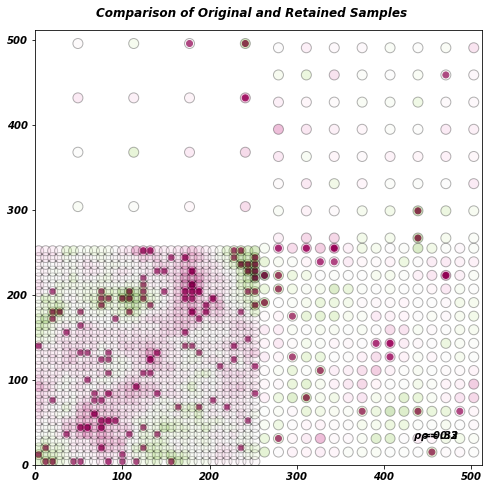

In [235]:
test = mc_varc_dict['final_mc_varc_pairs']
Xs = test.loc[test['MG_Var'] == 0]['X'].values
Ys = test.loc[test['MG_Var'] == 0]['Y'].values
dats = test.loc[test['MG_Var'] == 0]['MG_Var'].values

fig, ax = plt.subplots(1,1, figsize=(8,8))
plt.suptitle('Comparison of Original and Retained Samples', y=0.92)
gs.scatplt(Xs, Ys, c=dats, cmap='PiYG', ax=ax, alpha=1.0, xlim=(0,512), 
           ylim=(0,512))
gs.scatplt(samps.data['X'].values, samps.data['Y'].values, 
           c=samps.data['value'].values, ax=ax, s=100, alpha=0.3, cmap='PiYG', 
           xlim=(0,512), ylim=(0,512), edgecolor='k')
plt.show()

In [236]:
# Split final pairs into data locations and estimate locations 
#  Data locations (where var_c = 0)
datloc_df = mc_varc_dict['final_mc_varc_pairs'].copy(deep=True)
datloc_df = datloc_df.loc[datloc_df['MG_Var'] == 0]
datloc_df.reset_index(drop=True, inplace=True)
mc_varc_dict.update({'datlocs': datloc_df})

#  Estimate locations (where var_c != 0)
estloc_df = mc_varc_dict['final_mc_varc_pairs'].copy(deep=True)
estloc_df = estloc_df.loc[estloc_df['MG_Var'] != 0]
estloc_df.reset_index(drop=True, inplace=True)
mc_varc_dict.update({'estlocs': estloc_df})

prnt_keys(mc_varc_dict)

tot_locs = mc_varc_dict['final_mc_varc_pairs']['MG_Mean'].count()
dat_locs = mc_varc_dict['datlocs']['MG_Mean'].count()
est_locs = mc_varc_dict['estlocs']['MG_Mean'].count()

print(f"There are {tot_locs} m_c/var_c pairs. Of those, {dat_locs} " 
      f"represent data locations and {est_locs} represent estimate "
      f"locations. \nEstimate locations are used to assess class mean "
      f"behaviour.")

Dictionary keys: 
    mc_varc_pairs
    final_mc_varc_pairs
    datlocs
    estlocs
There are 9682 m_c/var_c pairs. Of those, 141 represent data locations and 9541 represent estimate locations. 
Estimate locations are used to assess class mean behaviour.


In [237]:
# Convert dictionary dataframes to arrays for faster processing
estlocs_arr = mc_varc_dict['estlocs'].to_numpy(copy=True)

# Identify mean, var, st.dev. column indices
mean_idx = mc_varc_dict['estlocs'].columns.get_loc('MG_Mean') 
var_idx = mc_varc_dict['estlocs'].columns.get_loc('MG_Var') 
std_idx = mc_varc_dict['estlocs'].columns.get_loc('MG_StDev') 

print(f"Shape of estlocs array: {estlocs_arr.shape}")
print(f"Column indices for reference: \n"
      f"    m_c: {mean_idx} \n"
      f"    var_c: {var_idx} \n"
      f"    std_c: {std_idx} ")
print("\nBasic statistics of estlocs array: ")
mc_varc_dict['estlocs'].describe()

Shape of estlocs array: (9541, 8)
Column indices for reference: 
    m_c: 5 
    var_c: 6 
    std_c: 7 

Basic statistics of estlocs array: 


,X,Y,Z,Orig_Est,Dat_Loc,MG_Mean,MG_Var,MG_StDev
count,9541.000000,9541.000000,9541.0,9541.000000,9541.0,9541.000000,9541.000000,9541.000000
mean,260.283828,311.991301,0.5,5.211823,10.0,-0.017580,0.412692,0.607377
std,127.820848,125.777732,0.0,4.490999,0.0,1.417533,0.251542,0.209262
min,0.000000,0.000000,0.5,1.000000,10.0,-3.572550,0.040324,0.200808
25%,179.000000,246.000000,0.5,1.000000,10.0,-1.100051,0.188718,0.434417
50%,251.000000,320.000000,0.5,1.000000,10.0,-0.033908,0.382891,0.618782
75%,344.000000,408.000000,0.5,10.000000,10.0,1.024102,0.613015,0.782953
max,511.000000,511.000000,0.5,10.000000,10.0,3.616690,0.999169,0.999584


## Conditional Class Means

Update `local_cls_mean` dictionary with conditional class mean data:
 
Sub-dictionaries:
 - `Gauss`: Gaussian values for each threshold scenario
 - `G_LN` : Gaussian values underlying the log-normal distribution
 - `LN`: Log-normal values for each threshold scenario

The `LN` distribution is derived from the `G_LN` distribution quantiles, which is calculated as:
$ Y_{G\_LN} = Y_{Gauss} * \beta + \alpha $

`ycond` stores conditonal quantile values based on `m_c` and `std_c`

### Generate Conditional Quantiles

In [238]:
# Isolate conditional mean and variance 
mu_c = estlocs_arr[:, mean_idx].copy() 
sigma_c = estlocs_arr[:, std_idx].copy() 

# Reshape pvalues (broadcast to calculate conditional dist at all locations)
pvals = pvals.reshape(L, 1)

# Ensure there are no NaN values in mean and stdev, arrays
if ((np.count_nonzero(np.isnan(mu_c)) != 0) or 
    (np.count_nonzero(np.isnan(sigma_c)) != 0)):
    print("Error! Check calculation of m_c/std_c arrays!")

In [239]:
# Calculate conditional quantiles, convert to log_normal and store in dict
#  Create dictionary
cond_quants_dict = {}
keys = [k for k in cutoff_dict.keys()]

#  Calculate conditional quanitles and update dictionary
y_gauss = stats.norm.ppf(pvals, loc=mu_c, scale=sigma_c) 
cond_quants_dict.update({'Gauss': y_gauss})

y_gln = y_gauss * beta + alpha
cond_quants_dict.update({'G_LN': y_gln})

z_ln = np.exp(y_gln)
cond_quants_dict.update({'LN': z_ln})

print("Conditional mean ranges: ")
for k, v in cond_quants_dict.items():
    print(f"    {k} min value: {cond_quants_dict[k].min():.3f}")
    print(f"    {k} max value: {cond_quants_dict[k].max():.3f}\n")
    if ((cond_quants_dict[k].shape != (L, est_locs)) or 
        (np.count_nonzero(np.isnan(cond_quants_dict[k])) != 0)):
        print("Error! Check quantile cals!")
        break
prnt_keys(cond_quants_dict)

Conditional mean ranges: 
    Gauss min value: -5.019
    Gauss max value: 5.016

    G_LN min value: -7.172
    G_LN max value: 5.559

    LN min value: 0.001
    LN max value: 259.595

Dictionary keys: 
    Gauss
    G_LN
    LN


#### Check Conditional Quantile Calculation Methodology

In [240]:
# Select random percentile and location index
pct_val = random.choice(pvals) # Select percentile
pct_tst = np.where(pvals == pct_val) # Locate index of percentile
loc_tst = np.random.randint(0, cond_quants_dict['Gauss'].shape[0]) # Select location index
print(f"Percentile selected: {pct_val[0]:.4f}")
print(f"Testing location index: {loc_tst}")
print(f"Quantile at location index {loc_tst} using percentile "
      f"{pct_val[0]:.4f}: {y_gauss[pct_tst[0][0], loc_tst]:.4f}"
     )

Percentile selected: 0.9439
Testing location index: 4520
Quantile at location index 4520 using percentile 0.9439: 0.8553


In [241]:
# Check quantile manually using selected percentile and location index
check_val = stats.norm.ppf(pct_val, mu_c[loc_tst], sigma_c[loc_tst])
print(f"Manually calculated quantile at location index {loc_tst} "
      f"using percentile {pct_val[0]:.4f}: {check_val[0]:.4f}"
     )
print(f"Does the check match calculated value? "
      f"{isclose(y_gauss[pct_tst[0][0], loc_tst], check_val[0])}"
     )

Manually calculated quantile at location index 4520 using percentile 0.9439: 0.8553
Does the check match calculated value? True


### Calculate

In [242]:
# Temporary dict to update with class means for each thresh scenario
update_m_dict = dict.fromkeys([key for key in cutoff_dict.keys()]) # cls means
update_s_dict = copy.deepcopy(update_m_dict) # cls stdev
update_cov_dict = copy.deepcopy(update_m_dict) # cls CoV (for LN data only)
update_tmp_m_dict = copy.deepcopy(update_m_dict) # mean of cls means
update_tmp_s_dict = copy.deepcopy(update_m_dict) # stdev of cls means
update_tmp_c_dict = copy.deepcopy(update_m_dict) # CoV of cls means
update_tmp_l_dict = copy.deepcopy(update_m_dict) # Class mean plot labels

# Iterate through keys and threshold scenarios
for (keys, threshes), (dat, arr) in zip(cutoff_dict.items(), 
                                        cond_quants_dict.items()):
    print(f"Calculating {keys} conditional class means...")
    means_dict, stdev_dict, cov_dict = {}, {}, {} # temp cls mean dicts
    tmp_m_dict, tmp_s_dict, tmp_c_dict = {}, {}, {} # temp cls mean stats dicts
    labels_dict = {} # temp cls mean plot label dict
    for k, ncls in zip(threshes, thresh_dict['n_classes'].values()): 
        print(f"    With {int(k)} thresholds / {ncls} classes:")
        loc_cm = np.zeros((ncls, est_locs)) # conditional class means
        loc_cstd = np.zeros((ncls, est_locs)) # condition std. dev.
        chk_num = np.zeros((ncls, est_locs)) # total percentiles in each class
        tmp_l_dict = {} # Class mean plot labels
        for j in range(est_locs): 
            if (j % 1500 == 0): # report progress
                print(f"        Working on location index: {j}")
            for i in range(ncls): # loop indices based on the target array
                if i == 0: # Lower Tail
                    aa = arr[:,j][arr[:,j]<= min(threshes[k])]
                    tmp_l_dict[str(i+1)] = 'Lower Tail'
                elif i > 0 and i < len(threshes[k]): # Middle
                    aa = arr[:,j][(arr[:,j] > threshes[k][i-1]) & 
                                  (arr[:,j] <= threshes[k][i])]
                    tmp_l_dict[str(i+1)] = 'Class ' + str(i+1)
                else: # Upper tail
                    aa = arr[:,j][arr[:,j] > max(threshes[k])]
                    tmp_l_dict[str(i+1)] = 'Upper Tail'
                chk_num[i,j] = np.count_nonzero(~np.isnan(aa)) 
                loc_cm[i,j] = np.nanmean(aa, axis=0) # calculate mean 
                loc_cstd[i,j] = np.nanstd(aa, axis=0) # calculate std. dev 
        print("        Class means calculated.")
        means_dict[k], stdev_dict[k] = loc_cm, loc_cstd
        labels_dict[k] = tmp_l_dict
        if keys == 'LN': # calculate CoV
            print('        Calculating CoV for LN scenario...')
            cov_dict[k] = loc_cstd / loc_cm 
        quants = np.sum(chk_num, axis=0) # sum quantiles 
        if np.unique(quants)[0] != L:
            print(f"Error! There are not {L} unique quantiles calculated!")
            break
            if loc_cm.shape != (k, est_locs):
                print("Error! The output array is not the correct shape!")
                break
        # Calculate basic stats of local class means
        tmp_m_dict[k] = np.nanmean(means_dict[k], axis=1)
        tmp_s_dict[k] = np.nanstd(means_dict[k], axis=1)
        tmp_c_dict[k] = tmp_s_dict[k] / tmp_m_dict[k]
        print("        Stats on class means calculated.")
    # Update dictionaries
    print("    Updating dictionaries with results...\n")
    update_m_dict[keys] = means_dict
    update_s_dict[keys] = stdev_dict
    if keys == 'LN':
        update_cov_dict[keys] = cov_dict
    update_tmp_m_dict[keys] = tmp_m_dict
    update_tmp_s_dict[keys] = tmp_s_dict
    update_tmp_c_dict[keys] = tmp_c_dict
    update_tmp_l_dict[keys] = labels_dict
class_means_dict.update({'loc_cls_mean': update_m_dict}) # cls mean
class_means_dict.update({'mean_cls_mean': update_tmp_m_dict}) #mean cls mean
class_means_dict.update({'std_cls_mean': update_tmp_s_dict}) # std cls mean
class_means_dict.update({'cov_cls_mean': update_tmp_c_dict}) # CoV cls mean
class_means_dict.update({'loc_cls_std': update_s_dict}) # cls std
class_means_dict.update({'loc_cls_cov': update_cov_dict}) # cls CoV
class_means_dict.update({'class_labels': update_tmp_l_dict})
print(f"All dictionaries updated. \nFinished.")
del(means_dict, update_m_dict, stdev_dict, update_s_dict, cov_dict, 
    update_cov_dict, tmp_m_dict, tmp_s_dict, tmp_c_dict, update_tmp_m_dict,
    update_tmp_s_dict, update_tmp_c_dict, update_tmp_l_dict, labels_dict, 
    tmp_l_dict )

Calculating Gauss conditional class means...
    With 5 thresholds / 6 classes:
        Working on location index: 0
        Working on location index: 1500
        Working on location index: 3000
        Working on location index: 4500
        Working on location index: 6000
        Working on location index: 7500
        Working on location index: 9000
        Class means calculated.
        Stats on class means calculated.
    With 6 thresholds / 7 classes:
        Working on location index: 0
        Working on location index: 1500
        Working on location index: 3000
        Working on location index: 4500
        Working on location index: 6000
        Working on location index: 7500
        Working on location index: 9000
        Class means calculated.
        Stats on class means calculated.
    With 7 thresholds / 8 classes:
        Working on location index: 0
        Working on location index: 1500
        Working on location index: 3000
        Working on location index

        Working on location index: 1500
        Working on location index: 3000
        Working on location index: 4500
        Working on location index: 6000
        Working on location index: 7500
        Working on location index: 9000
        Class means calculated.
        Stats on class means calculated.
    Updating dictionaries with results...

Calculating LN conditional class means...
    With 5 thresholds / 6 classes:
        Working on location index: 0
        Working on location index: 1500
        Working on location index: 3000
        Working on location index: 4500
        Working on location index: 6000
        Working on location index: 7500
        Working on location index: 9000
        Class means calculated.
        Calculating CoV for LN scenario...
        Stats on class means calculated.
    With 6 thresholds / 7 classes:
        Working on location index: 0
        Working on location index: 1500
        Working on location index: 3000
        Working on loc

In [243]:
# # Check class mean calcs:
# print(class_means_dict['loc_cls_mean']['Gauss']['5'][:,2499])
# print(class_means_dict['loc_cls_mean']['Gauss']['6'][:,2499])

In [244]:
tot_vals = class_means_dict['loc_cls_mean']['Gauss']['5'].shape[0] *\
           class_means_dict['loc_cls_mean']['Gauss']['5'].shape[1]

tot_nan = np.count_nonzero(np.isnan(class_means_dict
                                    ['loc_cls_mean']['Gauss']['5']))
prop_nan = tot_nan / tot_vals * 100
print(f"Proportion of NaN's in cls mean array: {prop_nan:.0f}")

Proportion of NaN's in cls mean array: 19


### Plot Example CCDF's - COME BACK TO LATER

In [245]:
# # Plot global class for threshold scenario: 9
# thresh_probs = thresh_dict['9'][0]
# thresh_xvals = thresh_dict['9'][1]
# glob_cls_mean = global_class_mean_dict['9']
# cls_lims = class_limits_dict['9']

# # Set Colours
# #  Global CDF
# cdf_color = ['k']
# cdf_clsmean_color = ['dimgrey', 'k']
# #  CCDF's
# ccdf_clsmean_color = ['tan', 'darkturquoise', 'orchid']
# ccdf_yval_color = [['wheat', 'goldenrod'], 
#                    ['powderblue', 'darkcyan'], 
#                    ['thistle', 'darkviolet']]
# ccdf_fill_color = [['khaki', 'goldenrod'],
#                    ['aliceblue', 'lightblue'],
#                    ['lavender', 'thistle']]

# # Plot x-limits
# xlim_gauss = (-4.5, 4.5)

# ## FIGURE
# fig, ax = plt.subplots(1, 1, figsize=(5,5))

# #  GLOBAL CDF
# y_glob = stats.norm.ppf(pvals, mu_g, sigma_g)

# #  global y-max values
# ymax_globcdf = stats.norm.cdf(glob_cls_mean, mu_g, sigma_g)
# ymax_globthresh = stats.norm.cdf(thresh_xvals, mu_g, sigma_g)

# #  global plot
# gs.histplt(yglob, icdf=True, ax=ax, xlabel='Values (Gauss. Units)',
#            xlim=xlim_gauss, color=cdf_color[0], linewidth=2,
#            stat_blk=False, alpha=0.9)

# # Plot class means and shade class limits
# for idx, means in enumerate(glob_cls_mean):
#     # Plot vertical class-mean lines
#     ax.vlines(glob_cls_mean, ymin=0, ymax=glob_class_mean_yvals, 
#               colors='k', linestyles='dashed', alpha=0.3)
#     # Plot class boundaries
#     mask_cdf = [(glob_cdf_xvals > cls_lims[idx][0]) & 
#                 (glob_cdf_xvals <= cls_lims[idx][1])]
#     if idx % 2 == 0:
#         plt.fill_between(glob_cdf_xvals[mask_cdf[0]], 
#                          y1=pvals[mask_cdf[0]].T.squeeze(), 
#                          color='lightgrey', alpha=0.4)
#     else:
#         plt.fill_between(glob_cdf_xvals[mask_cdf], 
#                          y1=pvals[mask_cdf].T.squeeze(), 
#                          color='darkgrey', alpha=0.4)

# # CONDITIONAL DISTRIBUTIONS
# #  CCDF's plot
# for ccdf, samps in enumerate(ccdf_samp):
#     #  CCDF class means
#     ax.vlines(ccdf_clsmean[ccdf], ymin=0, ymax=ccdf_clsmean_yval[ccdf],
#               linestyles='dashed', linewidths=2.5, 
#               colors=ccdf_clsmean_color[ccdf], alpha=0.95)
#     for idx, val in enumerate(glob_cls_mean):
#         mask_ccdf = [(ccdf_xvals[ccdf] > cls_lims[idx][0]) & 
#                     (ccdf_xvals[ccdf] <= cls_lims[idx][1])]
#         mask_ccdf = mask_ccdf[0].reshape(L,)        
#         if idx % 2 == 0:
#             ax.scatter(ccdf_xvals[ccdf][mask_ccdf], pvals[mask_ccdf], 
#                        c=ccdf_yval_color[ccdf][0], s=3, alpha=0.4)
#             plt.fill_between(ccdf_xvals[ccdf][mask_ccdf], 
#                              y1=pvals.reshape(L,)[mask_ccdf], 
#                              color=ccdf_fill_color[ccdf][0], alpha=0.4)
#         else:
#             ax.scatter(ccdf_xvals[ccdf][mask_ccdf], pvals[mask_ccdf], 
#                        c=ccdf_yval_color[ccdf][1], s=3, alpha=0.4)
#             plt.fill_between(ccdf_xvals[ccdf][mask_ccdf], 
#                              y1=pvals.reshape(L,)[mask_ccdf], 
#                              color=ccdf_fill_color[ccdf][1], alpha=0.4)

# # y-axis labels:
# ax.yaxis.set_major_locator(plt.FixedLocator(list(np.arange(0,1.1,0.1))))
# ylab = [item.get_text() for item in ax.get_yticklabels()]
# y_str_labels = ['0.0', '', '', '', '', '0.5', '', '', '', '', '1.0']
# ax.set_yticklabels(y_str_labels)

# # x-axis labels:
# ax.xaxis.set_major_locator(plt.MaxNLocator(2))

# # Remove spines
# ax.spines['top'].set_visible(False)
# ax.spines['right'].set_visible(False)

# plt.savefig(pltdir+'CCDF_Class_Mean.png', dpi=600, transparent=True)
# plt.savefig(ccgdir+'CCDF_Class_Mean.pdf', dpi=600, transparent=True)

## Plot Conditional Class Means vs Local Class Means

### Gaussian Data

Scenario: 5 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: 0.210
    Global Class 0 Mean: 0.212
    Local Class 1 Mean: 0.677
    Global Class 1 Mean: 0.683
    Local Class 2 Mean: 1.511
    Global Class 2 Mean: 1.498


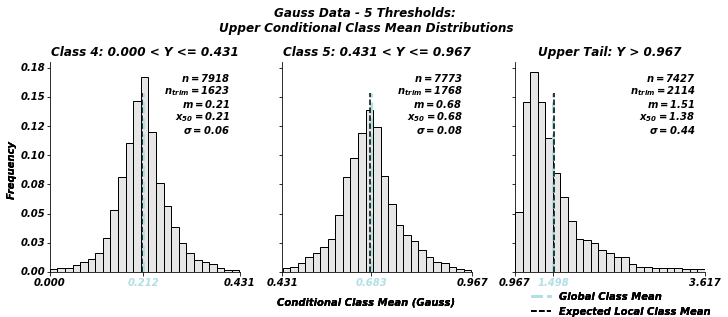

Scenario: 6 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: -0.001
    Global Class 0 Mean: 0.000
    Local Class 1 Mean: 0.367
    Global Class 1 Mean: 0.368
    Local Class 2 Mean: 0.794
    Global Class 2 Mean: 0.800
    Local Class 3 Mean: 1.585
    Global Class 3 Mean: 1.579


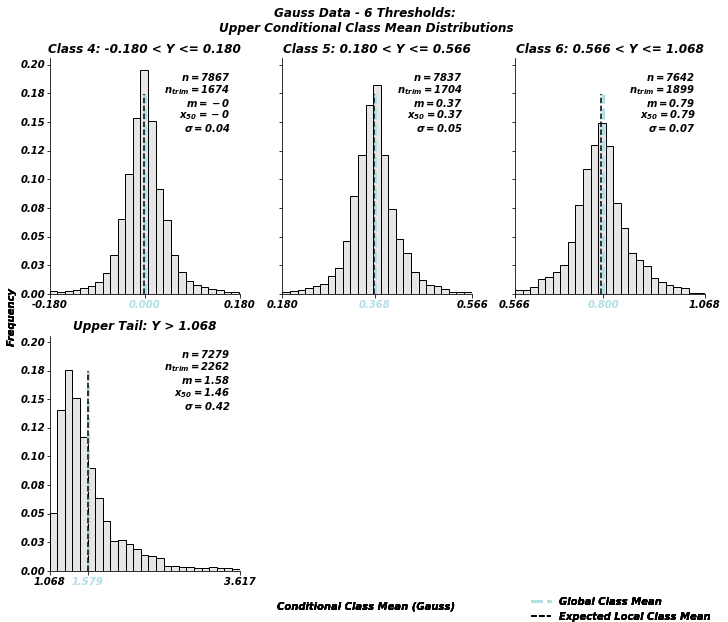

Scenario: 7 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: 0.157
    Global Class 0 Mean: 0.158
    Local Class 1 Mean: 0.490
    Global Class 1 Mean: 0.491
    Local Class 2 Mean: 0.890
    Global Class 2 Mean: 0.895
    Local Class 3 Mean: 1.647
    Global Class 3 Mean: 1.646


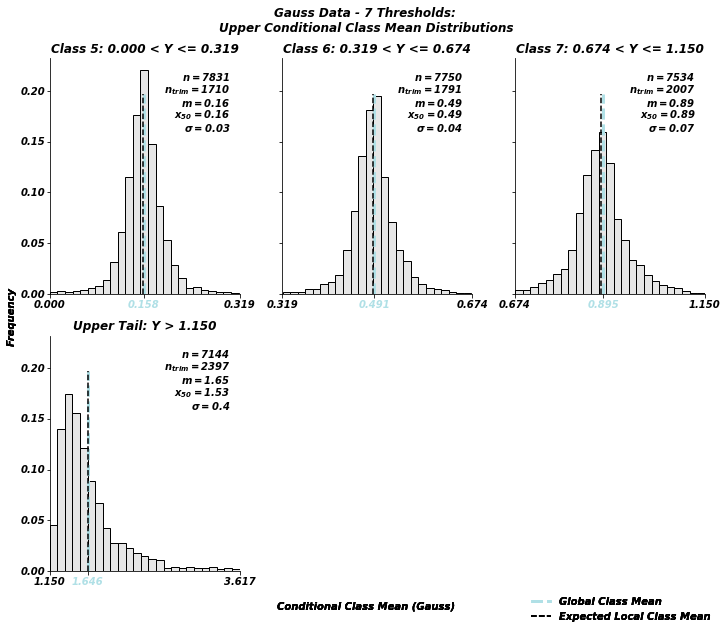

Scenario: 8 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: -0.000
    Global Class 0 Mean: 0.000
    Local Class 1 Mean: 0.282
    Global Class 1 Mean: 0.283
    Local Class 2 Mean: 0.590
    Global Class 2 Mean: 0.592
    Local Class 3 Mean: 0.971
    Global Class 3 Mean: 0.976
    Local Class 4 Mean: 1.700
    Global Class 4 Mean: 1.703


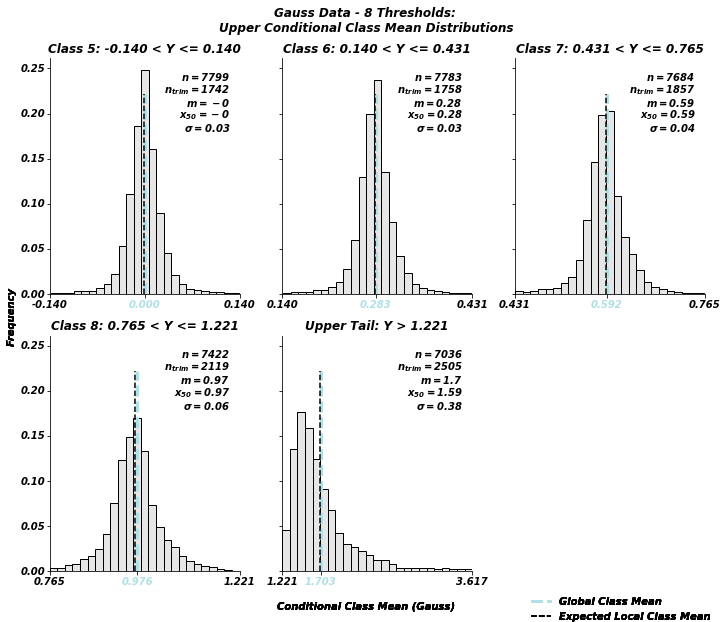

Scenario: 9 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: 0.125
    Global Class 0 Mean: 0.126
    Local Class 1 Mean: 0.386
    Global Class 1 Mean: 0.386
    Local Class 2 Mean: 0.675
    Global Class 2 Mean: 0.677
    Local Class 3 Mean: 1.040
    Global Class 3 Mean: 1.044
    Local Class 4 Mean: 1.747
    Global Class 4 Mean: 1.754


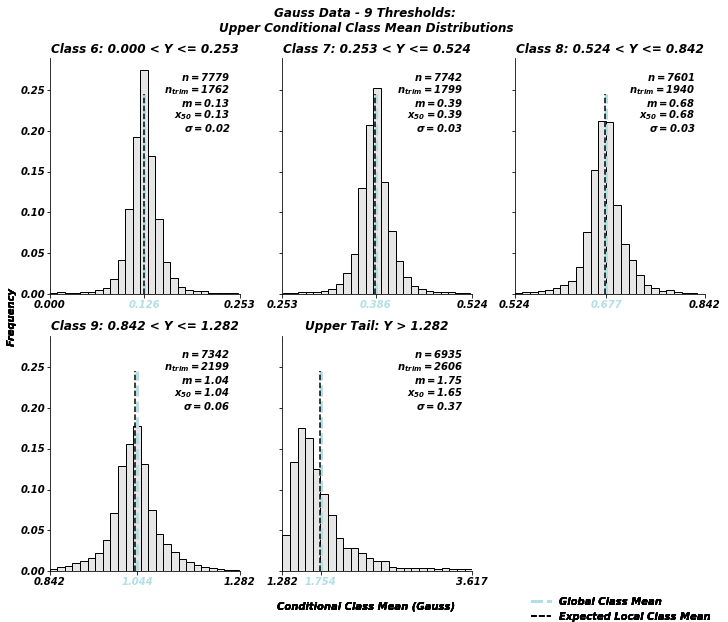

Scenario: 10 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: -0.000
    Global Class 0 Mean: 0.000
    Local Class 1 Mean: 0.230
    Global Class 1 Mean: 0.230
    Local Class 2 Mean: 0.473
    Global Class 2 Mean: 0.474
    Local Class 3 Mean: 0.749
    Global Class 3 Mean: 0.751
    Local Class 4 Mean: 1.100
    Global Class 4 Mean: 1.105
    Local Class 5 Mean: 1.789
    Global Class 5 Mean: 1.798


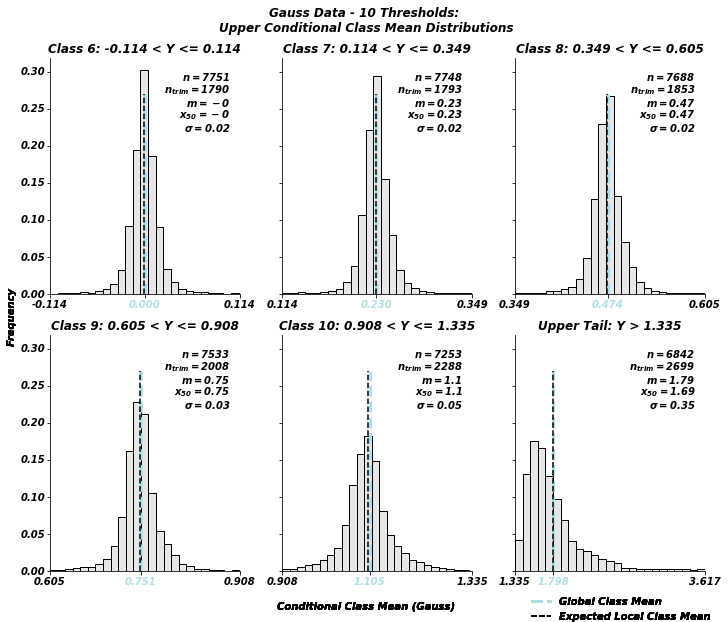

Scenario: 11 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: 0.104
    Global Class 0 Mean: 0.105
    Local Class 1 Mean: 0.319
    Global Class 1 Mean: 0.319
    Local Class 2 Mean: 0.549
    Global Class 2 Mean: 0.550
    Local Class 3 Mean: 0.813
    Global Class 3 Mean: 0.815
    Local Class 4 Mean: 1.153
    Global Class 4 Mean: 1.159
    Local Class 5 Mean: 1.825
    Global Class 5 Mean: 1.838


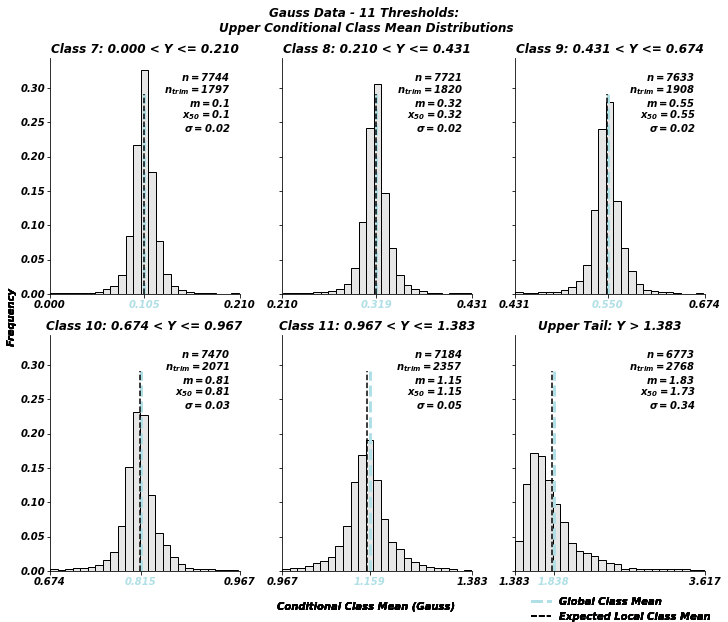

Scenario: 12 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: -0.000
    Global Class 0 Mean: 0.000
    Local Class 1 Mean: 0.194
    Global Class 1 Mean: 0.194
    Local Class 2 Mean: 0.396
    Global Class 2 Mean: 0.396
    Local Class 3 Mean: 0.616
    Global Class 3 Mean: 0.617
    Local Class 4 Mean: 0.871
    Global Class 4 Mean: 0.872
    Local Class 5 Mean: 1.201
    Global Class 5 Mean: 1.206
    Local Class 6 Mean: 1.859
    Global Class 6 Mean: 1.874


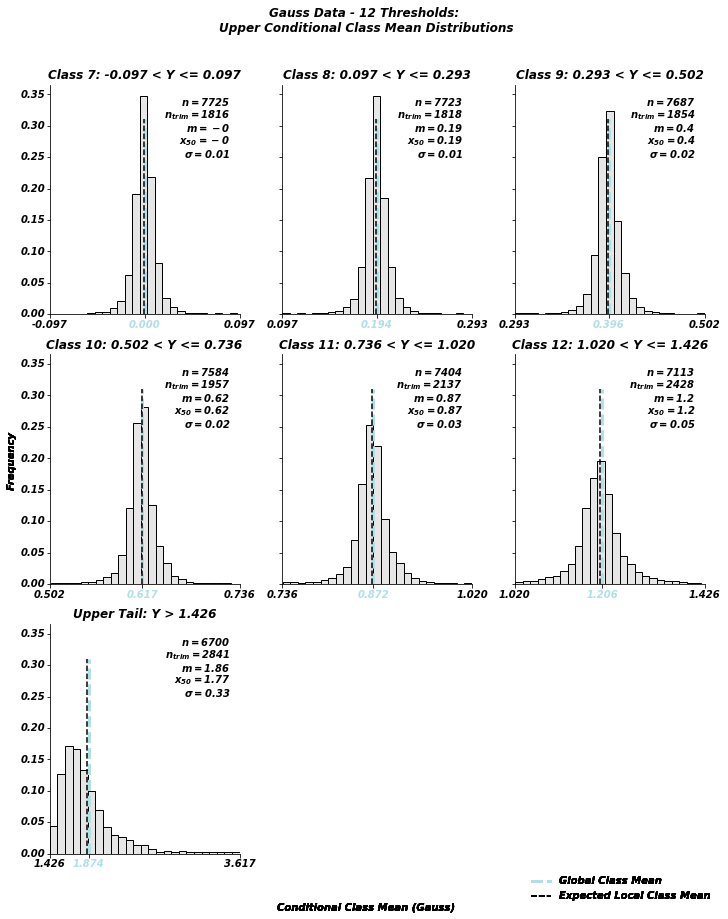

Scenario: 13 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: 0.089
    Global Class 0 Mean: 0.090
    Local Class 1 Mean: 0.272
    Global Class 1 Mean: 0.272
    Local Class 2 Mean: 0.464
    Global Class 2 Mean: 0.465
    Local Class 3 Mean: 0.675
    Global Class 3 Mean: 0.676
    Local Class 4 Mean: 0.922
    Global Class 4 Mean: 0.924
    Local Class 5 Mean: 1.245
    Global Class 5 Mean: 1.250
    Local Class 6 Mean: 1.890
    Global Class 6 Mean: 1.907


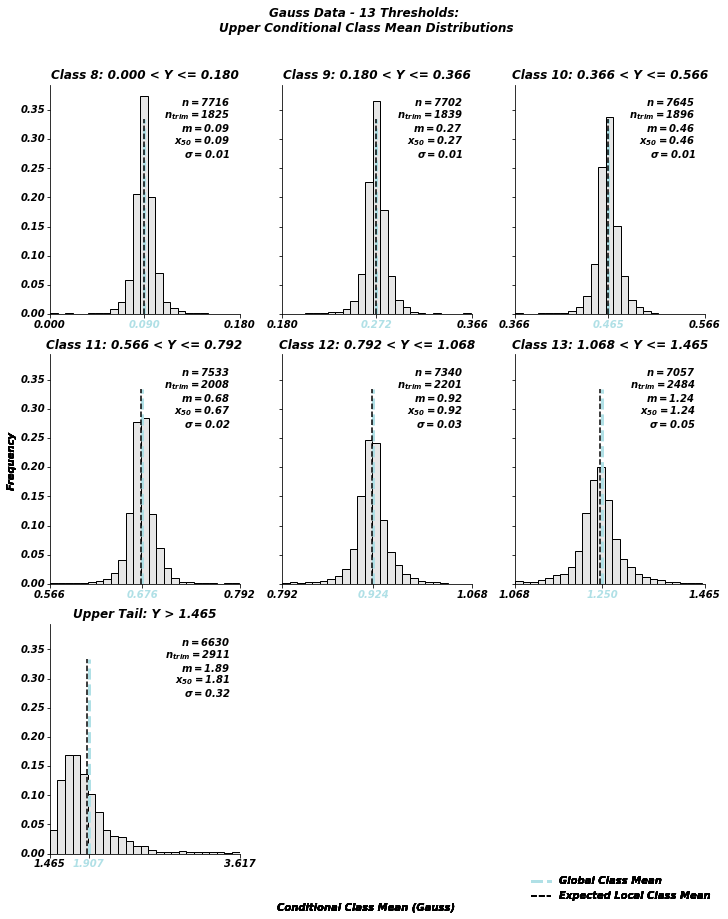

Scenario: 14 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: -0.000
    Global Class 0 Mean: 0.000
    Local Class 1 Mean: 0.168
    Global Class 1 Mean: 0.168
    Local Class 2 Mean: 0.341
    Global Class 2 Mean: 0.341
    Local Class 3 Mean: 0.525
    Global Class 3 Mean: 0.525
    Local Class 4 Mean: 0.728
    Global Class 4 Mean: 0.729
    Local Class 5 Mean: 0.969
    Global Class 5 Mean: 0.970
    Local Class 6 Mean: 1.285
    Global Class 6 Mean: 1.290
    Local Class 7 Mean: 1.918
    Global Class 7 Mean: 1.938


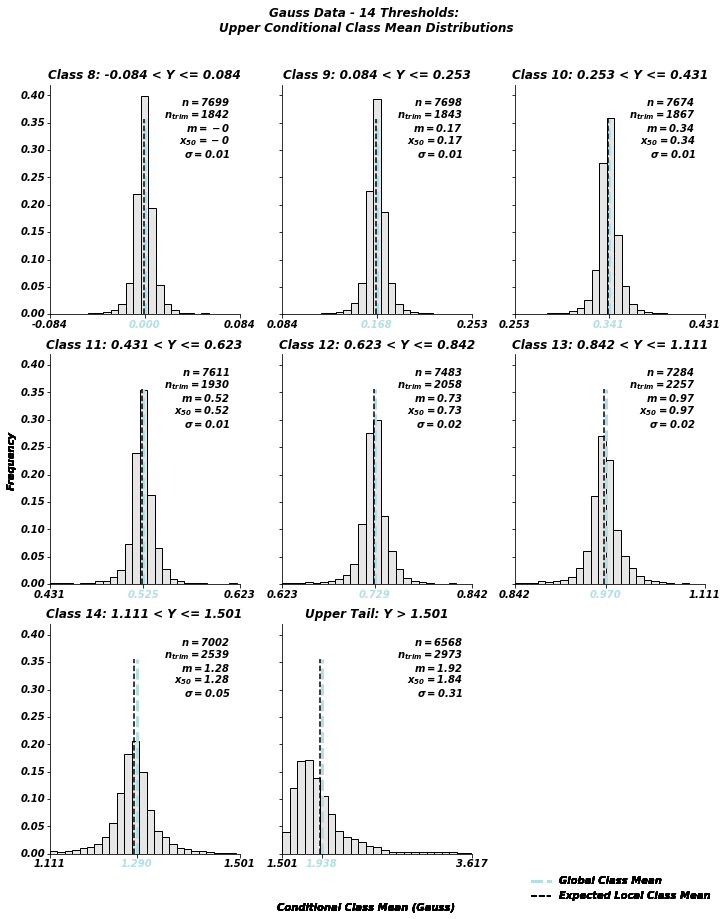

Scenario: 15 thresholds. Plotting the upper classes... 
    Local Class 0 Mean: 0.078
    Global Class 0 Mean: 0.078
    Local Class 1 Mean: 0.237
    Global Class 1 Mean: 0.237
    Local Class 2 Mean: 0.402
    Global Class 2 Mean: 0.403
    Local Class 3 Mean: 0.579
    Global Class 3 Mean: 0.580
    Local Class 4 Mean: 0.777
    Global Class 4 Mean: 0.778
    Local Class 5 Mean: 1.011
    Global Class 5 Mean: 1.013
    Local Class 6 Mean: 1.321
    Global Class 6 Mean: 1.326
    Local Class 7 Mean: 1.945
    Global Class 7 Mean: 1.966


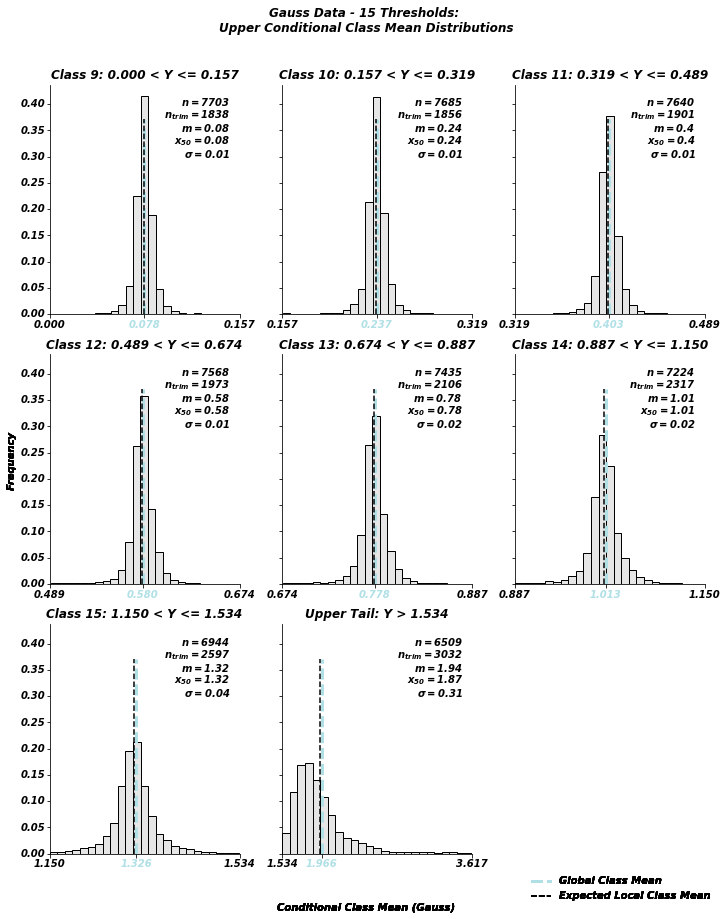

In [529]:
for ((k1, vnrow),
     (k2, vcuts),
     (k3, vupcuts),
     (k4, vncuts),
     (k5, vglob), 
     (k6, vloc),
     (k7, vlmean),
     (k8, vhght)) in zip(pltrow_dict['nrow_upcuts'].items(),
                        thresh_dict['gauss_cuts'].items(),
                        thresh_dict['gauss_up_cuts'].items(),
                        thresh_dict['n_upcuts'].items(),
                        class_means_dict['glob_cls_mean']['Gauss'].items(),
                        class_means_dict['loc_cls_mean']['Gauss'].items(),
                        class_means_dict['mean_cls_mean']['Gauss'].items(),
                        fhght_dict['nrow_upcuts'].items()):    
    # Select upper threshold values
    dict_mask = np.isin(vcuts, vupcuts)
    dict_mask = np.insert(dict_mask, False, 0) # Add False for Lower Tail
    cls_idx = np.argmax(dict_mask) # Index of first True value ()
    pltdat = vloc[dict_mask, :] 
    
    # gmean class and lmean class means of selected thresholds
    gmean = vglob[dict_mask] # Global class mean - upper classes
    lmean = vlmean[dict_mask] # Mean of local class means - upper classes
    
    print(f"Scenario: {k1} thresholds. Plotting the upper classes... ")
    
    # Plot Figure
    fig, axes = plt.subplots(nrows=vnrow, ncols=ncols, figsize=(fwdth, vhght), 
                             sharey=True)
    
    # Remove unused axes
    ax = axes.flatten()
    if (len(axes.flatten())) % vncuts == 1:
        ax[-1].axis('off')
    elif (len(axes.flatten())) % vncuts == 2:
        ax[-1].axis('off')
        ax[-2].axis('off')
    
    # Plot data
    for i, ax in enumerate(axes.flat):
        gs.histplt(pltdat[i,:], ax=ax, bins=25, stat_blk='minimal')
        # Vertical lines for gmean/lmean class means
        ax.axvline(x=gmean[i], linestyle='--', ymin=0.0, ymax=0.85, 
                   linewidth=3, color='powderblue', label='Global Class Mean')
        ax.axvline(x=lmean[i], linestyle='--', ymin=0.0, ymax=0.85, 
                   linewidth=1.5, color='k', 
                   label='Expected Local Class Mean')
        print(f"    Local Class {i} Mean: {lmean[i]:.3f}")
        print(f"    Global Class {i} Mean: {gmean[i]:.3f}")

        # Remove top and right axes
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        # y-tick marks
        ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f')) #2 dec places
#         ylabs = [item.get_text() for item in ax.get_yticklabels()]
#         y_string_labels = ['0.0', '', '', '', '', '0.25']
#         ax.set_yticklabels(y_string_labels)
#         ax.set_ylabel('')

        # x-tick marks with gmean class mean, title, legend
        ax.xaxis.set_major_formatter(FormatStrFormatter('%.3f')) #3 dec places
        ax.xaxis.set_major_locator(plt.MaxNLocator(3))
        if i < vncuts - 1 : # middle
            ax.set_title(f'Class {cls_idx + 1 + i}: '
                         f'{vupcuts[i]:.3f} < Y <= {vupcuts[i + 1]:.3f}')
            ax.set_xticks([vupcuts[i], gmean[i], vupcuts[i + 1]])
#             ax.set_xticklabels([vupcuts[i], lmean[i], vupcuts[i + 1]])
            ax.set_xlim(vupcuts[i], vupcuts[i+1])
            ax.get_xticklabels()[1].set_color('powderblue') 
        else: # upper tail
            ax.set_title(f'Upper Tail: Y > {max(vupcuts):.3f}')
            ax.set_xticks([max(vupcuts), gmean[-1], np.nanmax(list(vloc))])
            ax.set_xlim(max(vupcuts), np.nanmax(list(vloc)))
            ax.get_xticklabels()[1].set_color('powderblue') 
        
        # Shared axis labels
        fig.text(0.5, 0.005, 'Conditional Class Mean (Gauss)', ha='center')
        fig.text(0.008, 0.55, 'Frequency', ha='center', rotation='vertical') 
        
        fig.tight_layout()
        # Legend entry
        handles, labels = ax.get_legend_handles_labels()     
        if vnrow == 1:
            plt.subplots_adjust(bottom=0.12, left=0.06, right=0.97, top=0.85)
            fig.legend(handles, labels, loc = 'best', 
                   bbox_to_anchor=(1.0, 0.12), frameon=False) 
            plt.suptitle(f"Gauss Data - {k1} Thresholds: \n"
                 f"Upper Conditional Class Mean Distributions", y=1.04)  
        else:
            plt.subplots_adjust(bottom=0.07, left=0.06, right=0.97, top=0.96)
            fig.legend(handles, labels, loc = 'best', 
                   bbox_to_anchor=(1.0, 0.06), frameon=False) 
            plt.suptitle(f"Gauss Data - {k1} Thresholds: \n"
                 f"Upper Conditional Class Mean Distributions", y=1.05)  
#         plt.savefig(pltdir+'Appendix_PosClass_Means/Pos_Class_Means_Gauss_'+
#                     f'{k1}'+'_thresh_del.png', 
#                     dpi=600, transparent=True)
#         plt.savefig(ccgdir+'Appendix_PosClass_Means/Pos_Class_Means_Gauss_'+
#                     f'{k1}'+'_thresh.pdf', 
#                     dpi=600, transparent=True)
              
        if i == vncuts - 1:
            break
    plt.show()

### Log-Normal Data

In [490]:
# for ((k1, vupcuts),
#      (k2, vglob), 
#      (k3, vloc),
#      (k4, vmloc)) in zip(thresh_dict['ln_up_cuts'].items(),
#                          class_means_dict['glob_cls_mean']['LN'].items(),
#                          class_means_dict['loc_cls_mean']['LN'].items(),
#                          class_means_dict['mean_cls_mean']['LN'].items()):    
    
#     print(f"Scenario: {k1} thresholds. Plotting the upper classes... ")
    
# #     #  class means of selected thresholds
# #     lmean = np.nanmean(vloc, axis=1) # Mean of lmean Class Means 
    
#     # Plot Figure
#     fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(4, 4), sharey=True)
#     plt.suptitle(f"Gauss Data - {k1} Thresholds: \n"
#                  f"Upper Tail Class Mean Distribution", y=1.07)  
        
#     # Plot data
#     gs.histplt(vloc[-1,:], ax=ax, stat_blk='minimal', logx=False, bins=25,
#                xlabel='Conditional Class Mean (Units)', ylabel='Frequency')
#     # Vertical lines for gmean/lmean class means
#     ax.axvline(x=vglob[-1], linestyle='--', ymin=0.0, ymax=0.85, linewidth=3,
#                color='powderblue', label='Global Class Mean')
#     ax.axvline(x=vmloc[-1], linestyle='--', ymin=0.0, ymax=0.85, linewidth=1.5,
#                color='k', label='Mean of Conditional \nClass Means')
#     print(f"    Global Upper Tail Mean: {vglob[-1]:.3f}")
#     print(f"    Local Upper Tail Mean: {lmean[-1]:.3f}")

#     # Remove top and right axes
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)

#     # y-tick marks
# #         ylabs = [item.get_text() for item in ax.get_yticklabels()]
# #         y_string_labels = ['0.0', '', '', '', '', '0.25']
# #         ax.set_yticklabels(y_string_labels)
# #         ax.set_ylabel('')

#     # x-tick marks with gmean class mean, title, legend
#     ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f')) #3 dec places
#     ax.xaxis.set_major_locator(plt.MaxNLocator(3))

#     ax.set_title(f'Upper Tail: Y > {max(vupcuts):.3f}')
#     ax.set_xticks([max(vupcuts), vglob[-1], np.nanmax(list(vloc))])
#     ax.set_xlim(max(vupcuts), np.nanmax(list(vloc)))
#     ax.get_xticklabels()[1].set_color('powderblue') 

#     # Legend entry
#     handles, labels = ax.get_legend_handles_labels()     
# #     plt.subplots_adjust(bottom=0.12, left=0.06, right=0.97, top=0.85)
#     fig.legend(handles, labels, loc = 'best', bbox_to_anchor=(1.0, 0.45),
#                frameon=False) 

#     plt.savefig(pltdir+'Appendix_PosClass_Means/Pos_Class_Means_LN_'+
#                 f'{k1}'+'_thresh_del.png', 
#                 dpi=600, transparent=True)
#     plt.savefig(ccgdir+'Appendix_PosClass_Means/Pos_Class_Means_LN_'+
#                 f'{k1}'+'_thresh.pdf', 
#                 dpi=600, transparent=True)

#     plt.show()

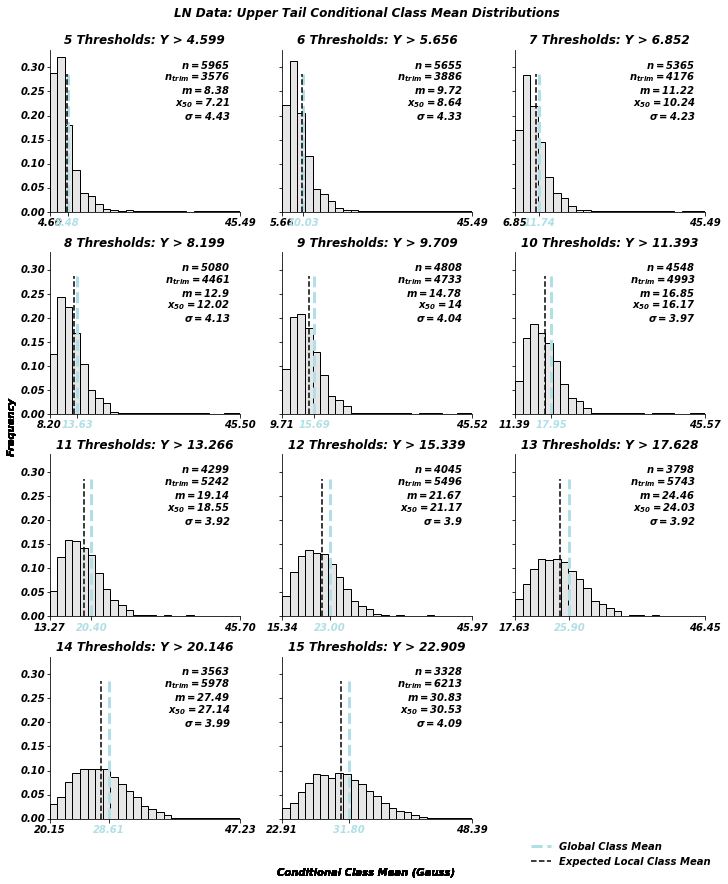

In [528]:
# Plot upper tail of LN-distribution

# Determine number of rows needed
nrow = subplt_rows(high_thresh - low_thresh, ncols)

# Set up plot
fig, axes = plt.subplots(nrows=nrow, ncols=ncols, figsize=(fwdth, vhght), 
                         sharey=True)

# Remove unused axes
ax = axes.flatten()
if (len(axes.flatten())) % (high_thresh - low_thresh + 1) == 1:
    ax[-1].axis('off')
elif (len(axes.flatten())) % (high_thresh - low_thresh + 1) == 2:
    ax[-1].axis('off')
    ax[-2].axis('off')
        
for ((k1, vglob), 
     (k2, vloc),
     (k3, vmloc),
     (k4, vupcuts),
     ax) in zip(class_means_dict['glob_cls_mean']['LN'].items(),
                class_means_dict['loc_cls_mean']['LN'].items(),
                class_means_dict['mean_cls_mean']['LN'].items(),
                thresh_dict['ln_up_cuts'].items(),
                axes.flat):       

    # Plot data (upper tail only)
    gs.histplt(vloc[-1, :], bins=25, ax=ax, stat_blk='minimal')

    # Vertical lines for gmean/lmean class means
    ax.axvline(x=vglob[-1], linestyle='--', ymin=0.0, ymax=0.85, 
               linewidth=3, color='powderblue', label='Global Class Mean')
    ax.axvline(x=vmloc[-1], linestyle='--', ymin=0.0, ymax=0.85, 
               linewidth=1.5, color='k', 
               label='Expected Local Class Mean')
#     print(f"    Local Class {k1} Mean: {vmloc[-1]:.3f}")
#     print(f"    Global Class {k1} Mean: {vglob[-1]:.3f}")

    # Remove top and right axes
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

#         # y-tick marks
#         ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f')) #2 dec places
# #         ylabs = [item.get_text() for item in ax.get_yticklabels()]
# #         y_string_labels = ['0.0', '', '', '', '', '0.25']
# #         ax.set_yticklabels(y_string_labels)
# #         ax.set_ylabel('')

    # x-tick marks with gmean class mean, title, legend
    ax.set_title(f'{k1} Thresholds: Y > {max(vupcuts):.3f}')
    ax.set_xticks([max(vupcuts), vglob[-1], np.nanmax(list(vloc))])
    ax.set_xlim(max(vupcuts), np.nanmax(list(vloc)))
    ax.get_xticklabels()[1].set_color('powderblue') 

    # Shared axis labels
    fig.text(0.5, 0.005, 'Conditional Class Mean (Gauss)', ha='center')
    fig.text(0.008, 0.55, 'Frequency', ha='center', rotation='vertical') 

fig.tight_layout()

# Legend entry
handles, labels = ax.get_legend_handles_labels()     
if vnrow == 1:
    plt.subplots_adjust(bottom=0.12, left=0.06, right=0.97, top=0.85)
    fig.legend(handles, labels, loc = 'best', 
               bbox_to_anchor=(1.0, 0.12), frameon=False) 
    plt.suptitle(f"LN Data: Upper Tail Conditional Class Mean Distributions", 
                 y=1.01)  
else:
    plt.subplots_adjust(bottom=0.07, left=0.06, right=0.97, top=0.96)
    fig.legend(handles, labels, loc = 'best', 
               bbox_to_anchor=(1.0, 0.06), frameon=False) 
    plt.suptitle(f"LN Data: Upper Tail Conditional Class Mean Distributions", 
                 y=1.01)  
# Save figure
plt.savefig(pltdir + 'Appendix_PosClass_Means/UpperTail_LN_' + 
            f'{low_thresh}' + '_' + f'{high_thresh}' + '_threshes.png', 
            dpi=600, transparent=True)
plt.savefig(ccgdir + 'Appendix_PosClass_Means/UpperTail_LN_' +
            f'{low_thresh}' + '_' + f'{high_thresh}' + '_threshes.pdf', 
            dpi=600, transparent=True)
              
plt.show()

## Global vs Local Class Means -- Pct Diff

In [497]:
# Create temporary copy of Class Means dict and remove "G_LN" key
tmp_glob_dict = copy.deepcopy(class_means_dict['glob_cls_mean'])
# tmp_glob_dict.pop('G_LN')
tmp_loc_dict = copy.deepcopy(class_means_dict['mean_cls_mean'])
tmp_loc_dict.pop('G_LN')

# Generate pct diff dict
keys = [key for key in cond_quants_dict.keys() if key != 'G_LN']
meanpdiff_dict = dict.fromkeys(keys)

print("Calculating percent difference between global class mean and "
      "mean of local class means...")
# Iterate through tmp dict and calculate pct diff between glob/loc cls means
for (k1, vglobal), (k2, vlocal) in zip(tmp_glob_dict.items(),
                                       tmp_loc_dict.items()):

    d = {}
    for (key1, vglob), (key2, vloc) in zip(vglobal.items(), vlocal.items()):
#         print(k1, key1, vglob)
#         print(k2, key2, vloc)
        pctdiff = (vglob - vloc) / vloc * 100
        pctdiff[(pctdiff > 99.) | (pctdiff < -99.)] = 0 # Eliminate 100% values
        d[key1] = pctdiff
    meanpdiff_dict[k1] = d
del(d, tmp_glob_dict, tmp_loc_dict)
print("Finshed.")

Calculating percent difference between global class mean and mean of local class means...
Finshed.


In [498]:
meanpdiff_dict

{'Gauss': {'5': array([-1.291070, 0.260603, -0.409405, 0.825214, 0.776710, -0.850656]),
  '6': array([-0.745262, 0.294863, -0.078784, 0.000000, 0.476183, 0.675243,
         -0.384234]),
  '7': array([-0.321672, 0.290031, 0.011649, -0.369905, 0.569747, 0.361206,
         0.595605, -0.088601]),
  '8': array([-0.011292, 0.272509, 0.075679, -0.072796, 0.000000, 0.306958,
         0.326618, 0.519079, 0.192610]),
  '9': array([0.224634, 0.292397, 0.115983, -0.044372, -0.350010, 0.457625,
         0.216490, 0.261740, 0.466952, 0.384942]),
  '10': array([0.475864, 0.271861, 0.097776, -0.008926, -0.064261, 0.000000,
         0.266217, 0.179222, 0.229549, 0.423093, 0.535256]),
  '11': array([0.610034, 0.285293, 0.112842, 0.021064, -0.066499, -0.373542,
         0.324625, 0.174787, 0.190761, 0.240728, 0.436187, 0.725877]),
  '12': array([0.761025, 0.281557, 0.119673, 0.036330, -0.037770, -0.093703,
         0.000000, 0.229757, 0.099656, 0.147862, 0.219681, 0.408676,
         0.840891]),
  '13': a

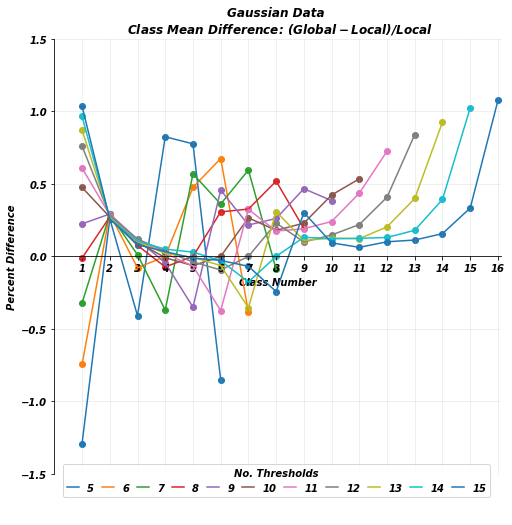

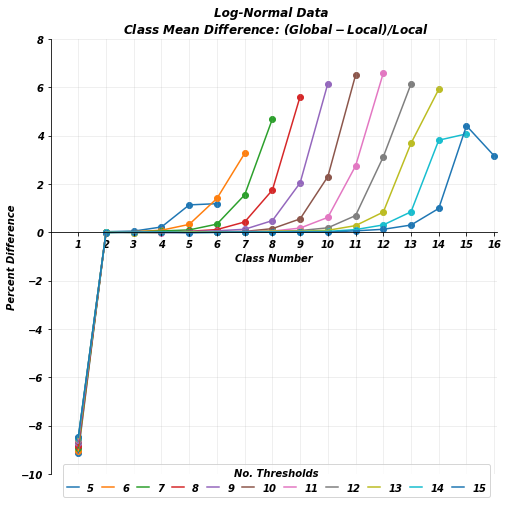

In [535]:
# Plot Percent difference for Gaussian and LN scenarios
ylims = [(-1.5, 1.5), (-10.0, 8.0)]
title = ['Gaussian Data', 'Log-Normal Data']

for (key, vals), (ylow, yhigh), tit in zip(meanpdiff_dict.items(), ylims,
                                           title):
    fig, ax = plt.subplots(figsize=(8,8))
    
    # Plot data
    for thresh, pltdat in vals.items():
        xvals = np.arange(1, int(thresh) + 2)
        ax.plot(xvals, pltdat, label=f'{int(thresh) + 1}')
        ax.scatter(xvals, pltdat)
        ax.grid(alpha=0.25)

    # Remove top and right axes
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_position('zero')
    
    # Plot properties
    ax.set(xlim = (0, high_thresh + 1.1),
           xlabel = 'Class Number',
           ylim = (ylow, yhigh),
           ylabel = 'Percent Difference',
           title = (f'{tit} \n Class Mean Difference: '
                    f'$(Global - Local) / Local$'))
    
    plt.xticks(np.arange(min(xvals), max(xvals) + 1, 1.0))
    
    # Legend
    handles, labels = ax.get_legend_handles_labels() 
    # Convert No. class to No. thresholds
    thresh_lab = [str(int(lab) - 1) for lab in labels] 
    fig.legend(handles, thresh_lab, loc='lower left', ncol=len(ax.lines), 
               frameon=True, title='No. Thresholds', handlelength=1.25, 
               columnspacing=0.75, bbox_to_anchor=(0.10, 0.04)) 
    plt.show()
 

In [686]:
aa

0.37548838039896887

In [683]:
aa = class_means_dict['glob_cls_mean']['LN']['10'][0]
bb = np.nanmean(class_means_dict['loc_cls_mean']['LN']['10'][0,:])

cc = (aa - bb) / bb * 100
cc

-8.62930623276492

In [687]:
bb

0.41095056294036425

## Dictionary with Log-Normal Data

In [248]:
# Calculate parameters of LN dist from LN quantiles
estloc_df['LN_Mean'] = z_ln.mean(axis=0)
estloc_df['LN_Var'] = z_ln.var(axis=0)
estloc_df['LN_StDev'] = np.sqrt(estloc_df['LN_Var'].values)
estloc_df['LN_CoV'] = (estloc_df['LN_StDev'].values / 
                       estloc_df['LN_Mean'].values)

# Update dictionary
mc_varc_dict.update({'estlocs': estloc_df})

# # Convert dictionary dataframes to arrays for faster processing
# estlocs_arr = mc_varc_dict['estlocs'].to_numpy(copy=True)

# Identify mean, var, st.dev. column indices
mean_ln_idx = mc_varc_dict['estlocs'].columns.get_loc('LN_Mean') 
var_ln_idx = mc_varc_dict['estlocs'].columns.get_loc('LN_Var') 
std_ln_idx = mc_varc_dict['estlocs'].columns.get_loc('LN_StDev') 
cov_ln_idx = mc_varc_dict['estlocs'].columns.get_loc('LN_CoV')

print(f"Shape of estlocs array: {estlocs_arr.shape}")
print(f"Column indices for reference: \n"
      f"    LN m_c: {mean_ln_idx} \n"
      f"    LN var_c: {var_ln_idx} \n"
      f"    LN std_c: {std_ln_idx} \n"
      f"    LN CoV_c: {cov_ln_idx}")
print("\nBasic statistics of estlocs array: ")
print(mc_varc_dict['estlocs'].describe())

Shape of estlocs array: (9541, 8)
Column indices for reference: 
    LN m_c: 8 
    LN var_c: 9 
    LN std_c: 10 
    LN CoV_c: 11

Basic statistics of estlocs array: 
                 X            Y       Z     Orig_Est  Dat_Loc      MG_Mean  \
count  9541.000000  9541.000000  9541.0  9541.000000   9541.0  9541.000000   
mean    260.283828   311.991301     0.5     5.211823     10.0    -0.017580   
std     127.820848   125.777732     0.0     4.490999      0.0     1.417533   
min       0.000000     0.000000     0.5     1.000000     10.0    -3.572550   
25%     179.000000   246.000000     0.5     1.000000     10.0    -1.100051   
50%     251.000000   320.000000     0.5     1.000000     10.0    -0.033908   
75%     344.000000   408.000000     0.5    10.000000     10.0     1.024102   
max     511.000000   511.000000     0.5    10.000000     10.0     3.616690   

            MG_Var     MG_StDev      LN_Mean       LN_Var     LN_StDev  \
count  9541.000000  9541.000000  9541.000000  9541.000

# MIK Error: Constant vs Correct Class Means 

MIK Estimator <br>

$Z^*_{MIK} = \sum_{k=1}^K [i_{k+1}(\boldsymbol{u}) - i_k(\boldsymbol{u})] * m_k$

Assumes constant class mean <br>
Use the indicator class thresholds and the global class means to undestand MIK Error

In [536]:
# Set up IK estimate dictionary
ik_est_dict = {
    'ik_probs': 'empty', # Correct conditional IK probabilities
    'ik_glob_mean': 'empty', # IK estimate using global (constant) class mean
    'ik_loc_mean': 'empty' # IK estimate using local (correct) class mean
}
prnt_keys(ik_est_dict)

Dictionary keys: 
    ik_probs
    ik_glob_mean
    ik_loc_mean


## Calculate Correct IK Probabilities

In [537]:
# Calculate conditional (correct) IK probability values
#  Create dictionary
tmp_dict = {}

#  Calculate conditional probabilities for each threshold scenario
for keys, cutoffs in cutoff_dict['Gauss'].items():   
    probs = stats.norm.cdf(cutoffs[:,None], loc=mu_c, scale=sigma_c) 
    tmp_dict[keys] = probs
ik_est_dict['ik_probs'] = tmp_dict

del(tmp_dict)

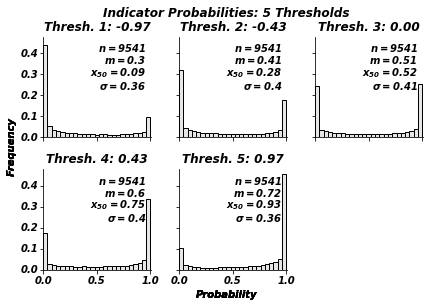

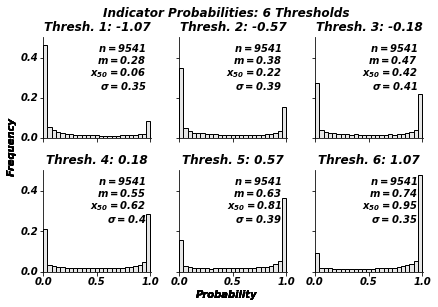

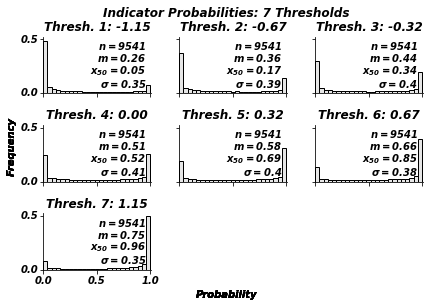

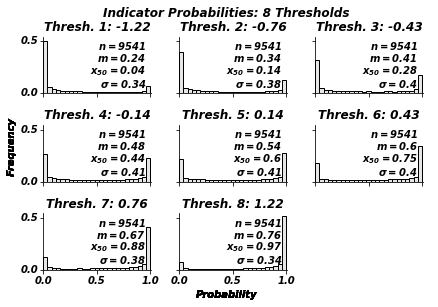

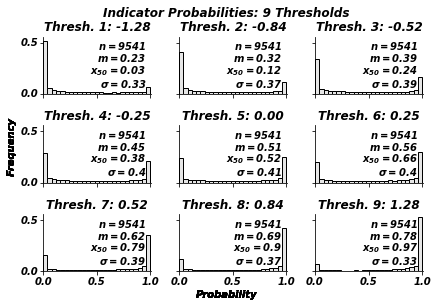

...

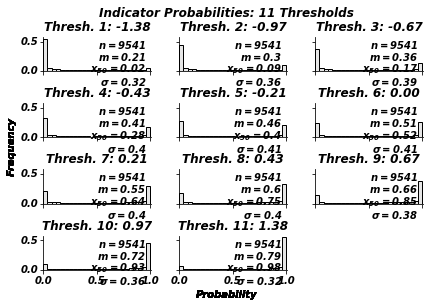

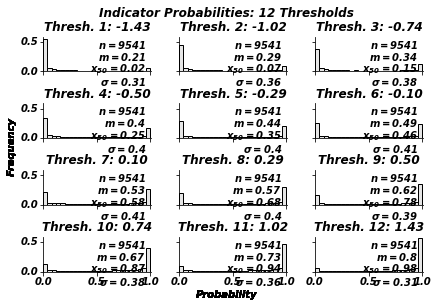

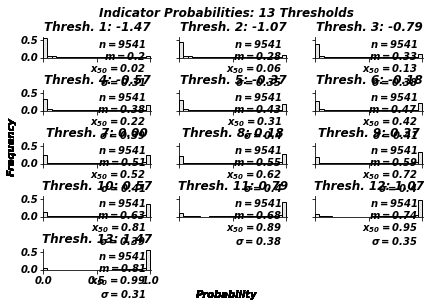

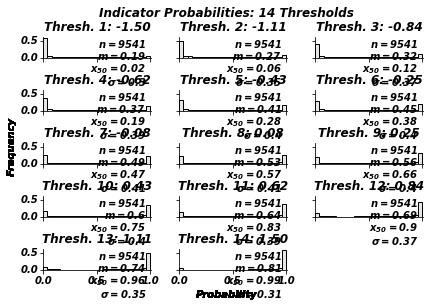

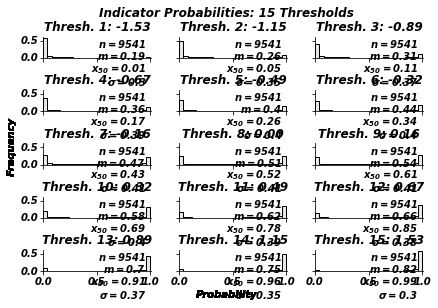

In [538]:
big_loop = high_thresh - low_thresh
for ((key, nr), (thrsh, arrs), 
     (key2, cuts), i) in zip(pltrow_dict['nrow_thresh'].items(), 
                             ik_est_dict['ik_probs'].items(),
                             cutoff_dict['Gauss'].items(),
                             range(big_loop+1)):
    nrows = nr
    naxes = nrows * ncols
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharey=True, 
                             sharex=True, squeeze=True)
    plt.suptitle(f'Indicator Probabilities: {int(key)} Thresholds', y=1.01)
    # Delete empty subplots
    ax = axes.flatten()
    if (nrows * ncols) % int(key) == 1:
        ax[-1].axis('off')
    elif (nrows * ncols) % int(key) == 2:
        ax[-1].axis('off')
        ax[-2].axis('off')
    # Plot results
    for (k, ax), j in zip(enumerate(axes.flat), range(int(thrsh))):
        gs.histplt(arrs[j,:], bins=25, ax=ax, xlabel=None, ylabel=None,
                   xlim=(0.,1.01), title=f'Thresh. {j+1}: {cuts[j]:.2f}', 
                   stat_blk='minimal')
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_ylabel('')
        # Shared axis labels
        fig.text(0.5, 0.0, 'Probability', ha='center') # x-axis
        fig.text(0.005, 0.6, 'Frequency', ha='center', rotation='vertical') # y-axis
         
                   
    fig.tight_layout()

### Plot Class Mean vs Correct IK Probability

In [ ]:
# fig, axes = plt.subplots(4, 3, figsize=(10, 12), sharex=True, sharey=False)
# fig.suptitle('Class Mean as a Fuction of Correct Thresh. Prob.', y=1.01)

# ax = axes.flatten()
# ax[-1].axis('off') 
# ax[-2].axis('off')

# for i, ax in enumerate(axes.flat):
       
#     # Upper tail
#     if i == nclass - 1:
#         ax.scatter(t_ikprob[-1, :], cmarr[:, -1])
#         ax.set_yticks([max(cut_offs), np.nanmax(cmarr[:, -1])])
#         ax.set_ylim(max(cut_offs), np.nanmax(cmarr[:, -1]))
#         ax.set_title(f'Upper Tail: Y > {max(cut_offs)}')
#     # All other clases
#     else:
#         ax.scatter(t_ikprob[i, :], cmarr[:, fc_idx + i])  
    
#     ## Plot y-ticks and x-labels
#     if i == 0: # lower tail
#         ax.set_yticks([np.nanmin(cmarr[:, i + fc_idx]), min(cut_offs)])
#         ax.set_ylim(np.nanmin(cmarr[:, i + fc_idx]), min(cut_offs))
#         ax.set_title(f'Lower Tail: Y $\leq$ {min(cut_offs)}')
#     elif i > 0 and i < len(cut_offs): # middle classes
#         ax.set_yticks([cut_offs[i-1], cut_offs[i]])
#         ax.set_ylim(cut_offs[i-1], cut_offs[i])
#         ax.set_title(f'Class {i+1}: {cut_offs[i-1]} < Y $\leq$ {cut_offs[i]}')

#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)    
    
    
#     if i == nclass - 1:
#         break

# # Shared axis labels
# fig.text(0.5, 0.0, 'Correct Probability at Threshold', ha='center') # x-axis
# fig.text(0.005, 0.6, 'Class Mean (Gauss)', ha='center', rotation='vertical') # y-axis

# fig.tight_layout()
# plt.show()
# # plt.savefig(pltdir+'IK_Correct_Probs_Thresh.png', dpi=600, transparent=True)

In [ ]:
# for k, v in enumerate(cut_offs):
#     figsize = (ncols * 3 + 1, nrows_thresh[k] * 3 + 1)
#     fig, axes = plt.subplots(nrows_thresh[k], ncols, figsize=figsize, 
#                              sharey=True)
#     plt.suptitle(f"Distribution of Conditional Means by Class: "
#                  f"{k + low_thresh} Thresholds", y=1.01)

#     ax = axes.flatten()
#     if (nrows_thresh[k] * ncols) % nthresh[k] == 1:
#         ax[-1].axis('off')
#     elif (nrows_thresh[k] * ncols) % nthresh[k] == 2:
#         ax[-1].axis('off')
#         ax[-2].axis('off')

#     for i, ax in enumerate(axes.flat):
#         gs.histplt(corr_ikprobs[k][i], bins=25, ax=ax, xlabel=False, 
#                    title=f'Threshold {i + 1}: Y = {cut_offs[k][i]:.2f}',
#                    xlim=(0,1.01), stat_blk='all')

#         ax.set_ylabel('')
#         ax.set_ylim(0, 0.9)
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)

#         if i == len(cut_offs[k]) - 1:
#             break
    
#     # Shared axis labels
#     fig.text(0.5, 0.0, 'Probability', ha='center') # x-axis
#     fig.text(0.005, 0.55, 'Frequency', ha='center', rotation='vertical') # y-axis

#     fig.tight_layout()
#     plt.show()
    
# #     plt.savefig(pltdir+f'IK_Correct_Probs_Thresh_{k}.png', dpi=600, transparent=True)

## IK Estimates with Global and Local Class Means

In [539]:
# Temporary dict to update with IK est for each scenario
suff = ('Gauss', 'LN')
tmp_glob_dict = dict.fromkeys([key for key in cutoff_dict.keys() 
                               if key.startswith(suff)]) # tmp correct cls means
tmp_loc_dict = dict.fromkeys([key for key in cutoff_dict.keys() 
                               if key.startswith(suff)]) # tmp constant cls means

# Iterate through keys and threshold scenarios
for keys in tmp_glob_dict.keys():
    print(f'{keys} IK estimates:')
    tmp_cls_glob_dict = {}
    tmp_cls_loc_dict = {}
    for ((k1, probs), (k2, glob), 
         (k3, loc)) in zip(ik_est_dict['ik_probs'].items(),
                           class_means_dict['glob_cls_mean'][keys].items(),
                           class_means_dict['loc_cls_mean'][keys].items()):
        
        print(f'    With {k1} thresholds... ')
        # Calculate probability value for each class
        aa = probs[0, :][None, :] # Lower tail
        bb = np.subtract(probs[1:, :], probs[:-1, :]) # Middle classes
        cc = np.subtract(1, probs[-1, :])[None, :] # Upper tail 
        dd = np.concatenate((aa, bb, cc), axis=0) # Combine arrays
        # Multiply by class mean
        ee = dd * glob[:, None] # Global mean (constant)
        ff = dd * loc # Local mean (variable)
        # Sum values for IK estimate
        tmp_cls_glob_dict[k1] = np.sum(ee, axis=0)
        tmp_cls_loc_dict[k1] = np.nansum(ff, axis=0)
    print(f'    Updating dictionaries with estimates...')
    tmp_glob_dict[keys] = tmp_cls_glob_dict
    tmp_loc_dict[keys] = tmp_cls_loc_dict
ik_est_dict.update({'ik_glob_mean': tmp_glob_dict,
                    'ik_loc_mean': tmp_loc_dict})
print('Finished.')
#         print(f'Shape of input array: {probs.shape}')
#         print(f'aa: {aa.shape}')
#         print(f'bb: {bb.shape}')
#         print(f'cc: {cc.shape}')
#         print((f'dd: {dd.shape}'))
#         print(f'Global means: {glob.shape}')
#         print(f'Local means: {loc.shape}')

Gauss IK estimates:
    With 5 thresholds... 
    With 6 thresholds... 
    With 7 thresholds... 
    With 8 thresholds... 
    With 9 thresholds... 
    With 10 thresholds... 
    With 11 thresholds... 
    With 12 thresholds... 
    With 13 thresholds... 
    With 14 thresholds... 
    With 15 thresholds... 
    Updating dictionaries with estimates...
LN IK estimates:
    With 5 thresholds... 
    With 6 thresholds... 
    With 7 thresholds... 
    With 8 thresholds... 
    With 9 thresholds... 
    With 10 thresholds... 
    With 11 thresholds... 
    With 12 thresholds... 
    With 13 thresholds... 
    With 14 thresholds... 
    With 15 thresholds... 
    Updating dictionaries with estimates...
Finished.


### Check Calculation

In [540]:
# Select random location
scen_tst = 'Gauss' # scenario to check
nloc = len(mc_varc_dict['estlocs'])
thr_tst = int((np.random.uniform(low_thresh, high_thresh + 1))) # pick random threshold scenario
loc_tst = int((np.random.uniform(0, nloc + 1))) # pick random data index

print(f"Testing location index: {loc_tst} for {scen_tst} "
      f"scenario with {thr_tst} thresholds:")

glob_est = ik_est_dict['ik_glob_mean'][scen_tst][str(thr_tst)][loc_tst],
loc_est = ik_est_dict['ik_loc_mean'][scen_tst][str(thr_tst)][loc_tst]

print(f"    IK with constant mean is: {glob_est[0]:.4f}")
print(f"    IK with correct mean is: {loc_est:.4f}\n")

Testing location index: 3742 for Gauss scenario with 6 thresholds:
    IK with constant mean is: 1.5734
    IK with correct mean is: 2.5760



In [541]:
# Probability, IK-global, IK-local estimates for thres scenario and data index
prob_tst = ik_est_dict['ik_probs'][str(thr_tst)][:,loc_tst]
glob_mean = class_means_dict['glob_cls_mean'][scen_tst][str(thr_tst)]
loc_mean = class_means_dict['loc_cls_mean'][scen_tst][str(thr_tst)][:,loc_tst]

# Calculate:
aa = (prob_tst[0]) # Lower tail
bb = np.subtract(prob_tst[1:], prob_tst[:-1]) # Middle classes
cc = (np.subtract(1, prob_tst[-1])) # Upper tail
dd = np.concatenate(([aa], bb, [cc]))
# Multiply by class mean
ee = dd * glob_mean # Global mean (constant)
ff = dd * loc_mean # Local mean (variable)
# Sum values over thresholds
chk_glob = np.sum(ee)
chk_loc = np.nansum(ff)

print(f"Does this match the calculated IK w/ global class mean "
      f"at location index {loc_tst} ({thr_tst} thresholds)? "
      f"{isclose(chk_glob, glob_est[0])}")
print(f"Does the check match calculated IK w/ local class mean? "
      f"at location index {loc_tst} ({thr_tst} thresholds)? " 
      f"{isclose(chk_loc, loc_est)}\n" )

Does this match the calculated IK w/ global class mean at location index 3742 (6 thresholds)? True
Does the check match calculated IK w/ local class mean? at location index 3742 (6 thresholds)? True



## Calculate IK Error

In [542]:
eloc = mc_varc_dict['estlocs']

print("Separating MG estimates using 'Orig_Est' flag...")
# Get X/Y locations for original and dup m_c estimates
orig_est = eloc[['X', 'Y', 
                 'MG_Mean', 'LN_Mean']].loc[eloc['Orig_Est'] == 1].copy()
dup_est = eloc[['X', 'Y', 
                'MG_Mean', 'LN_Mean']].loc[eloc['Orig_Est'] == 10].copy()

# Generate masks to extract original and dup m_c estimates -- still needed?
orig_mask = eloc.index[eloc['Orig_Est'] == 1].tolist()
dup_mask = eloc.index[eloc['Orig_Est'] == 10].tolist()

Separating MG estimates using 'Orig_Est' flag...


IK estimate error = ik_glob_mean - ik_loc_mean 

Evaluating Gauss scenario...
    5 thresholds...


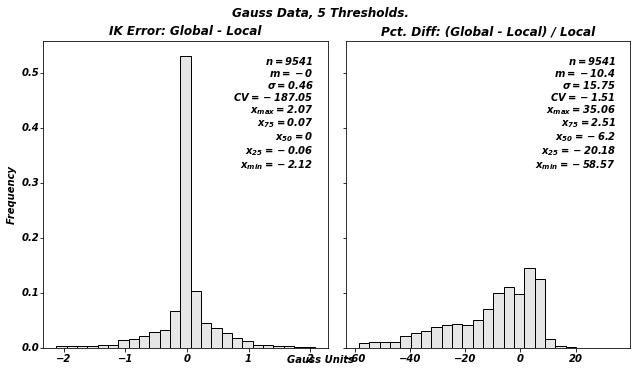

    6 thresholds...


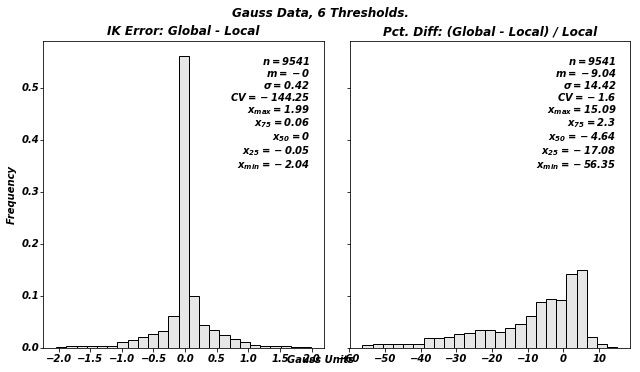

    7 thresholds...


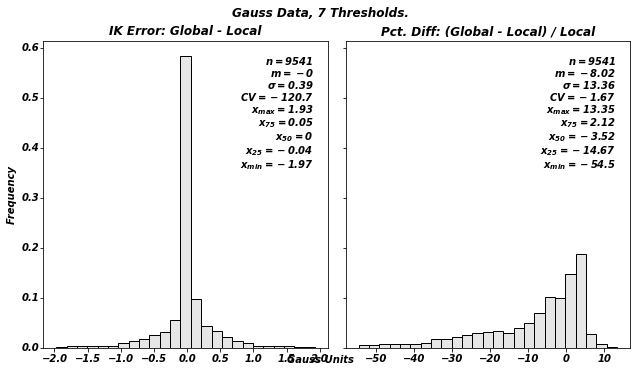

    8 thresholds...


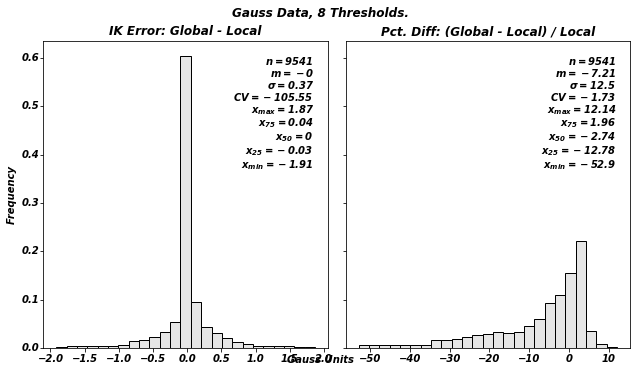

    9 thresholds...


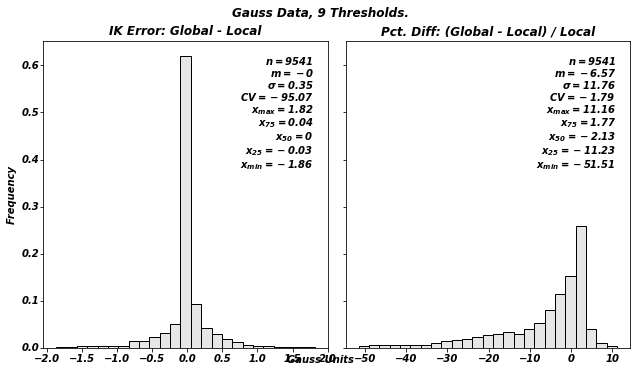

    10 thresholds...


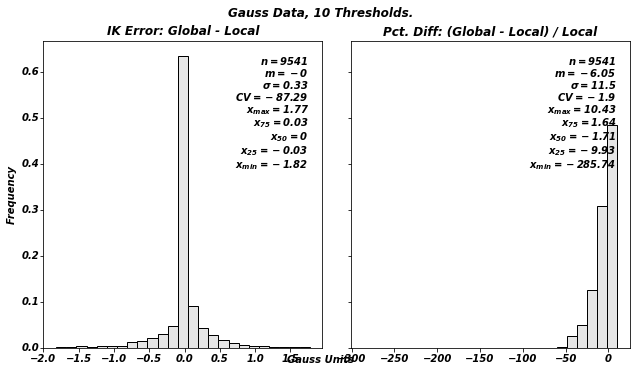

    11 thresholds...


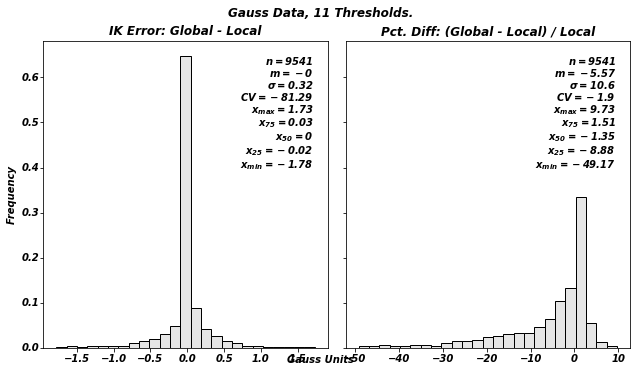

    12 thresholds...


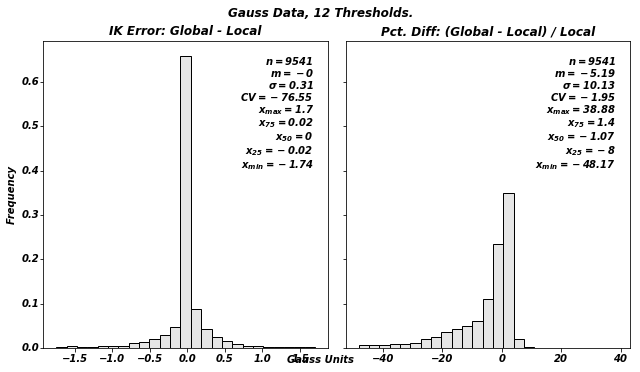

    13 thresholds...


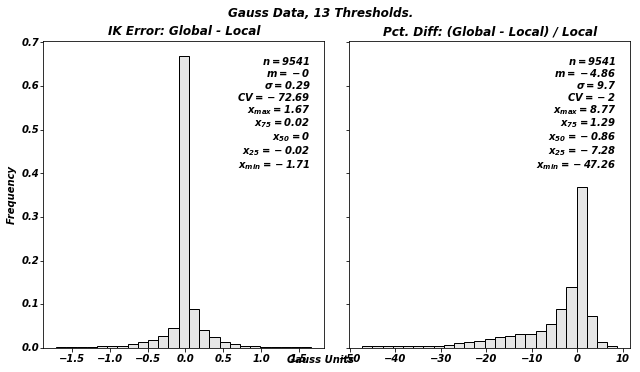

    14 thresholds...


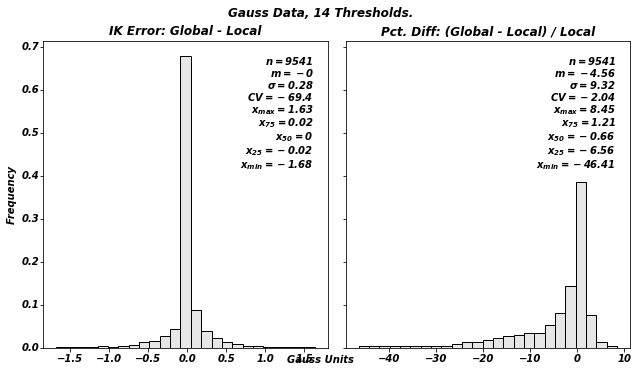

    15 thresholds...


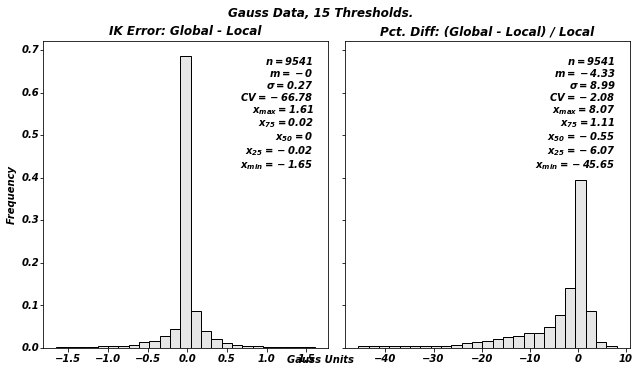

Evaluating LN scenario...
    5 thresholds...


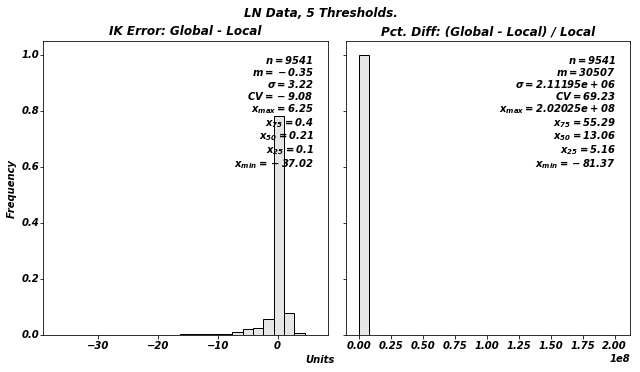

    6 thresholds...


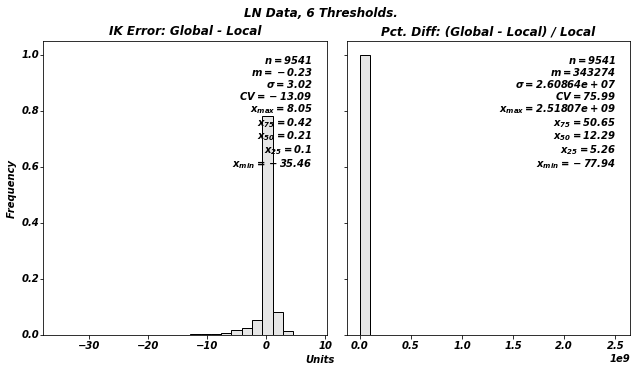

    7 thresholds...


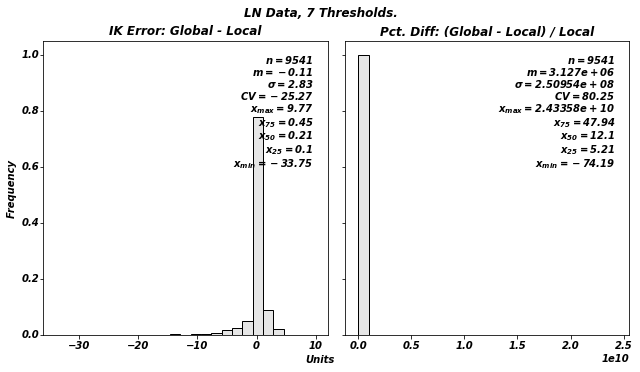

    8 thresholds...


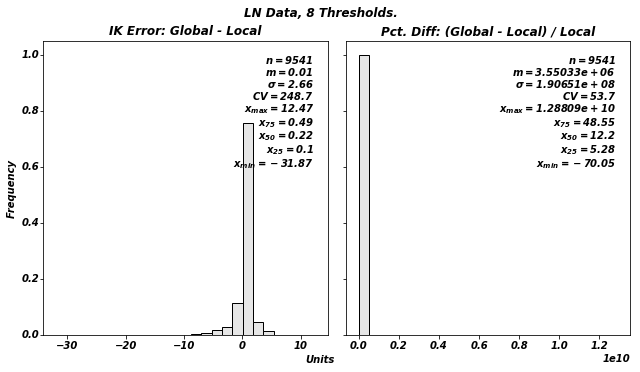

    9 thresholds...


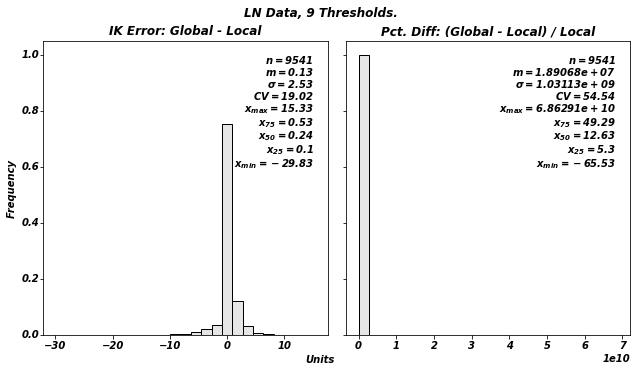

    10 thresholds...


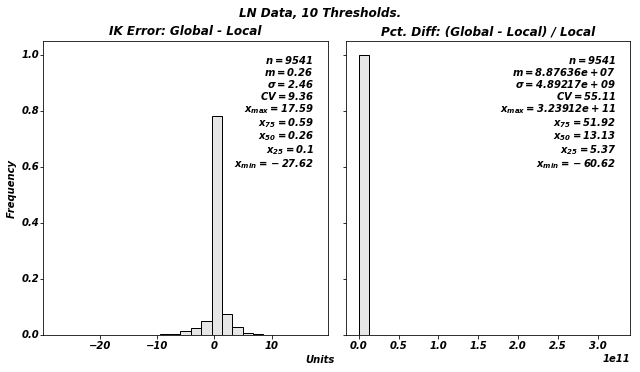

    11 thresholds...


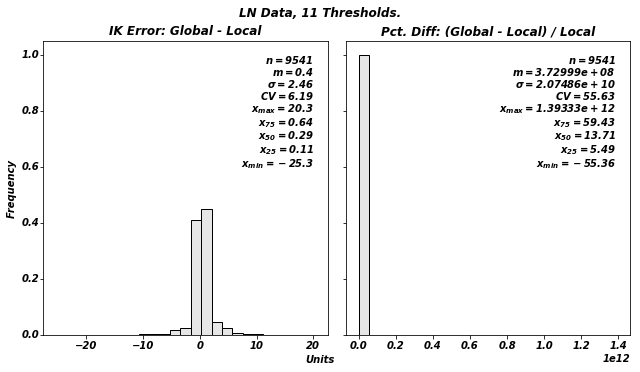

    12 thresholds...


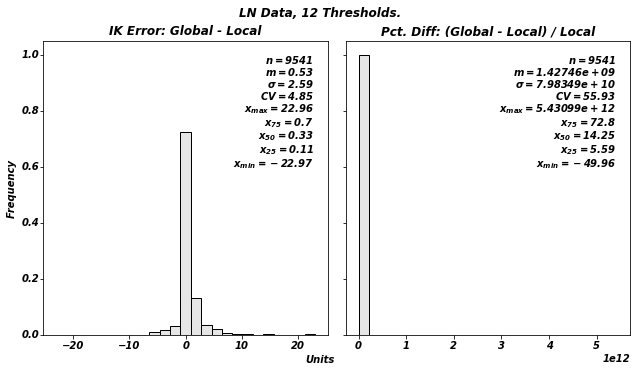

    13 thresholds...


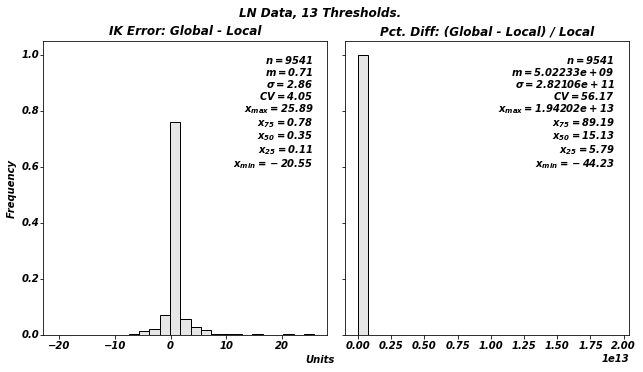

    14 thresholds...


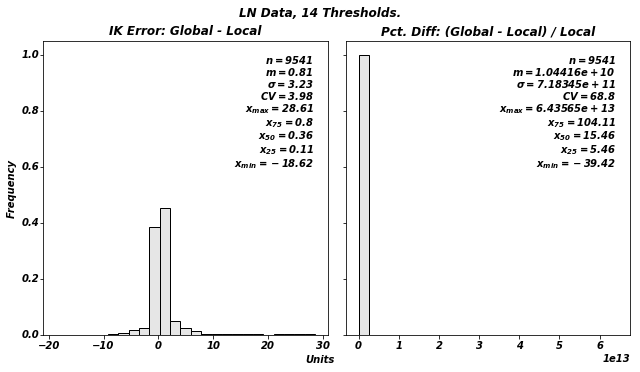

    15 thresholds...


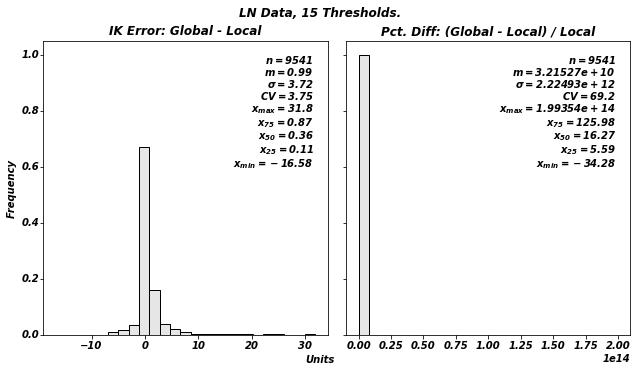

In [543]:
# Select IK global class and local class means from dictionary
ik_keys = [k for k in ik_est_dict.keys() if k.endswith('mean')]
print(f"IK estimate error = {ik_keys[0]} - {ik_keys[1]} \n")

# Generate dictionary for IK errors and high percent difference values
suff = ('Gauss', 'LN')
ik_err_dict = dict.fromkeys([key for key in cutoff_dict.keys() 
                            if key.startswith(suff)])
high_pctdiff_dict = dict.fromkeys([key for key in cutoff_dict.keys() 
                                  if key.startswith(suff)])

# Iterate through data and threshold scenarios
for (kglob, vglob), (kloc, vloc) in zip(ik_est_dict[ik_keys[0]].items(), 
                                        ik_est_dict[ik_keys[1]].items()):
    print(f"Evaluating {kglob} scenario...")
    tmp_dict = {}
    for (k1, vg_thresh), (k2, vl_thresh) in zip(vglob.items(), vloc.items()):
        print(f"    {k1} thresholds...")

        td = {}
        # Calculate error
        ik_error = np.subtract(vg_thresh, vl_thresh)
        td['Error'] = ik_error        

        # Calculate pct diff
        ik_err_pct = np.divide(ik_error, vl_thresh) * 100
        td['Pct_Diff'] = ik_err_pct

        # Update tmp_dict
        tmp_dict[k1] = td

        # Plot error
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,5), sharey=True)
        plt.suptitle(f"{kglob} Data, {k1} Thresholds.",
                     y=1.02)
        gs.histplt(ik_error, bins=25, ax=ax1, 
                   xlabel=False, ylabel='Frequency', 
                   title=f"IK Error: Global - Local")
        gs.histplt(ik_err_pct, bins=25, ax=ax2,
                   xlabel=False,
                   title=f"Pct. Diff: (Global - Local) / Local")
        if kglob == 'Gauss':
            fig.text(0.5, 0.04, 'Gauss Units', ha='center', va='center')
        elif kglob == 'LN':
            fig.text(0.5, 0.04, 'Units', ha='center', va='center')
        fig.tight_layout()
        plt.show()
#             plt.savefig(plt_g_dir + 'IK_Error/' + f'ikerr_g{k1}.pdf',
#                         dpi=300, transparent=True)            
    # Update IK error dict
    ik_err_dict[kglob] = tmp_dict

IK estimate error = ik_loc_mean - ik_glob_mean 

Evaluating LN scenario...
    5 thresholds...
    Analysing LN estimates and resetting lowest values.


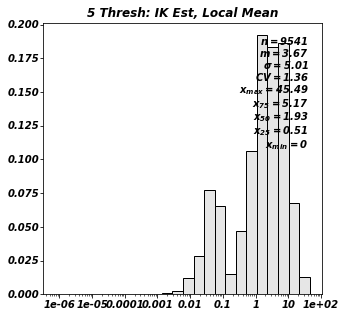

      Shape of frac_loc array is: (9541,)


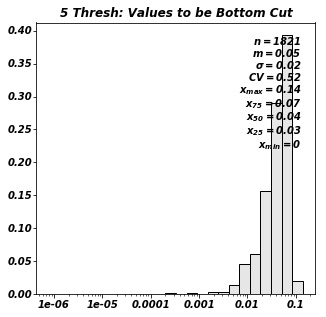

      Bottom cut value: 0.13990 to replace 1821 values.


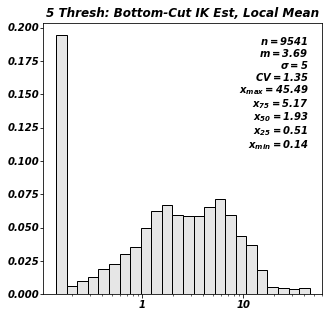

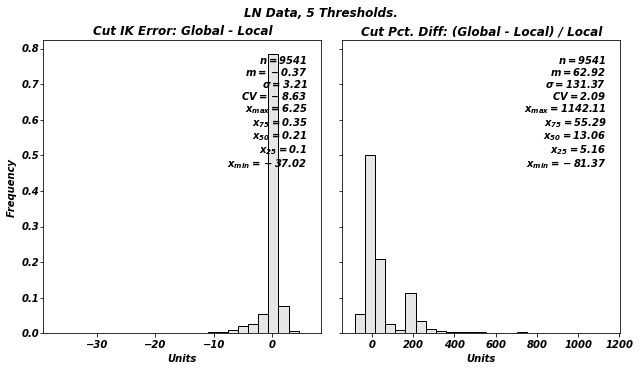

    6 thresholds...
    Analysing LN estimates and resetting lowest values.


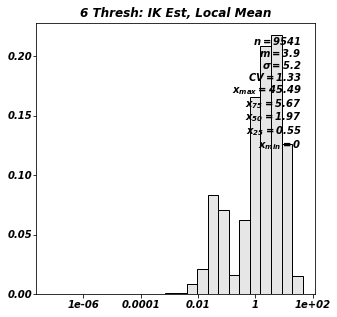

      Shape of frac_loc array is: (9541,)


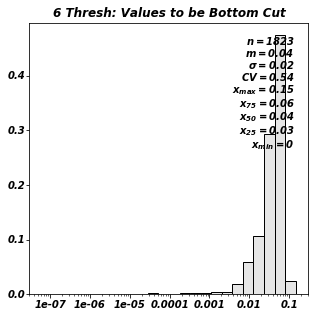

      Bottom cut value: 0.14695 to replace 1823 values.


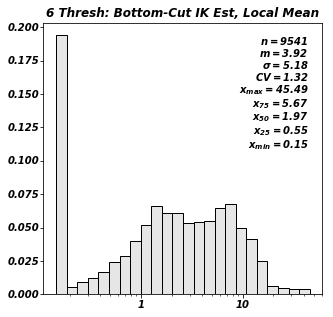

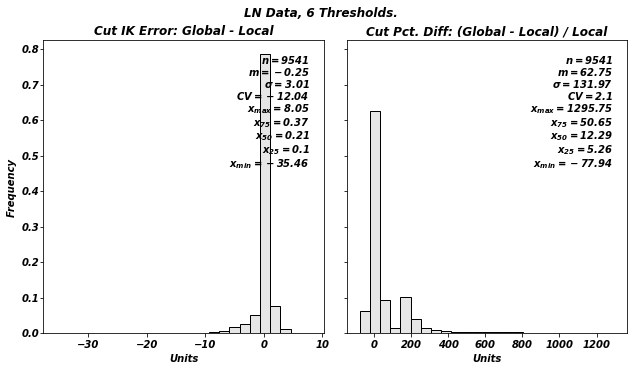

    7 thresholds...
    Analysing LN estimates and resetting lowest values.


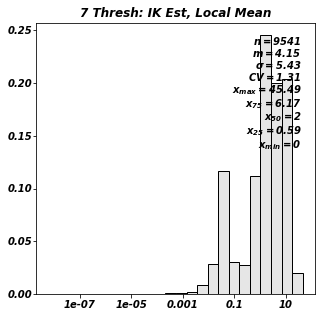

      Shape of frac_loc array is: (9541,)


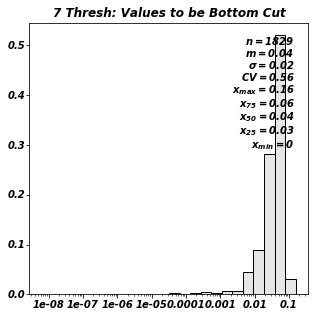

      Bottom cut value: 0.15750 to replace 1829 values.


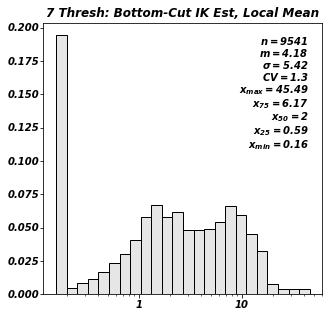

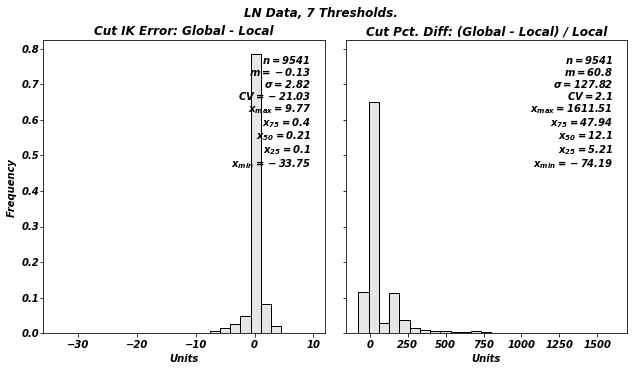

    8 thresholds...
    Analysing LN estimates and resetting lowest values.


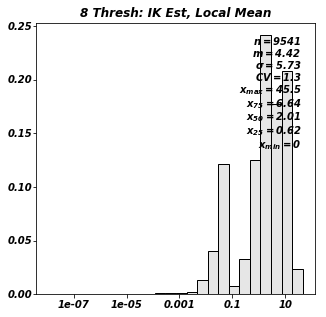

      Shape of frac_loc array is: (9541,)


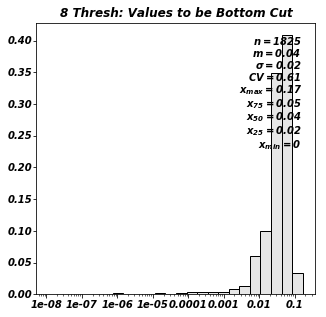

      Bottom cut value: 0.16805 to replace 1825 values.


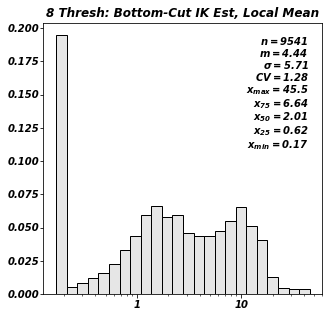

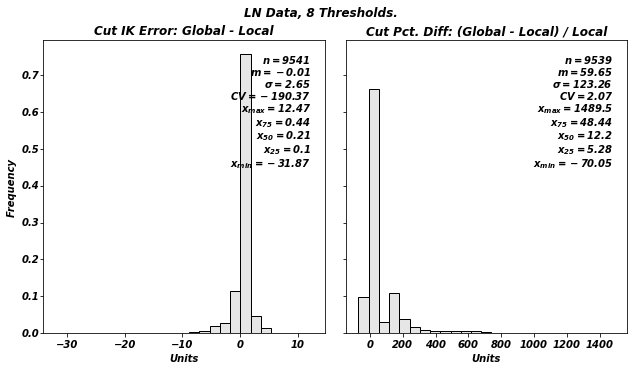

    9 thresholds...
    Analysing LN estimates and resetting lowest values.


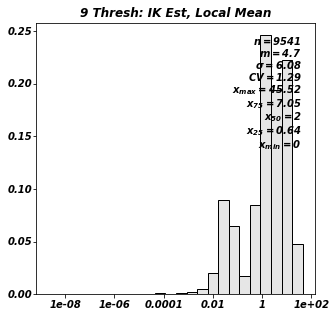

      Shape of frac_loc array is: (9541,)


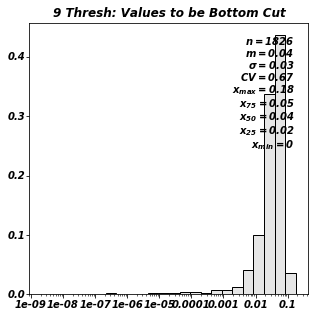

      Bottom cut value: 0.17942 to replace 1826 values.


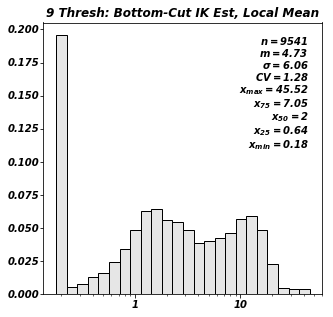

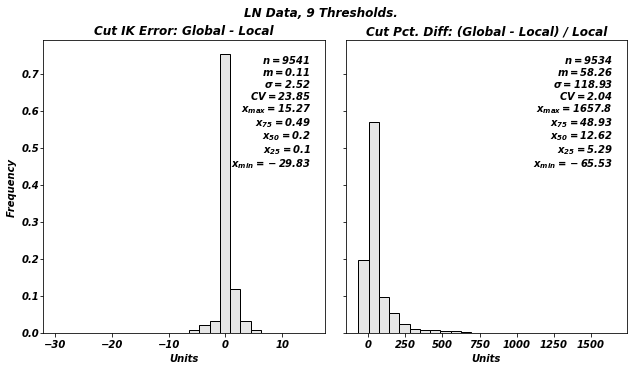

    10 thresholds...
    Analysing LN estimates and resetting lowest values.


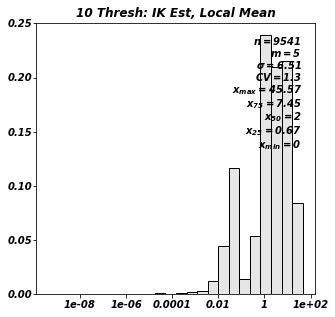

      Shape of frac_loc array is: (9541,)


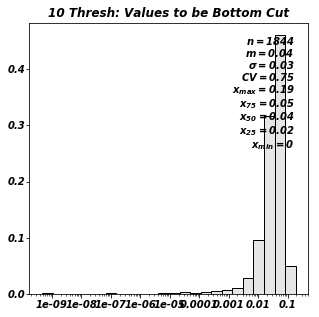

      Bottom cut value: 0.19016 to replace 1844 values.


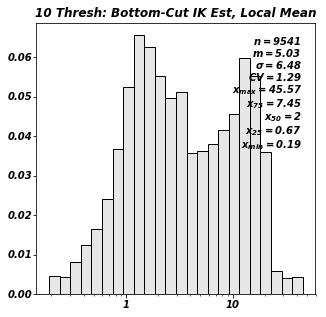

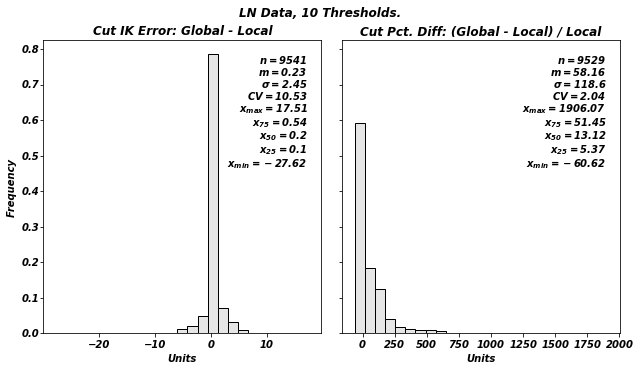

    11 thresholds...
    Analysing LN estimates and resetting lowest values.


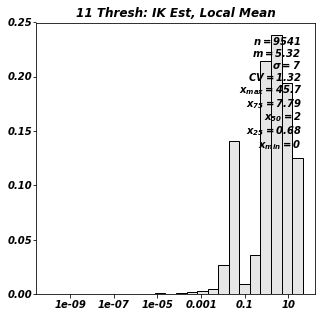

      Shape of frac_loc array is: (9541,)


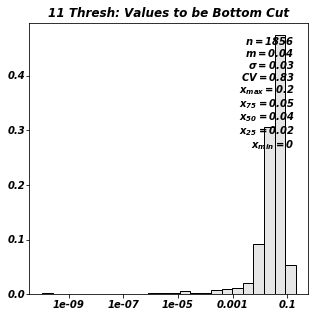

      Bottom cut value: 0.20274 to replace 1856 values.


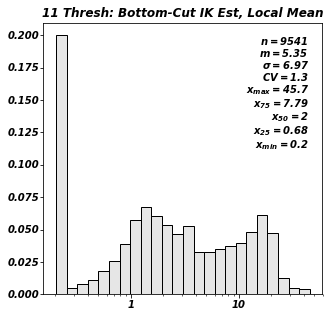

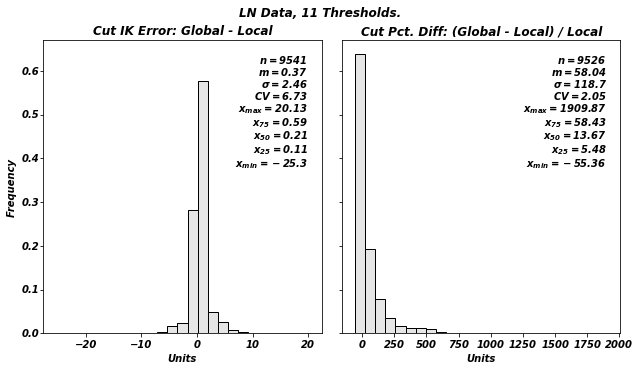

    12 thresholds...
    Analysing LN estimates and resetting lowest values.


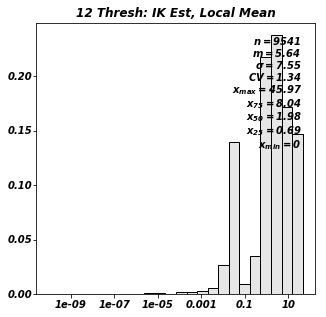

      Shape of frac_loc array is: (9541,)


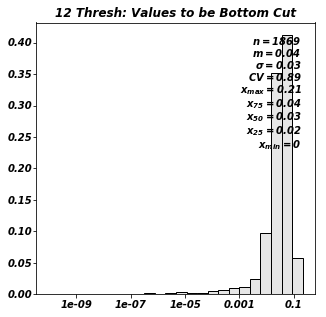

      Bottom cut value: 0.21421 to replace 1869 values.


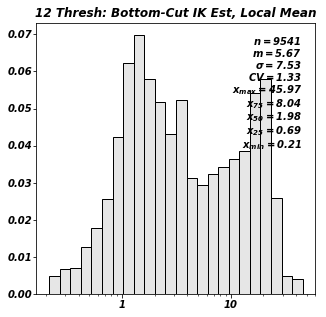

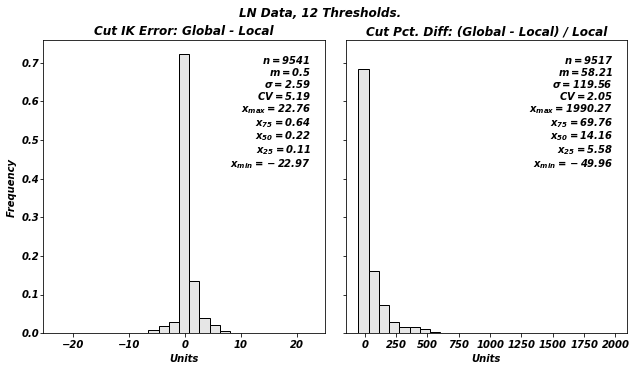

    13 thresholds...
    Analysing LN estimates and resetting lowest values.


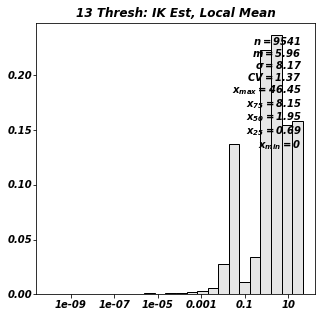

      Shape of frac_loc array is: (9541,)


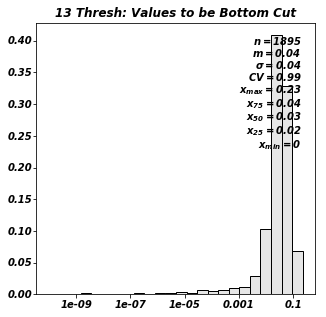

      Bottom cut value: 0.22598 to replace 1895 values.


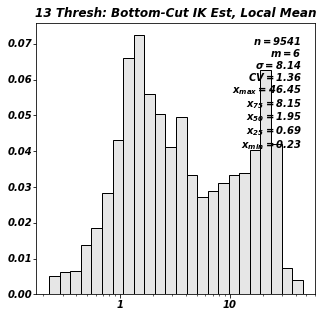

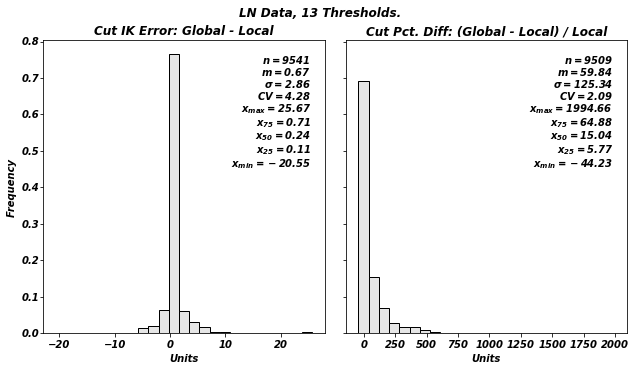

    14 thresholds...
    Analysing LN estimates and resetting lowest values.


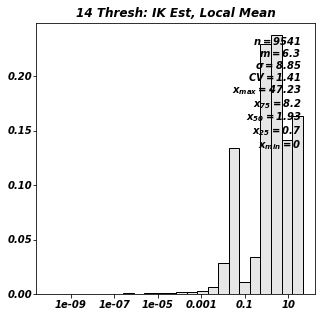

      Shape of frac_loc array is: (9541,)


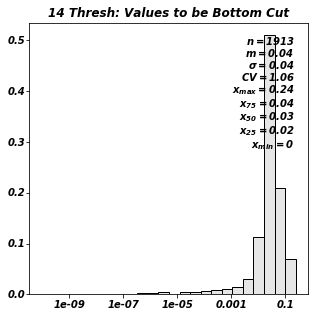

      Bottom cut value: 0.24027 to replace 1913 values.


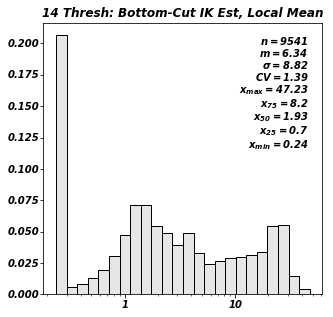

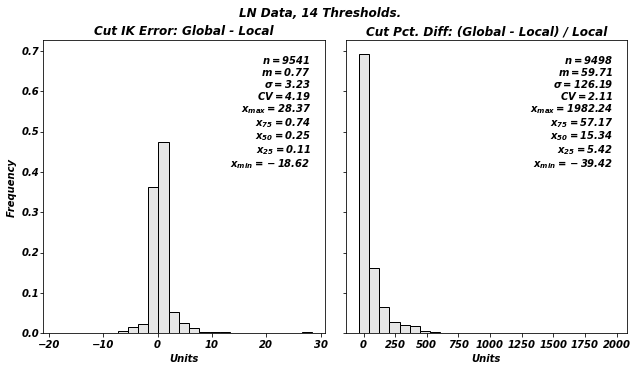

    15 thresholds...
    Analysing LN estimates and resetting lowest values.


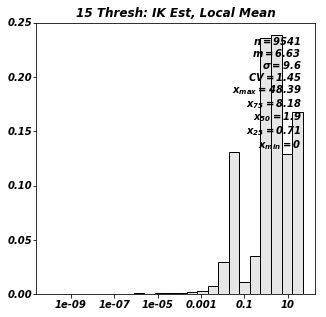

      Shape of frac_loc array is: (9541,)


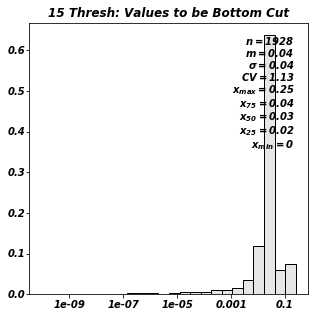

      Bottom cut value: 0.25051 to replace 1928 values.


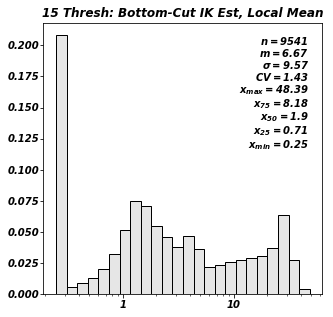

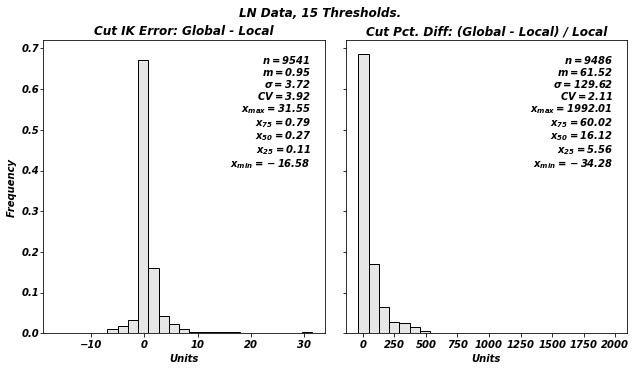

In [544]:
# Select IK global class and local class means from dictionary
ik_keys = [k for k in ik_est_dict.keys() if k.endswith('mean')]
print(f"IK estimate error = {ik_keys[1]} - {ik_keys[0]} \n")

# Generate dictionary for IK errors and high percent difference values
suff = ('Gauss', 'LN')
high_pctdiff_dict = dict.fromkeys([key for key in cutoff_dict.keys() 
                                  if key.startswith(suff)])

# Iterate through data and threshold scenarios
for (kglob, vglob), (kloc, vloc) in zip(ik_est_dict[ik_keys[0]].items(), 
                                        ik_est_dict[ik_keys[1]].items()):
    tmp2_dict = {}
    if kglob == 'LN':
        print(f"Evaluating {kglob} scenario...")
        for (k1, vg_thresh), (k2, vl_thresh) in zip(vglob.items(), 
                                                    vloc.items()):
            print(f"    {k1} thresholds...")
            print(f"    Analysing LN estimates and resetting lowest values.")
            
            # Plot distribution of IK ests with local class mean
            fig, ax = plt.subplots(figsize=(5,5))
            gs.histplt(vl_thresh, bins=25, ax=ax, logx=True,
                      title=f"{k1} Thresh: IK Est, Local Mean")
            plt.show()
            
            # Quantify proportion of metal content in estimate and replace 
            #  low values
            sum_loc = np.sum(np.abs(vl_thresh))

            frac_loc = np.abs(vl_thresh) / sum_loc 
            print(f"      Shape of frac_loc array is: {frac_loc.shape}")

            # Boolean Expression
            bool_fracloc = frac_loc < 4e-06 # break in distribution (see plot)
            fig, ax = plt.subplots(figsize=(5,5))
            gs.histplt(vl_thresh[bool_fracloc], ax=ax, bins=25, logx=True,
                       title=f"{k1} Thresh: Values to be Bottom Cut")
            plt.show()
            
            lowcut_val = np.amax(vl_thresh[bool_fracloc])
            print(f"      Bottom cut value: {lowcut_val:.5f} to replace "
                  f"{vl_thresh[bool_fracloc].shape[0]} values.")
            cut_vl_thresh = np.where(vl_thresh <= lowcut_val, 
                                    lowcut_val, vl_thresh)
            fig, ax = plt.subplots(figsize=(5,5))
            gs.histplt(cut_vl_thresh, ax=ax, bins=25, logx=True,
                       title=f"{k1} Thresh: Bottom-Cut IK Est, Local Mean")
            plt.show()
            
            td = {}
            # Calculate error
            ik_error = np.subtract(vg_thresh, cut_vl_thresh)
            td['Cut_Error'] = ik_error
            
            # Calculate pct diff
            ik_err_pct = np.divide(ik_error, cut_vl_thresh) * 100
            td['Cut_Pct_Diff'] = ik_err_pct
              
            # Update tmp_dict
            tmp2_dict[k1] = td
            
            # Identify location of high percent error values
            high_vals_idx = np.where(ik_err_pct >= 200)
            tmp2_dict[k1+'_high_val_idx'] = high_vals_idx
                      
            # Plot error
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9,5), sharey=True)
            plt.suptitle(f"{kglob} Data, {k1} Thresholds.",
                        y=1.02)
            gs.histplt(ik_error, bins=25, ax=ax1, 
                       xlabel='Units', ylabel='Frequency', 
                       title=f"Cut IK Error: Global - Local")
        
            pctdiff_plt = ik_err_pct[ik_err_pct <= 2000] # Remove high pct diff
            gs.histplt(pctdiff_plt, bins=25, ax=ax2,
                       xlabel='Units',
                       title=f"Cut Pct. Diff: (Global - Local) / Local")
            fig.tight_layout()
            plt.show()
#             plt.savefig(plt_ln_dir + 'IK_Error/' + f'ikerr_ln{k1}.pdf',
#                         dpi=300, transparent=True)
    # Update IK PctDiff dict
    high_pctdiff_dict[kglob] = tmp2_dict

In [ ]:
# # Select IK global class and local class means from dictionary
# ik_keys = [k for k in ik_est_dict.keys() if k.endswith('mean')]

# # Iterate through data and threshold scenarios
# for (kglob, vglob), (kloc, vloc) in zip(ik_est_dict[ik_keys[0]].items(), 
#                                         ik_est_dict[ik_keys[1]].items()):
#     for (k1, vg_thresh), (k2, vl_thresh) in zip(vglob.items(), vloc.items()):
#         print(kglob, k1, vg_thresh)
#         print(kloc, k2, vl_thresh)
#         np.savetxt(outdir+kglob+k1+'global.txt', vg_thresh)
#         np.savetxt(outdir+kloc+k1+'local.txt', vl_thresh)

## IK Error - Spatial Maps

In [545]:
# Split original data samples for plotting (highlight tails of distribution)
g_smp = [-1.75, 1.75] # Gauss cut-off values
ln_smp = [np.exp(i * beta + alpha) for i in g_smp] # Equiv LN cut-offs
smp = [g_smp, ln_smp]

tails = samps[['X', 'Y', 
               'value', 'ln_value']].loc[(samps['value'] <= g_smp[0]) | 
                                         (samps['value'] >= g_smp[1])]
nottails = samps[['X', 'Y', 
                  'value', 'ln_value']].loc[(samps['value'] > g_smp[0]) & 
                                            (samps['value'] < g_smp[1])]
#  sample Dataframe 
ttype = [tails['value'], tails['ln_value']]
nttype = [nottails['value'], nottails['ln_value']]

# Generate grid for contours from IK estimates
X_loc = orig_est['X'].values # IK est x-loc
Y_loc = orig_est['Y'].values # IK est y-loc
points = np.column_stack((X_loc, Y_loc)) # IK est (x,y) as 2D grid

x_grid, y_grid = np.mgrid[x_min:x_max, y_min:y_max] # grid for contour

In [546]:
# Split original data samples for plotting (highlight tails of distribution)
g_smp = [-1.75, 1.75] # Gauss cut-off values
ln_smp = [5] 
# ln_smp = [np.exp(i * beta + alpha) for i in g_smp] # Equiv LN cut-offs
smp = [g_smp, ln_smp]

# Gauss sample data
gtails = samps[['X', 'Y', 'value']].loc[(samps['value'] <= g_smp[0]) | 
                                        (samps['value'] >= g_smp[1])]
gnottails = samps[['X', 'Y', 'value']].loc[(samps['value'] > g_smp[0]) & 
                                           (samps['value'] < g_smp[1])]
# LN sample data
ltails = samps[['X', 'Y', 'ln_value']].loc[samps['ln_value'] >= ln_smp[0]]
lnottails = samps[['X', 'Y', 'ln_value']].loc[samps['ln_value'] < ln_smp[0]]

#  sample Dataframe 
ttype = [gtails.values, ltails.values]
nttype = [gnottails.values, lnottails.values]



### Error (Local Class Mean - Global Class Mean)

Plotting Gauss IK error maps...
    Evaluating Error for 5 thresholds...


No handles with labels found to put in legend.


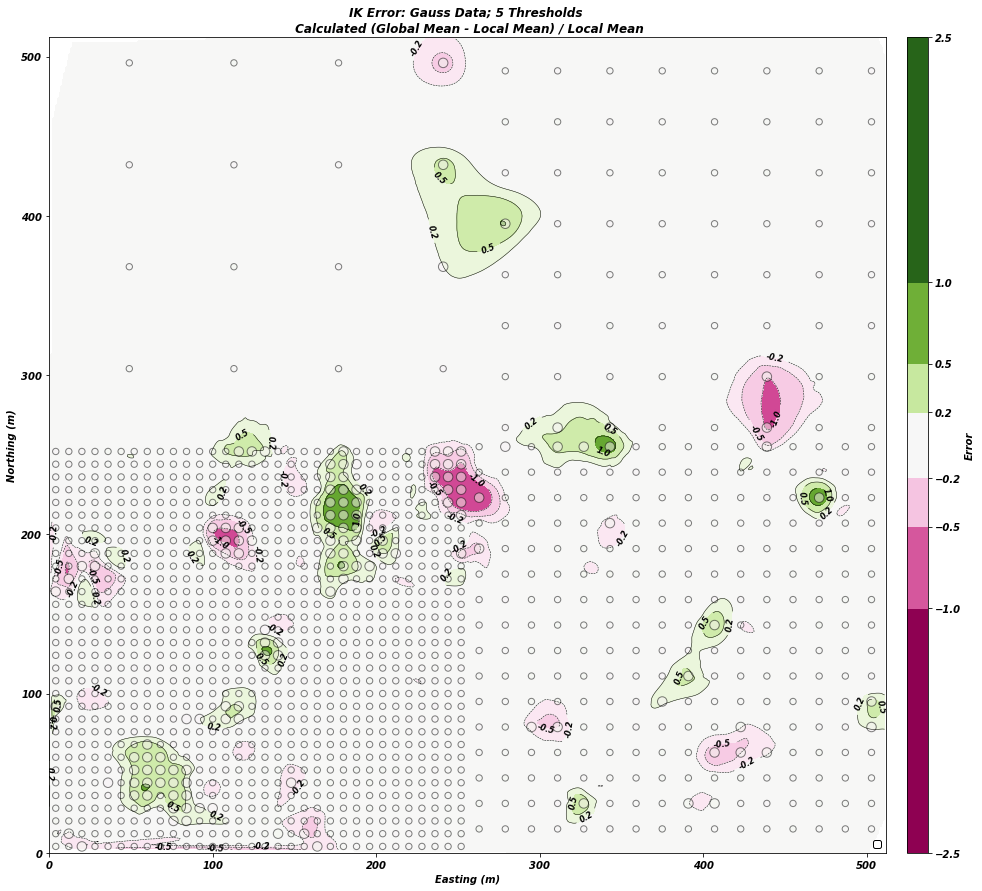

    Evaluating Error for 6 thresholds...


No handles with labels found to put in legend.


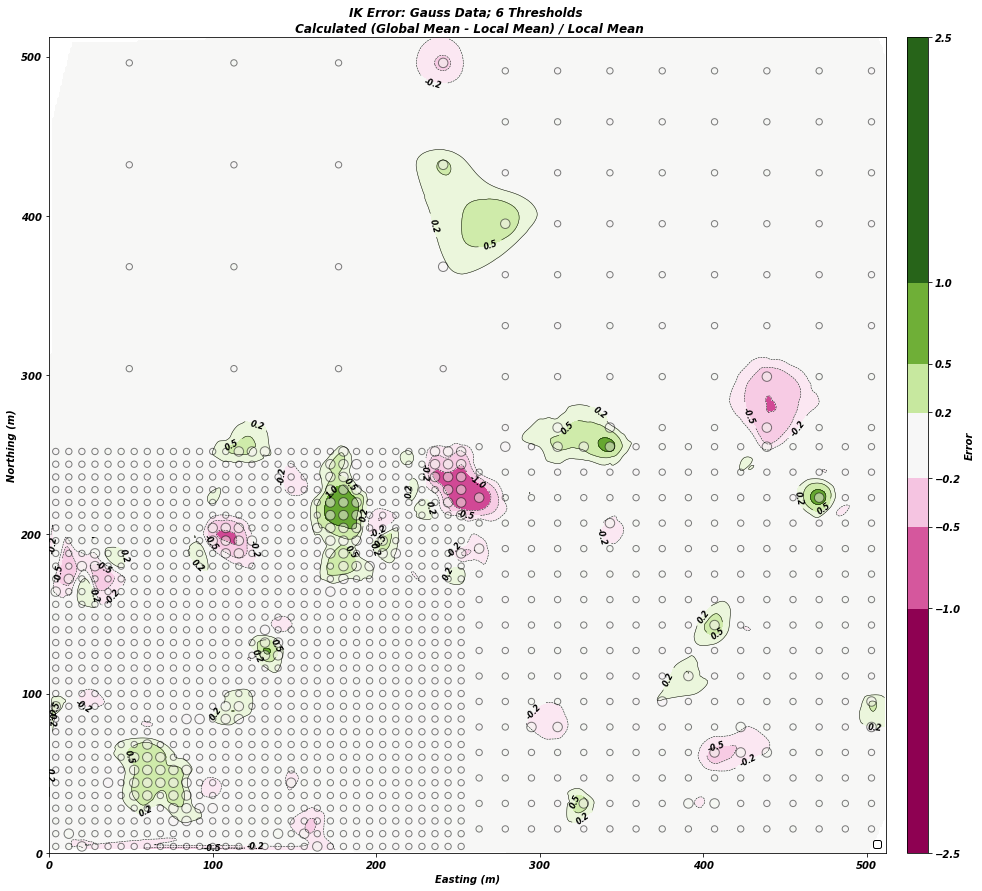

    Evaluating Error for 7 thresholds...


No handles with labels found to put in legend.


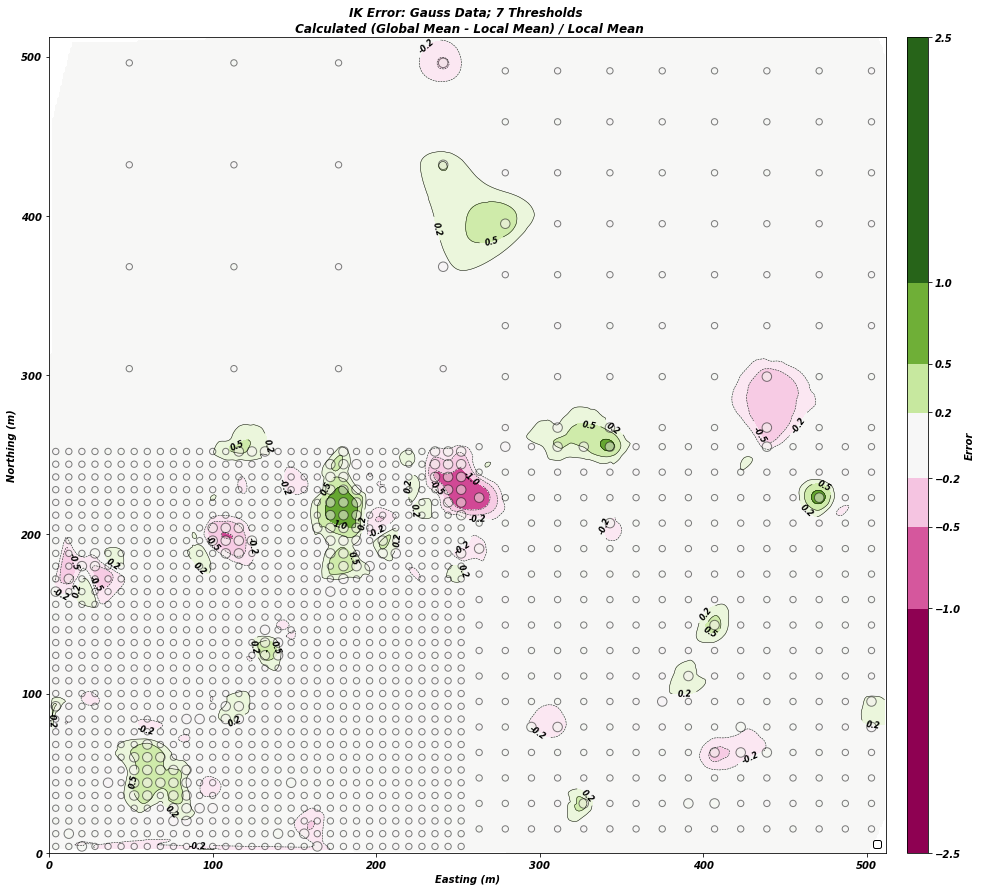

    Evaluating Error for 8 thresholds...


No handles with labels found to put in legend.


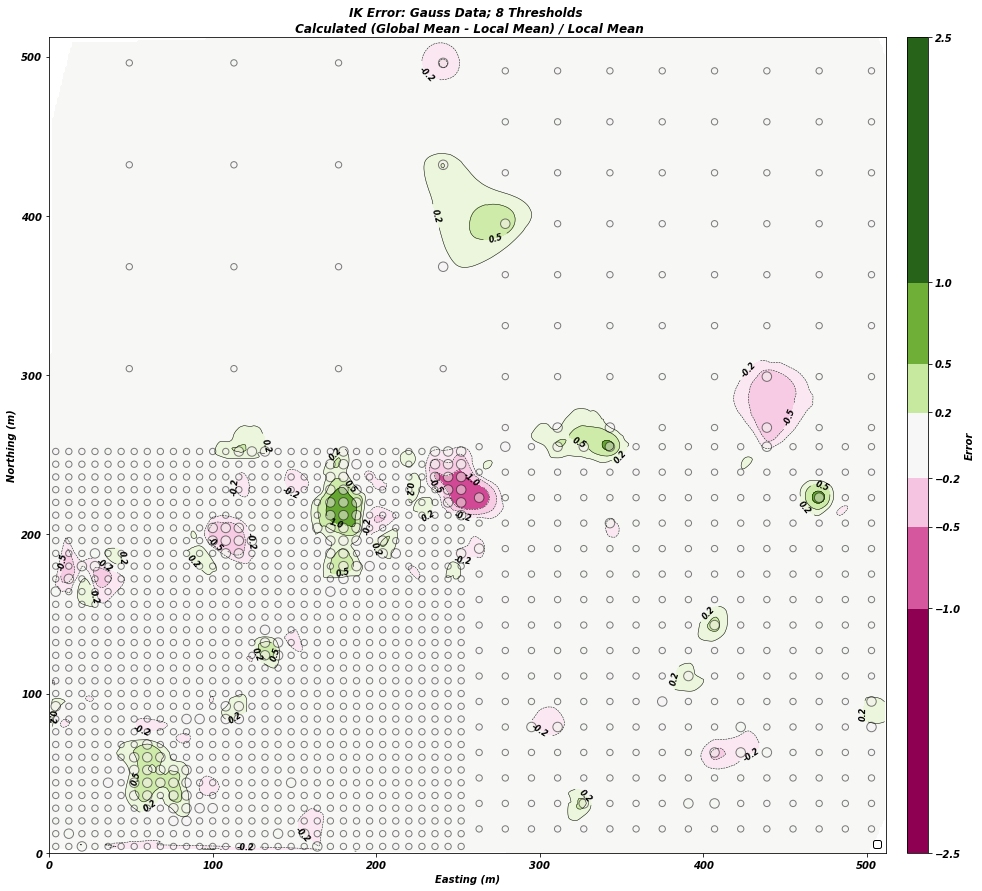

    Evaluating Error for 9 thresholds...


No handles with labels found to put in legend.


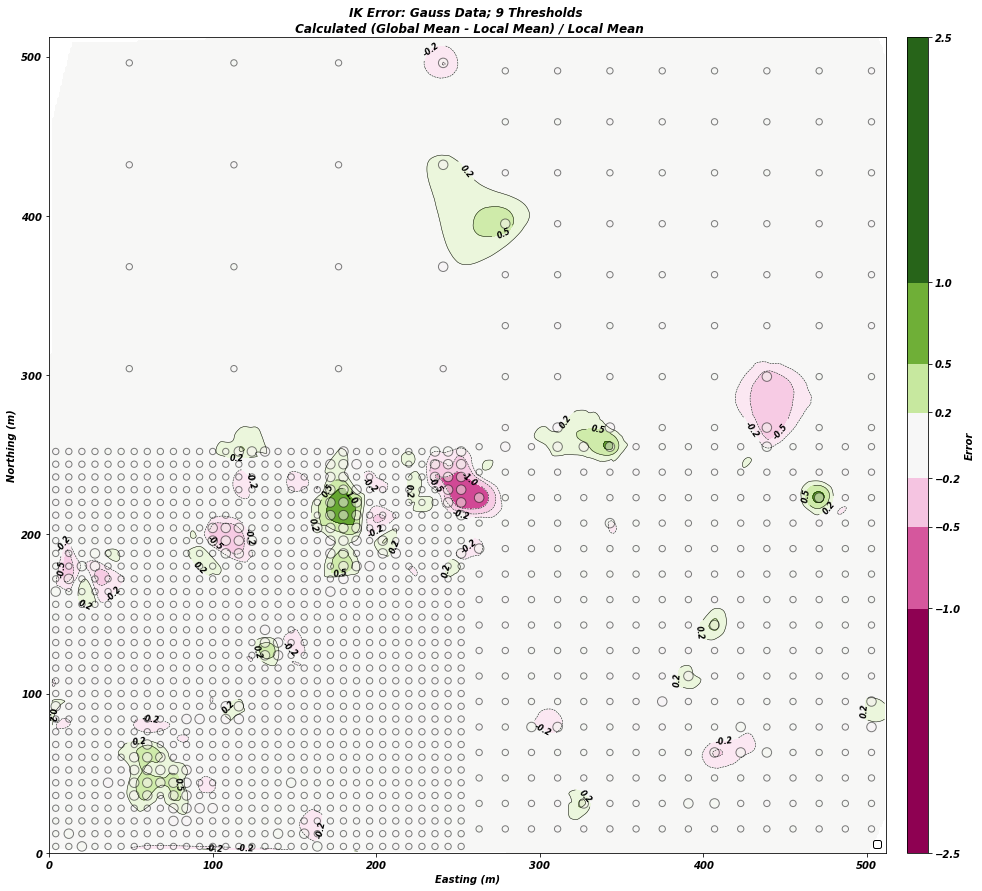

    Evaluating Error for 10 thresholds...


No handles with labels found to put in legend.


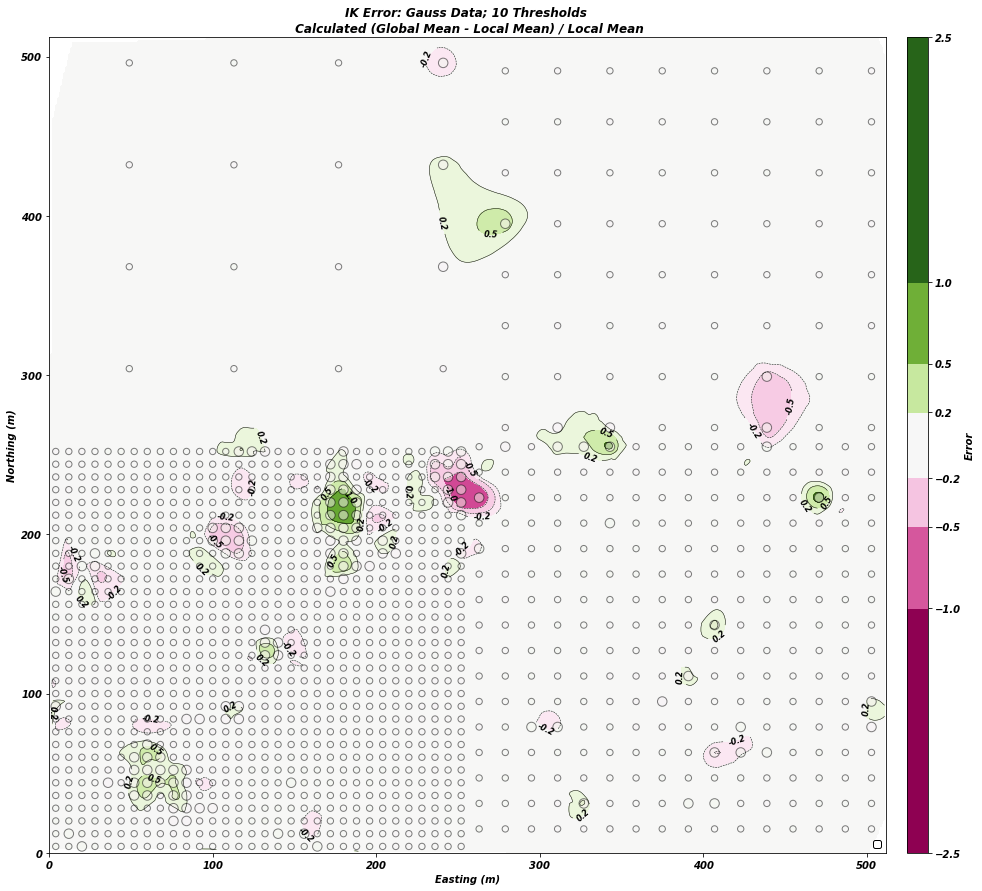

    Evaluating Error for 11 thresholds...


No handles with labels found to put in legend.


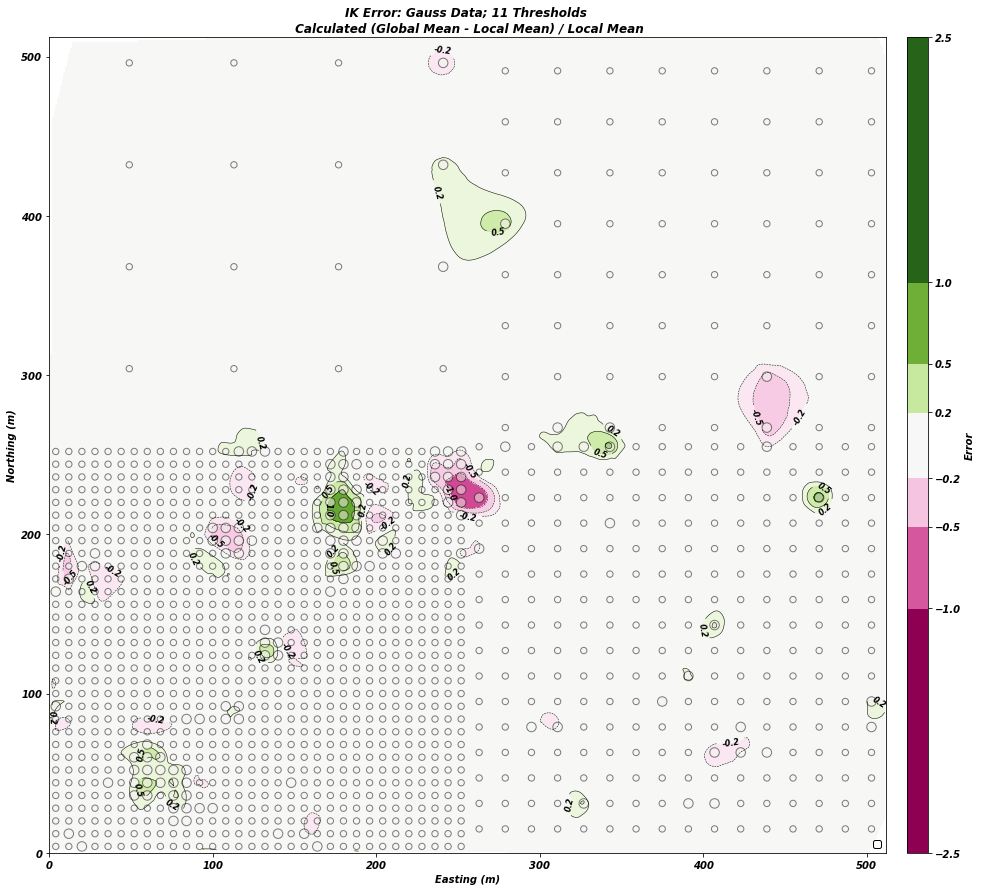

    Evaluating Error for 12 thresholds...


No handles with labels found to put in legend.


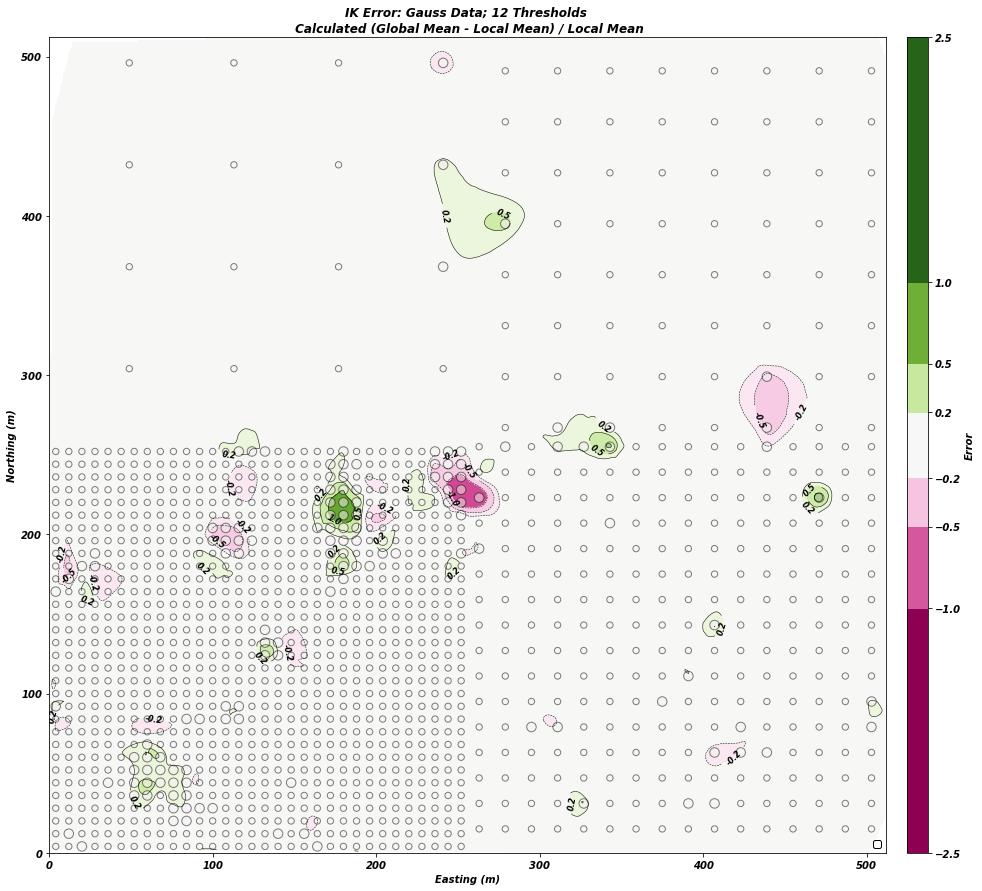

    Evaluating Error for 13 thresholds...


No handles with labels found to put in legend.


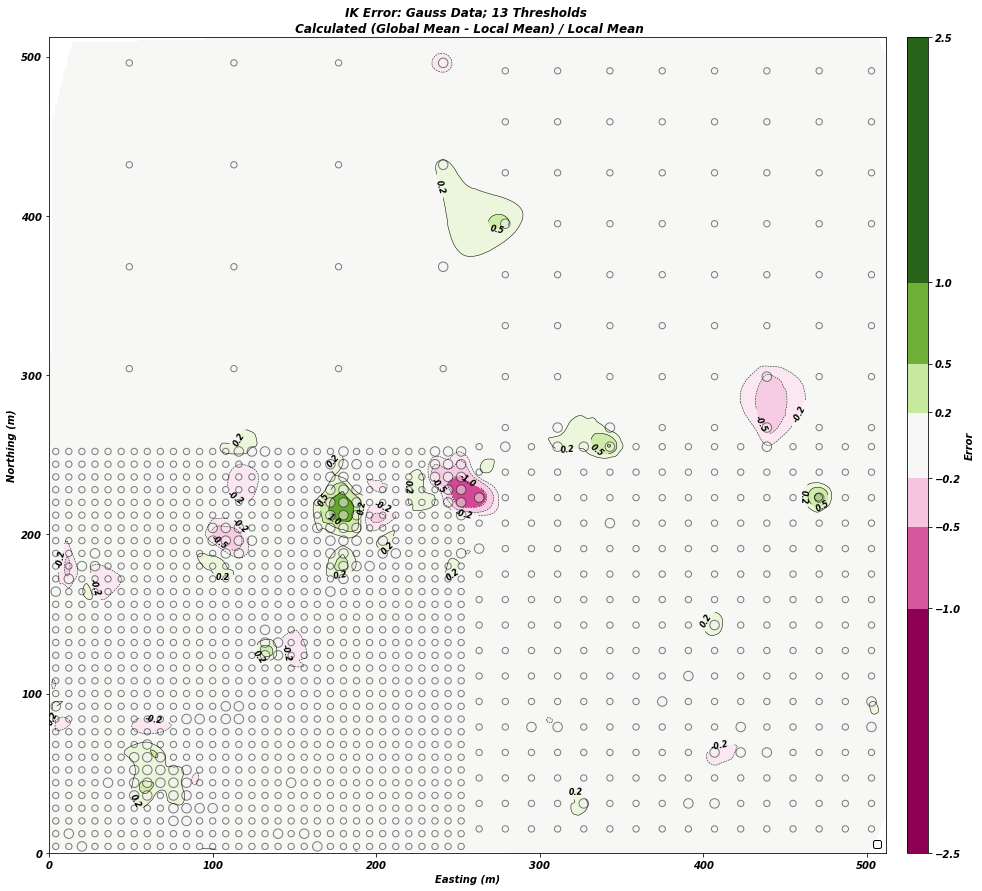

    Evaluating Error for 14 thresholds...


No handles with labels found to put in legend.


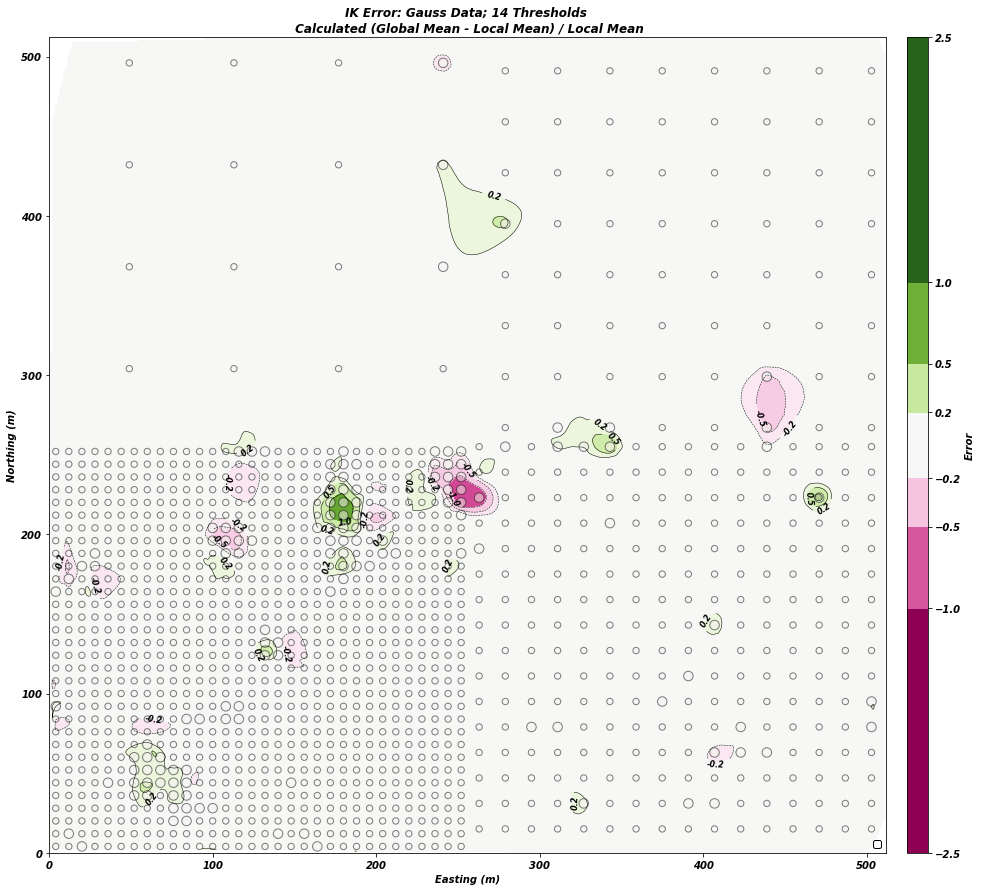

    Evaluating Error for 15 thresholds...


No handles with labels found to put in legend.


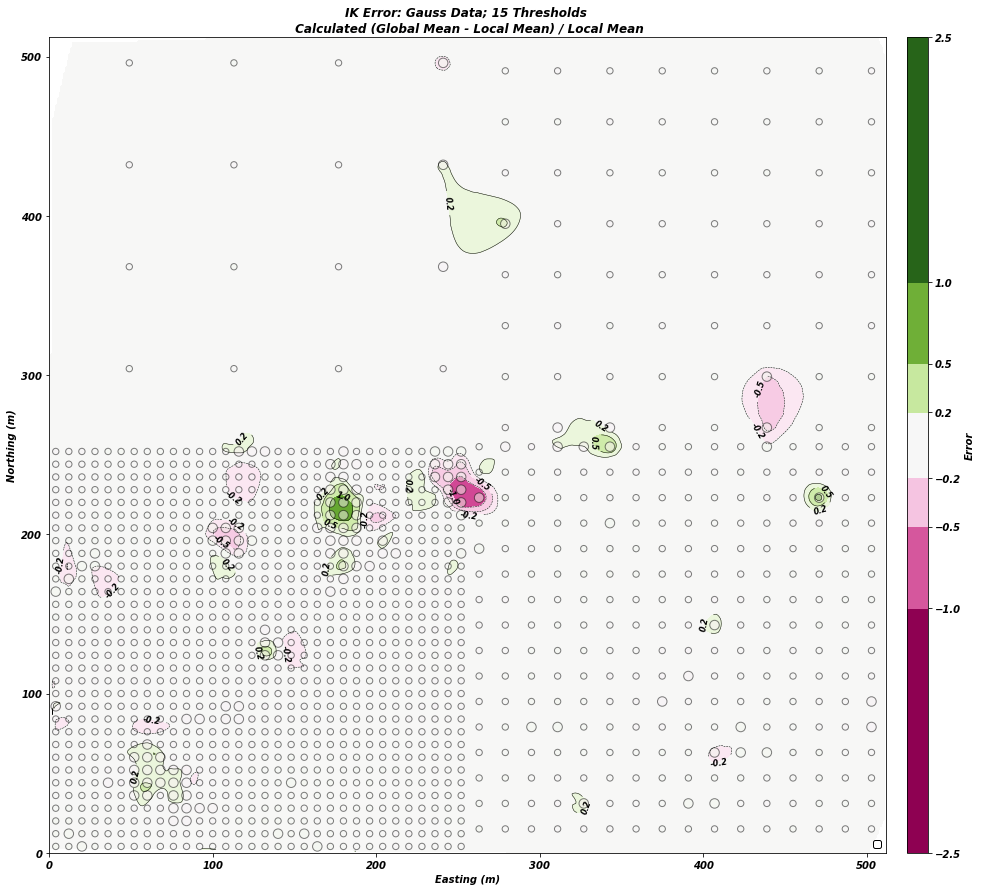

Plotting LN IK error maps...
    Evaluating Error for 5 thresholds...


No handles with labels found to put in legend.


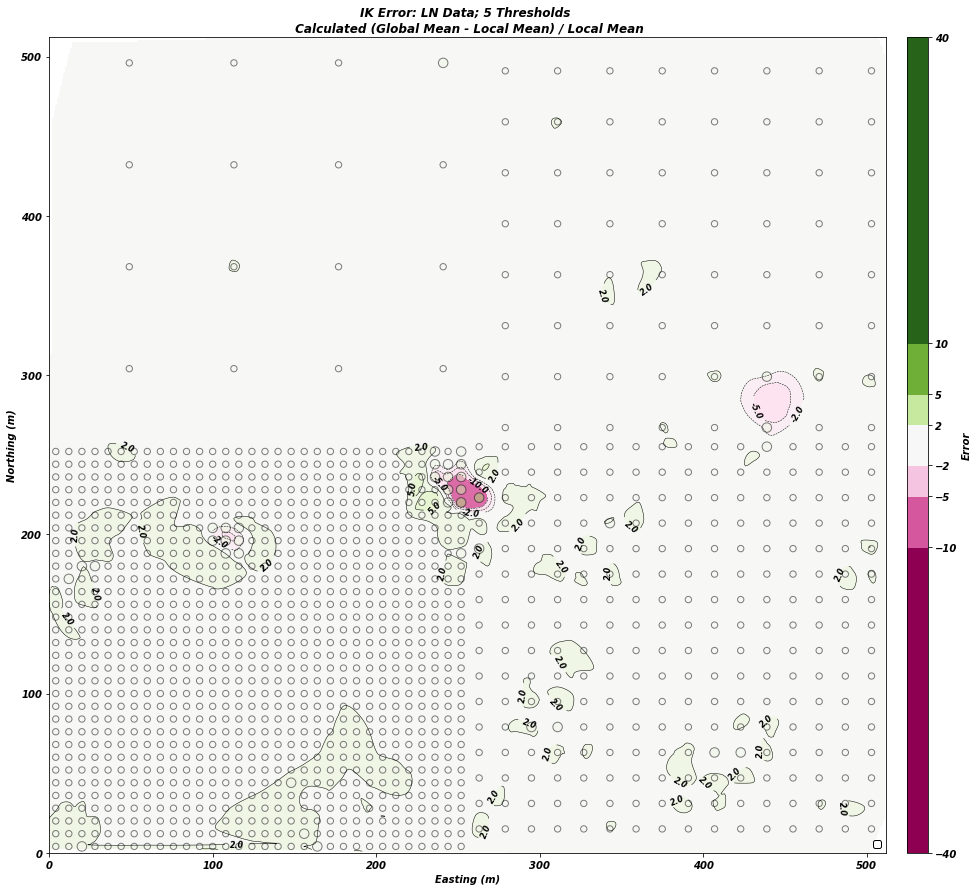

    Evaluating Error for 6 thresholds...


No handles with labels found to put in legend.


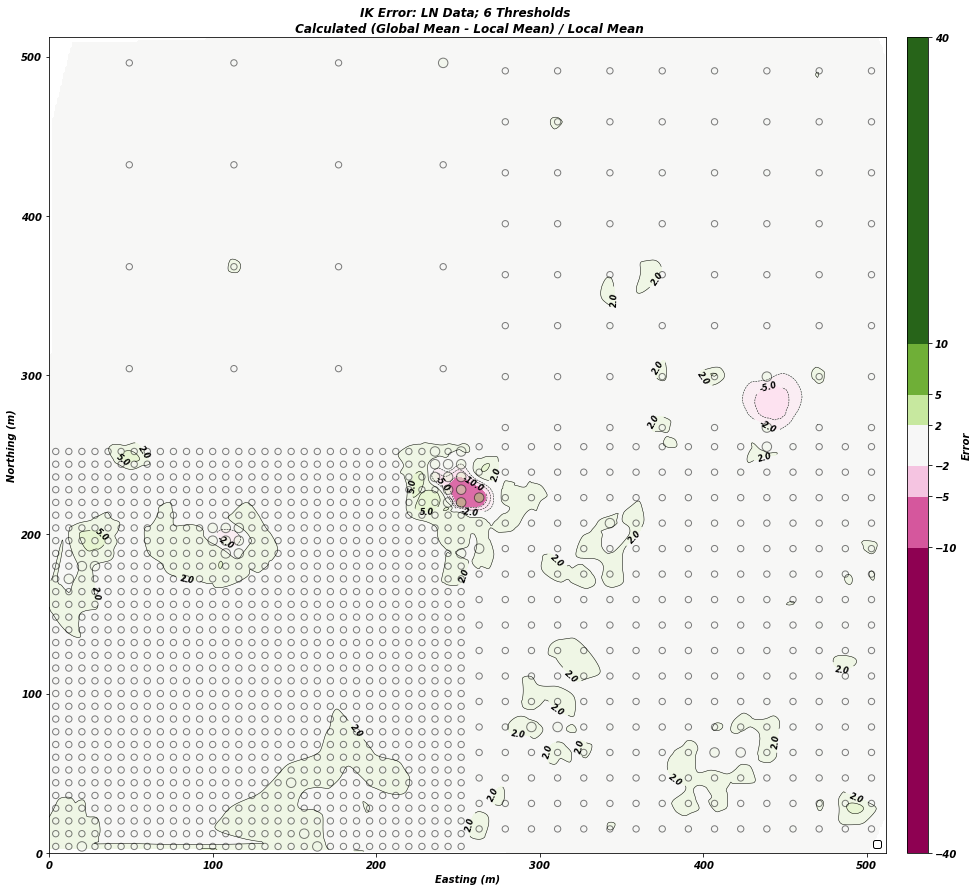

    Evaluating Error for 7 thresholds...


No handles with labels found to put in legend.


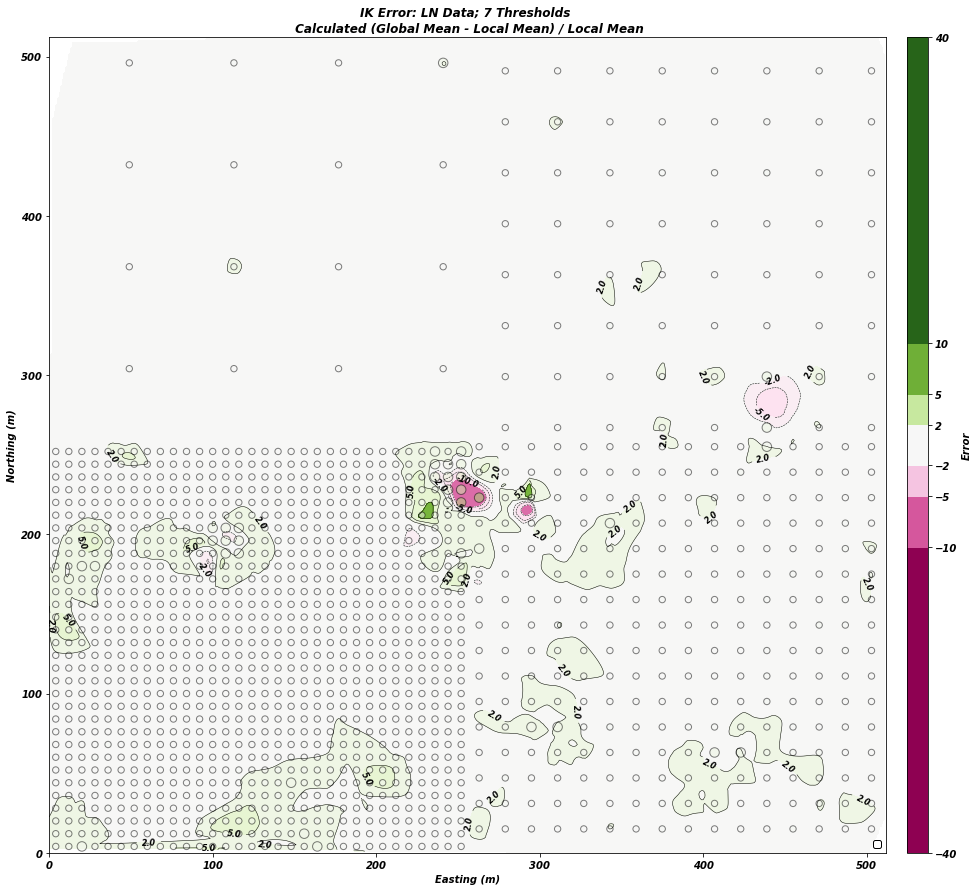

    Evaluating Error for 8 thresholds...


No handles with labels found to put in legend.


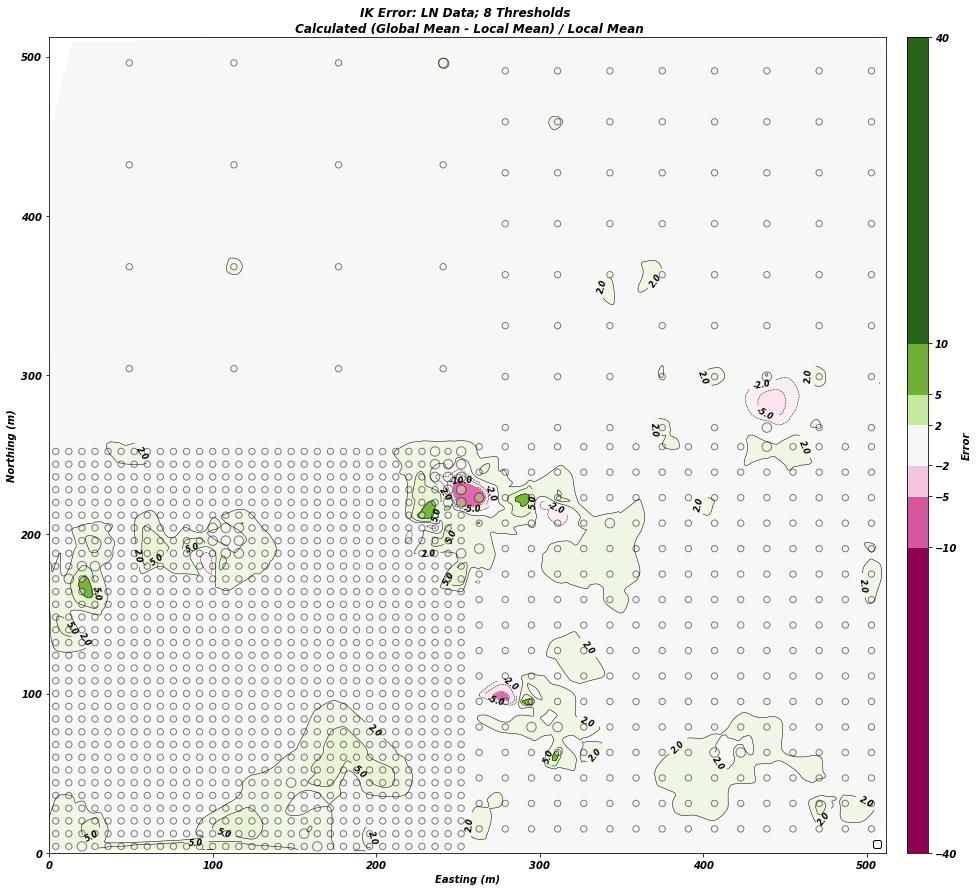

    Evaluating Error for 9 thresholds...


No handles with labels found to put in legend.


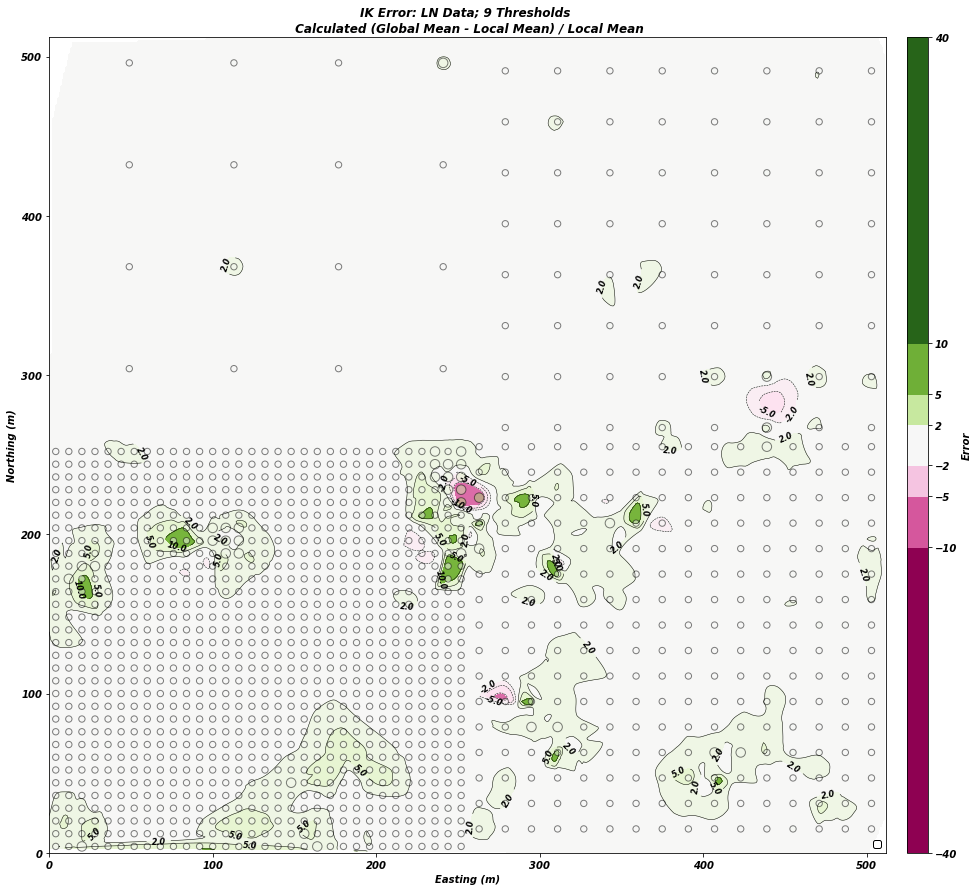

    Evaluating Error for 10 thresholds...


No handles with labels found to put in legend.


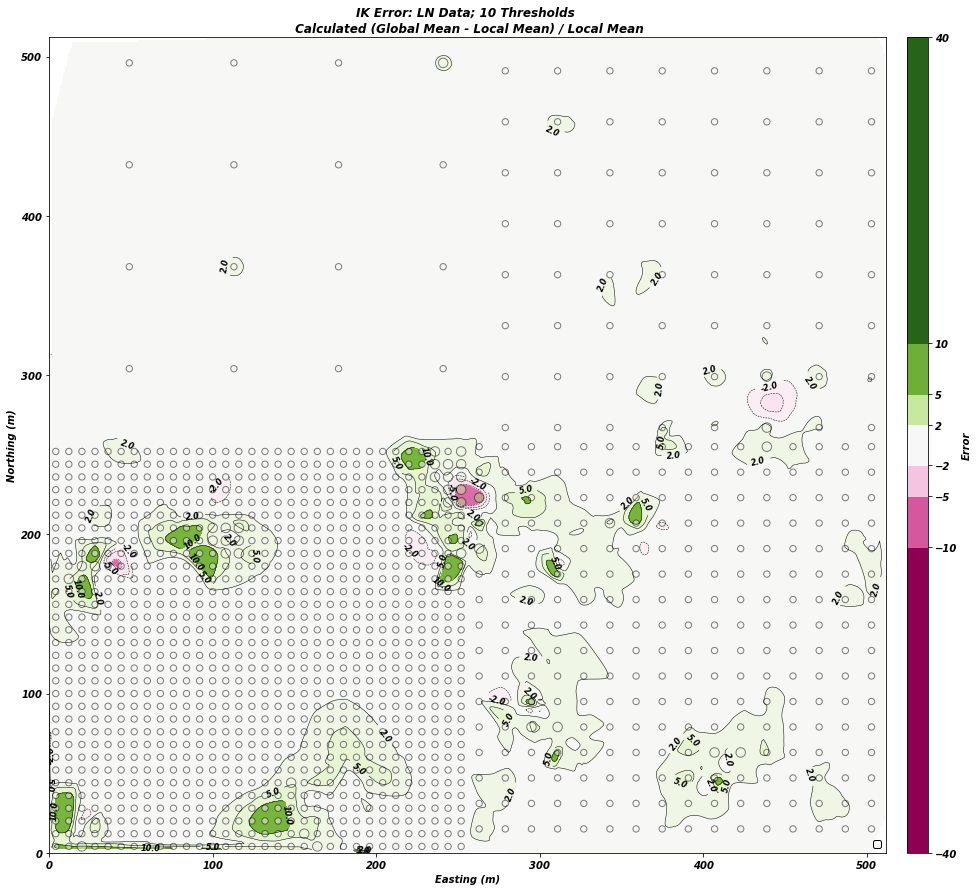

    Evaluating Error for 11 thresholds...


No handles with labels found to put in legend.


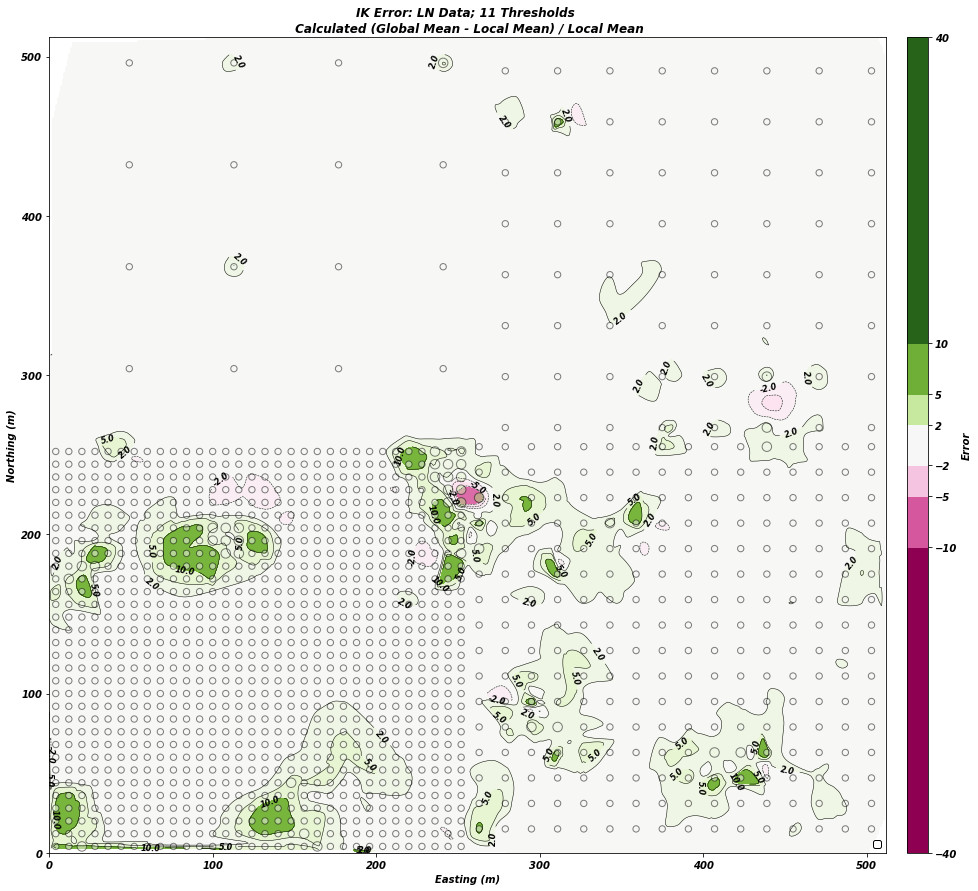

    Evaluating Error for 12 thresholds...


No handles with labels found to put in legend.


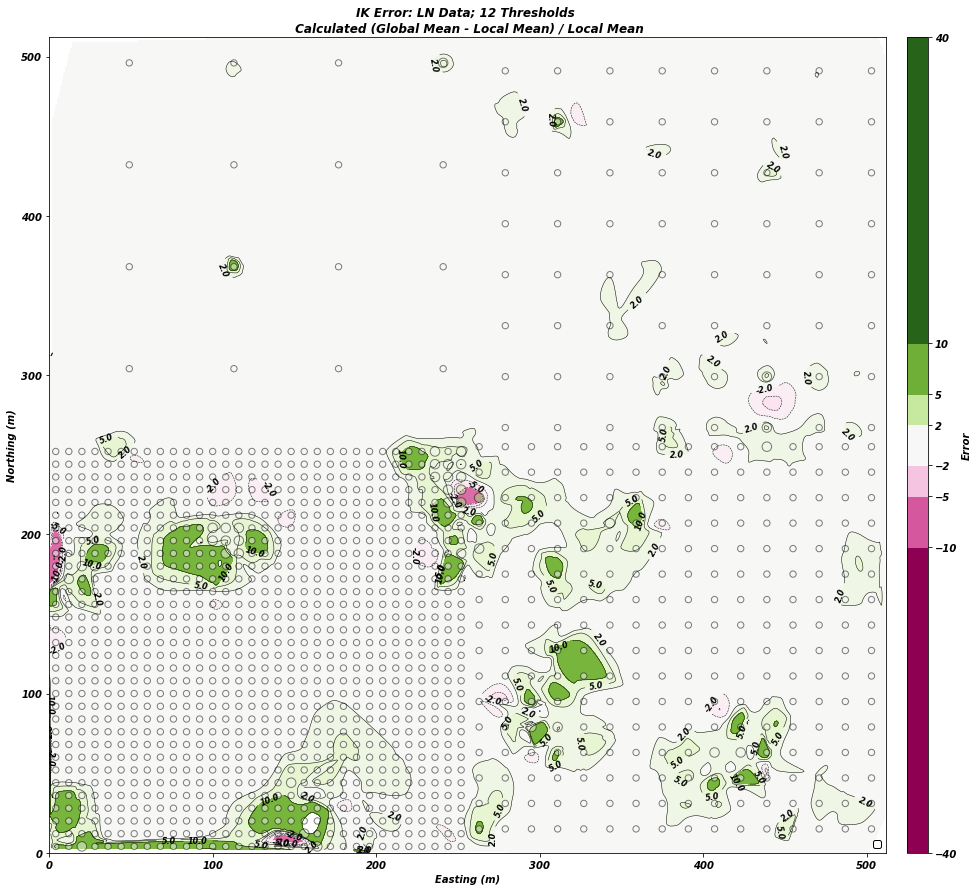

    Evaluating Error for 13 thresholds...


No handles with labels found to put in legend.


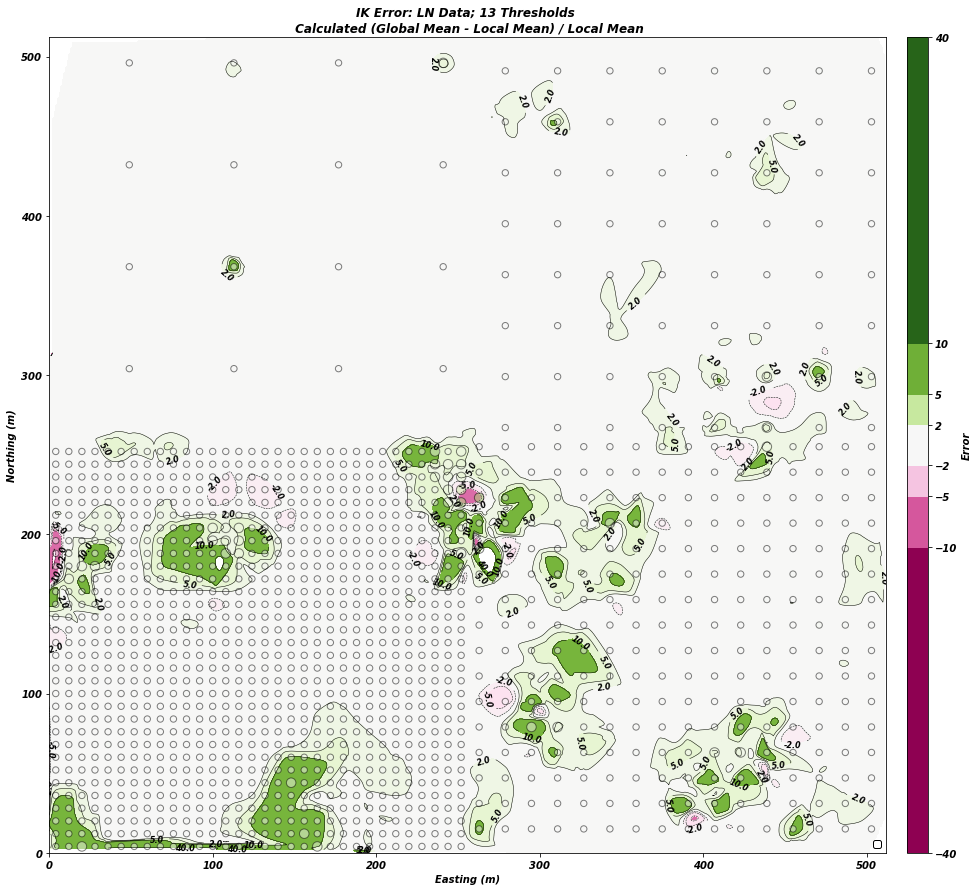

    Evaluating Error for 14 thresholds...


No handles with labels found to put in legend.


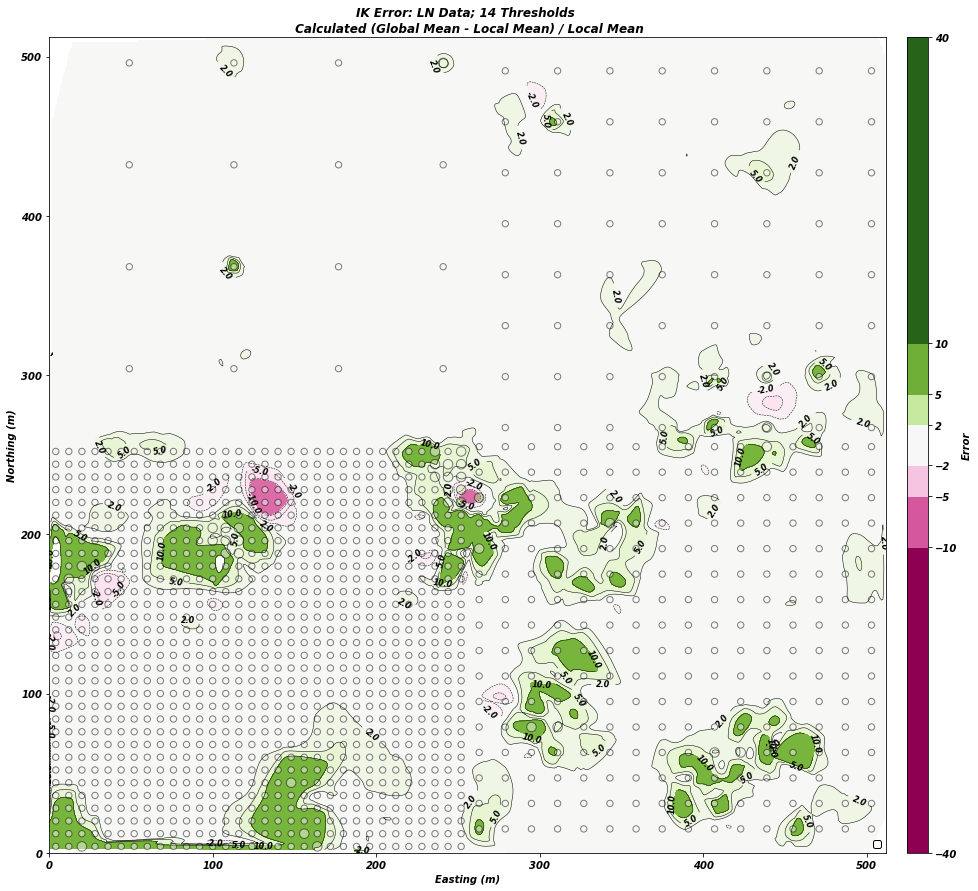

    Evaluating Error for 15 thresholds...


No handles with labels found to put in legend.


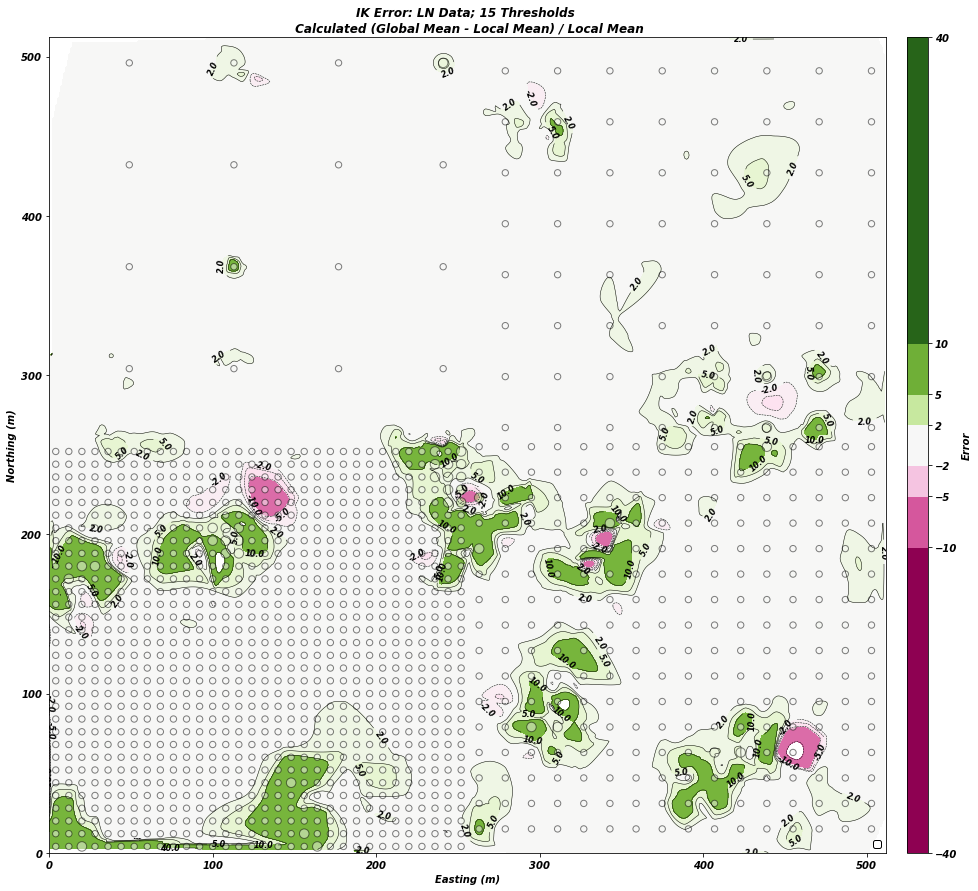

In [666]:
# Generate grid for contours from IK estimates
X_loc = orig_est['X'].values # IK est x-loc
Y_loc = orig_est['Y'].values # IK est y-loc
points = np.column_stack((X_loc, Y_loc)) # IK est (x,y) as 2D grid

x_grid, y_grid = np.mgrid[x_min:x_max, y_min:y_max] # grid for contour

# Contour intervals: Error
g_bounds = [-2.5, -1, -0.5, -0.2, 0.2, 0.5, 1, 2.5] # Gauss error
ln_bounds = [-40, -10, -5, -2, 2, 5, 10, 40] # LN error

# Countour Levels (match colour bar intervals)
levels_errdiff = [g_bounds, ln_bounds]

# Define the bins and normalize
cmap = mpl.cm.PiYG
norm_g_err = mpl.colors.BoundaryNorm(g_bounds, cmap.N)
norm_ln_err = mpl.colors.BoundaryNorm(ln_bounds, cmap.N)
norm_err = [norm_g_err, norm_ln_err]

figsz = (15, 15) # Figure size

# Variable labels (Y=Gauss, Z=LN)
labels = ['Y', 'Z']

# Colorbar Limits
vlims = [(-50, 50), (-100, 100)]

# Iterate through data and threshold scenarios 
#    (IK Error: Local Class Mean - Global Class Mean)
#  Note, s, tt, nt are not used right now - they provide sample overlay
for ((key, val), lev, labs, vlim, 
     norm, s, tt, nt) in zip(ik_err_dict.items(), levels_errdiff, 
                             labels, vlims, norm_err, smp, ttype, 
                             nttype):
    print(f"Plotting {key} IK error maps...")
    for k, thresh, in val.items():
        err_keys = [kk for kk in thresh.keys()]
        print(f"    Evaluating {err_keys[0]} for {k} thresholds...")
        Z_orig = thresh[err_keys[0]][orig_mask] 
        z_grid = griddata(points, Z_orig, (x_grid, y_grid), method='cubic')

        # Generate Plot
        fig, ax = plt.subplots(figsize=figsz)
        # Error contours
        contours = ax.contour(x_grid, y_grid, z_grid, levels=lev,
                              linewidths=0.5, colors='k')
        ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f') #cntr labels
        cntr1 = ax.contourf(x_grid, y_grid, z_grid, levels=lev, 
                            cmap='PiYG', alpha=1.0)
        # Data locations
        #  Non-tail data
        ax.scatter(nt[:,0], nt[:,1], c=nt[:,2], s=40, 
                   cmap='PiYG',  edgecolor='k', vmin=vlim[0], vmax=vlim[1],
                   linewidth=1, alpha=0.5)
        #  Tail data
        ax.scatter(tt[:,0], tt[:,1], c=tt[:,2], s=90, 
                   cmap='PiYG', edgecolor='k', vmin=vlim[0], vmax=vlim[1],
                   linewidth=1, alpha=0.5)
        ax.legend(loc='lower right', framealpha=1.0, edgecolor='k')

        # Modify colorbar
        axins = inset_axes(ax, width='2.5%', height='100%', 
                           bbox_to_anchor=(0.05, 0, 1, 1), 
                           bbox_transform=ax.transAxes, borderpad=0)
        cb2 = mpl.colorbar.ColorbarBase(axins, cmap=cmap, norm=norm, 
                                        spacing='proportional', ticks=lev,
                                        boundaries= lev,
                                        extend='neither')
        cb2.set_clim(lev[0], lev[-1])
        cb2.ax.set_ylabel("Error")

        # Labels
        ax.set(xlim=(x_min, x_max), 
               ylim=(y_min, y_max), 
               title=(f"IK Error: {key} Data; {k} Thresholds \n "
                      f"Calculated (Global Mean - Local Mean) / Local Mean"),
               xlabel='Easting (m)',
               ylabel='Northing (m)')
        plt.show()

### Percent Difference (Local - Global) / Global

In [ ]:
# norm_pctdiff = mpl.colors.BoundaryNorm(pct_bounds, cmap.N)
levels_pctdiff = pct_bounds

figsz = (15, 15) # Figure size

# Variable labels (Y=Gauss, Z=LN)
labels = ['Y', 'Z']

# Generate grid for contours from IK estimates
X_loc = orig_est['X'].values # IK est x-loc
Y_loc = orig_est['Y'].values # IK est y-loc
points = np.column_stack((X_loc, Y_loc)) # IK est (x,y) as 2D grid

x_grid, y_grid = np.mgrid[x_min:x_max, y_min:y_max] # grid for contour


# Iterate through data and threshold scenarios 
#    (IK Error: Local Class Mean - Global Class Mean)
#  Note, s, tt, nt are not used right now - they provide sample overlay
for ((key, val), labs, 
      s, tt, nt) in zip(ik_err_dict.items(), labels, smp, ttype, nttype):
    if key == 'LN':
        print(f"Plotting {key} IK error maps...")
        for k, thresh, in val.items():
            err_keys = [kk for kk in thresh.keys()]
            print(f"    Evaluating {err_keys[1]} for {k} thresholds...")
            Z_orig = thresh[err_keys[1]][orig_mask] 
            z_grid = griddata(points, Z_orig, (x_grid, y_grid), 
                              method='cubic')
#             gs.histplt(Z_orig, bins=25)
            # Generate Plot
            fig, ax = plt.subplots(figsize=figsz)
            # Error contours
            # Countour intervals: Pct Diff.
            pct_bounds = [-50, -10, -5, 5, 10, 50] # Pct Diff
            cntrlvl = [-100, -50, -10, -5, 5, 10, 50, 100]
            contours = ax.contour(x_grid, y_grid, z_grid, levels=cntrlvl,
                                  linewidths=0.5, colors='k')
            ax.clabel(contours, inline=True, fontsize=8, fmt='%1.1f') #cntr labels
            cntr1 = ax.contourf(x_grid, y_grid, z_grid, levels=cntrlvl, 
                                cmap='PiYG', alpha=1.0)
#             if k == '5':
#                 ax.scatter(high5_xy['X'], high5_xy['Y'], c=t2, s=100, cmap='PiYG',
#                           edgecolor='k')
#             # Data locations
#             #  Non-tail data
#             ax.scatter(nt[:,0], nt[:,1], c=nt[:,2], s=40, 
#                        cmap='PiYG', edgecolor='k', vmin=vlim[0], 
#                        vmax=vlim[1], linewidth=1, alpha=0.5)
#             #  Tail data
#             ax.scatter(tt[:,0], tt[:,1], c=tt[:,2], s=90, 
#                        cmap='PiYG', edgecolor='k', vmin=lnlims[0], 
#                        vmax=lnlims[1], linewidth=1, alpha=0.9)
#             ax.legend(loc='lower right', framealpha=1.0, edgecolor='k')

            # Modify colorbar
            axins = inset_axes(ax, width='2.5%', height='100%', 
                               bbox_to_anchor=(0.05, 0, 1, 1), 
                               bbox_transform=ax.transAxes, borderpad=0)
            normpct = mpl.colors.BoundaryNorm(pct_bounds, cmap.N)
            cb2 = mpl.colorbar.ColorbarBase(axins, cmap=cmap, norm=normpct, 
                                            spacing='proportional', 
                                            ticks=pct_bounds,
                                            boundaries= [-1000] + pct_bounds + [1200],
                                            extend='both')
#             cb2.set_clim(levels_pctdiff[0], levels_pctdiff[-1])
            cb2.ax.set_ylabel("Percent Difference")

            # Labels
            ax.set(xlim=(x_min, x_max), 
                   ylim=(y_min, y_max), 
                   title=(f"IK Error: {key} Data; {k} Thresholds \n "
                          f"Calculated (Global Mean - Local Mean) / Local Mean"),
                   xlabel='Easting (m)',
                   ylabel='Northing (m)')
            plt.show()

In [ ]:
high5 = high_pctdiff_dict['LN']['5'][0]
high5_glob = ik_est_dict['ik_glob_mean']['LN']['5'][high5]
high5_loc = ik_est_dict['ik_loc_mean']['LN']['5'][high5]

In [ ]:
t1 = np.subtract(high5_glob, high5_loc)
t2 = np.divide(t1, high5_loc) * 100
print(f"Min Error: {t2.min()} \nMax Error: {t2.max()}")

In [ ]:
high5_xy = eloc[['X','Y','Orig_Est']].loc[high5]
high5_xy.describe()

## Error of Nearest Data Value

Evaluating Gauss scenario...
    5 thresholds...


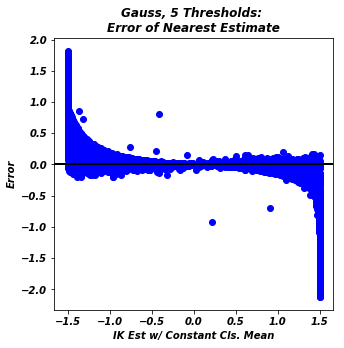

    6 thresholds...


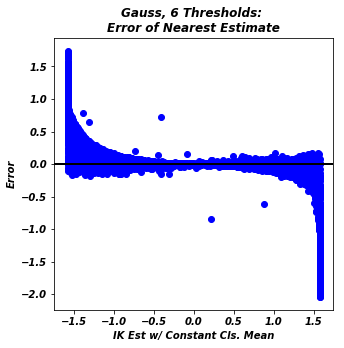

    7 thresholds...


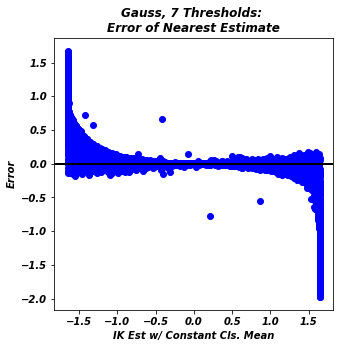

    8 thresholds...


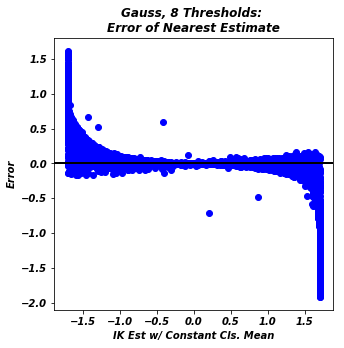

    9 thresholds...


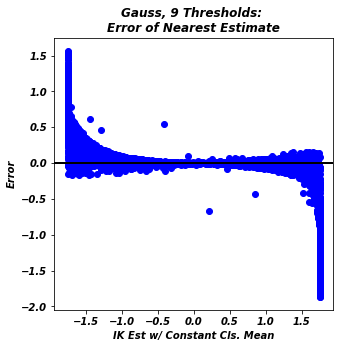

    10 thresholds...


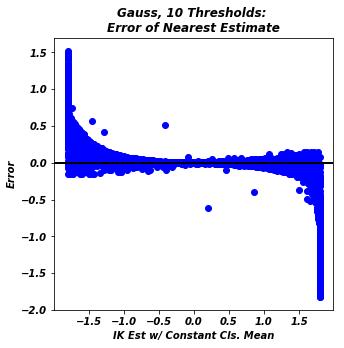

    11 thresholds...


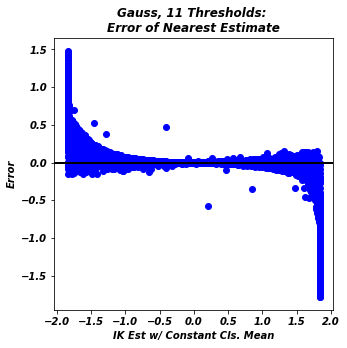

    12 thresholds...


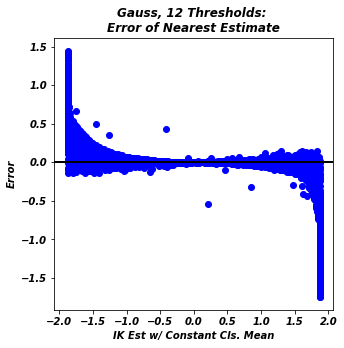

    13 thresholds...


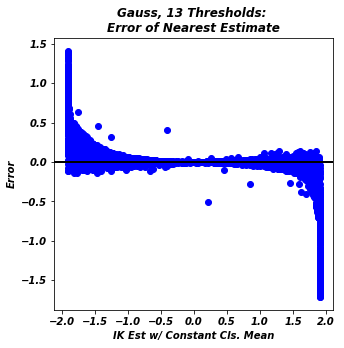

    14 thresholds...


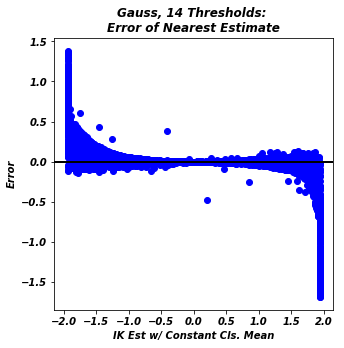

    15 thresholds...


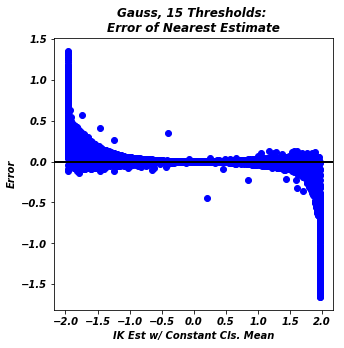

Evaluating LN scenario...
    5 thresholds...


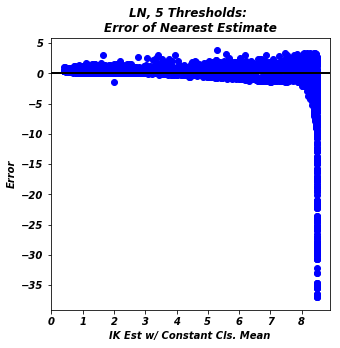

    6 thresholds...


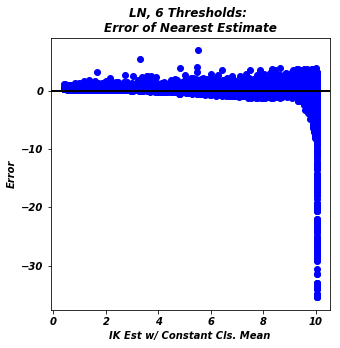

    7 thresholds...


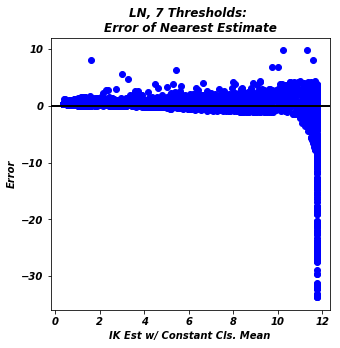

    8 thresholds...


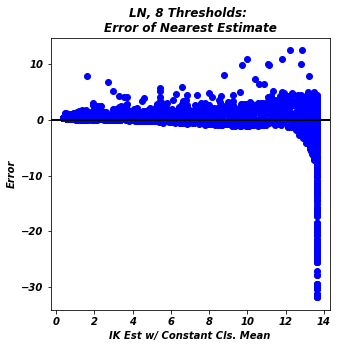

    9 thresholds...


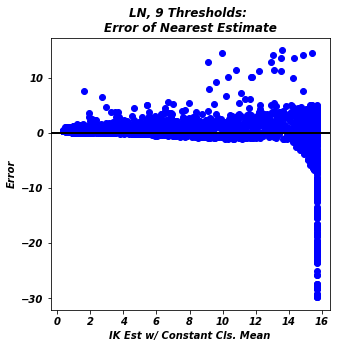

    10 thresholds...


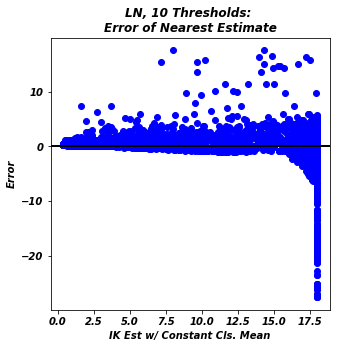

    11 thresholds...


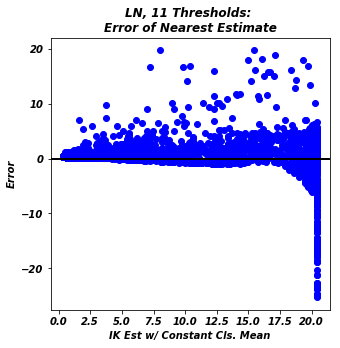

    12 thresholds...


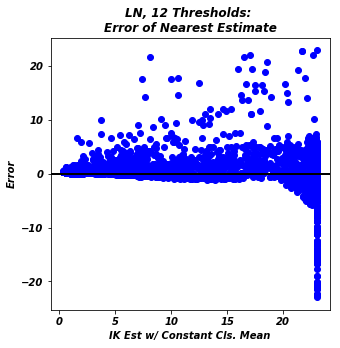

    13 thresholds...


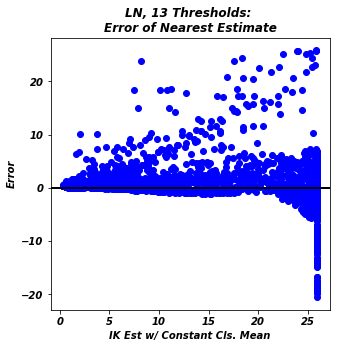

    14 thresholds...


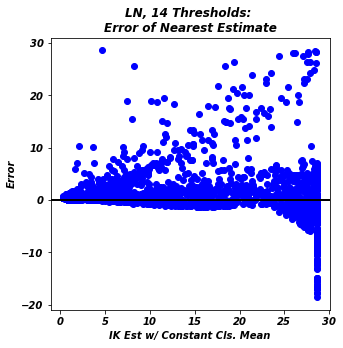

    15 thresholds...


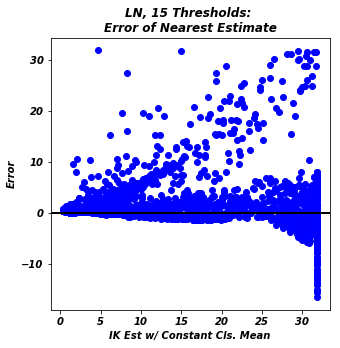

In [667]:
from scipy.spatial import cKDTree

eloc = mc_varc_dict['estlocs']
xylocs = eloc[['X', 'Y']].loc[eloc['Orig_Est'] == 1].values # Orig ests only
# xylocs = np.asarray(eloc[['X','Y']].values) # extract estimate locations

# Locate position of nearest point to each location
cKDTree = scipy.spatial.cKDTree(xylocs, leafsize=8)
near_val = cKDTree.query(xylocs, 2)
near_idx = near_val[1][:,1] # Index of nearest location to data value

# Plot error for each data and threshold scenario (include IK est - glob mean)
for (keys, verr), (keys2, vest) in zip(ik_err_dict.items(), 
                                       ik_est_dict['ik_glob_mean'].items()):
    print(f"Evaluating {keys} scenario...")
    for (k, err), (k2, est) in zip(verr.items(), vest.items()):
        print(f"    {k} thresholds...")
        near_err = err['Error'][orig_mask][near_idx] #orig est mask 
        tmp = np.vstack((est[orig_mask], near_err)).T # combine arrays
        tmp[tmp[:, 0].argsort()] # sort by IK estimate 
        
        fig, ax = plt.subplots(figsize=(5,5))
        ax.scatter(tmp[:,0], tmp[:,1], c='b')
        ax.axhline(y=0, color='k', linewidth=2)
        ax.set(title = f"{keys}, {k} Thresholds: \nError of Nearest Estimate",
               xlabel = f"IK Est w/ Constant Cls. Mean",
               ylabel = "Error")
        plt.show()


# Controls on Class Mean

## Data Prep

In [ ]:
# Select MG predictor variables
preds_mg = ['MG_Mean', 'MG_StDev']
X_mg = mc_varc_dict['estlocs'][preds_mg].values.copy()
print(f"Shape of MG predictor variables: {X_mg.shape}")

# Select LN predictor variables
preds_ln = ['LN_Mean', 'LN_StDev', 'LN_CoV']
X_ln = mc_varc_dict['estlocs'][preds_ln].values.copy()
print(f"Shape of MG predictor variables: {X_ln.shape}")

Xs_dict = dict(Gauss = X_mg, LN = X_ln)

In [ ]:
# Select only Gauss and LN data
Y_dict = copy.deepcopy({k: v for k, v in 
                           class_means_dict['loc_cls_mean'].items() 
                           if k == 'Gauss' or k == 'LN'})

In [ ]:
# Remove NaN values from CCDFs in each class and store
dictkeys = {k for k in Y_dict.keys()}
gb_dict = dict.fromkeys(dictkeys)

for (Xs_key,Xs_val), (Y_key,Y_val) in zip(
    Xs_dict.items(), Y_dict.items()):
    
    print(f"Data prep: {Xs_key}")
    update_dict = {}
    for k, ncls in zip(threshes, thresh_dict['n_classes'].values()):
        print(f"    Removing NaN values for {k} thresholds / "
              f"{ncls} classes...")
        # Generate temp dict with keys corresponding class range
        cls_keys = [str(num + 1) for num in range(ncls)]
        dat_dict = dict.fromkeys(cls_keys)
        Y = Y_val[k].T # transpose to align with X-data
        # Concatenate with X-data
        tmp = np.concatenate((Xs_val, Y), axis=1)
        # Iteratively store each class Y response with Xs
        for idx, v in dat_dict.items():
            if Xs_key == 'Gauss':
                dat = tmp[:, [0, 1, int(idx)+1]] # no CoV column for Gauss
            else:
                dat = tmp[:, [0, 1, 2, int(idx)+2]] # CoV column for LN
            gb_dat = copy.deepcopy(dat[~np.isnan(dat).any(axis=1)]) # remove NaN
            print(f"      Shape of array for Class {k}: {gb_dat.shape}")
            dat_dict[idx] = gb_dat # store in new dictionary
        update_dict[k] = dat_dict
    gb_dict.update({Xs_key: update_dict})
print("Finished preparing data for gradient boosting analysis.")
gb_dict = {k: gb_dict[k] for k in sorted(gb_dict)}
prnt_keys(gb_dict)

## Bivariate Analysis

In [ ]:
import collections
def flatten(x):
    """Function to flat irregular lists of list. In this case, it is used to 
    append class labels to an existing list."""
    result = []
    for el in x:
        if isinstance(x, collections.Iterable) and not isinstance(el, str):
            result.extend(flatten(el))
        else:
            result.append(el)
    return result

In [ ]:
labels = [['Mean', 'Std. Dev.'], ['Mean', 'Std. Dev.', 'CoV']]

for ((Xs_key,Xs_val), (Y_key,Y_val), (key,v), labs) in zip(
    Xs_dict.items(), Y_dict.items(), class_means_dict['class_labels'].items(), 
    labels):
    
    for thresh, val in v.items():
        labs.append(list(val.values())) # append class labels labels list
        plt_labels = flatten(labs)
        Y = Y_val[thresh].T
        tmp = np.concatenate((Xs_val, Y), axis=1)
        gs.scatplts(tmp, nmax=1000, figsize=(12,12), labels=plt_labels,
                    stat_xy=(0.95,0.95), pad=(-5,-3), s=10)
        plt.suptitle(f'{Xs_key}: {thresh} Classes', y=1.01)

## Evaluation Functions

In [ ]:
import rmsp; rmsp.activate()
from sklearn.model_selection import KFold
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble.partial_dependence import plot_partial_dependence
from sklearn.preprocessing import RobustScaler

In [ ]:
def evaluate_with_all_data(mod):
    # Fit to the data
    mod.fit(X_data, y_data)

    # Predict the response with same data
    return mod.predict(X_data)

In [ ]:
def evaluate_with_folds(mod):
    y_true, y_predict = [], []
    
    # Generate data folds before iterating over them
    kfold = KFold(n_splits=5, shuffle=True, random_state=515151)
    for train_idx, test_idx in kfold.split(X_data):

        # Get the training and test data
        X_train, X_test = X_data[train_idx], X_data[test_idx]
        y_train, y_test = y_data[train_idx], y_data[test_idx]

        # Fit to the training data
        mod.fit(X_train, y_train)

        # Predict test data and back-transform
        y_pred = mod.predict(X_test)

        # Store results for comparison
        y_true.append(y_test)
        y_predict.append(y_pred)

    # Merge the results and return
    y_predict = np.concatenate(y_predict)
    y_true = np.concatenate(y_true)
    return y_predict, y_true

In [ ]:
def fit_evaluate(mod):
    
    # Fit with all data
    y_predict = evaluate_with_all_data(mod)
    
    # Fit with folds
    y_predict_folded, y_test_folded = evaluate_with_folds(mod)

    # Plot results
    fig, axes = plt.subplots(1, 2, figsize=(8, 5))
    for x, y, title, ax in zip(
        (y_predict, y_predict_folded), (y_data, y_test_folded),
        ('Fit and Evaluated with All Data',
         'Fit to Training and Evaluated with Test'), axes):
        
        df = pd.DataFrame(np.column_stack((x, y)),
                          columns=['Predicted ' + resp,
                                   'True ' + resp])
        xval = rmsp.CrossVal(df, 'Predicted ' + resp,
                             'True ' + resp, 0)
        xval.scatplot(df, ax=ax, title=title)
    fig.tight_layout()

## Stochastic Gradient Boosting

In [ ]:
resp = 'Class Mean'
preds = [['m_c', 'std_c'], ['m_c', 'std_c', 'CoV_c']]

for (keys, vals), labs in zip(gb_dict.items(), preds):
    print(f"{keys} scenario:")
    for thresh, dat in vals.items():
        print(f"  For {thresh} thresholds...")
        for cls, arr in dat.items():
            print(f"    Isolating pred and resp data for class {cls}...")
            if keys == 'Gauss':
                X_data = arr[:,:2]
            else:
                X_data = arr[:,:3]
            y_data = arr[:,-1].flatten()
            print(f"      Running gradient boosting regressor...")
            gbrmod = GradientBoostingRegressor(max_depth=2, max_features='auto',
                                   n_estimators=3000, learning_rate=0.001, 
                                   subsample=0.6,
                                   min_weight_fraction_leaf=0.005)
            fit_evaluate(gbrmod)
            for var, imp in zip(labs, gbrmod.feature_importances_):
                print('      {} importance = {:.2f}'.format(var, imp))
            fig, axes = plot_partial_dependence(gbrmod, X_data, 
                                    list(range(len(labs))), 
                                    feature_names=labs, figsize=(11,5))
            fig.suptitle(f'{keys} Dist., {thresh} Thresh.: Class {cls}',
                         y=0.75)
print("Finished analysis!")

# Plots for Paper

## Location and Sample Plot

[0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0]


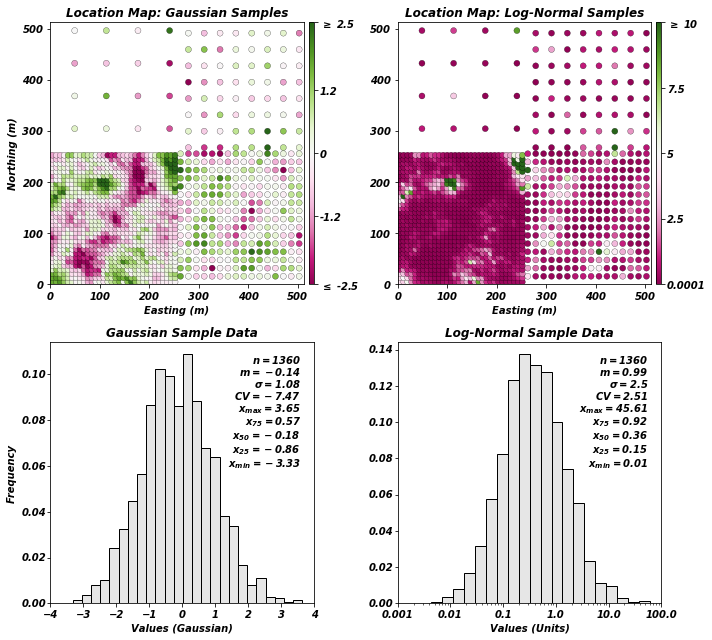

In [576]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 9))
gs.scatplt(x=samps['X'], y=samps['Y'], c=samps['value'], cmap='PiYG',
           xlabel='Easting (m)', ylabel='Northing (m)', xlim=(0,512), 
           ylim=(0,512), cbar=True, cbar_label='', 
           clim=(-2.5,2.5), ax=ax1, edgecolor='k', linewidth=0.25,
           title='Location Map: Gaussian Samples', stat_blk=False)
gs.scatplt(x=samps['X'], y=samps['Y'], c=samps['ln_value'], cmap='PiYG',
           xlabel='Easting (m)', ylabel=False, xlim=(0,512), ylim=(0,512), 
           cbar=True, cbar_label='', clim=(0.0001, 10), ax=ax2, 
           edgecolor='k', linewidth=0.25, 
           title='Location Map: Log-Normal Samples',
           stat_blk=False)
gs.histplt(samps['value'], bins=25, ax=ax3, xlabel='Values (Gaussian)', 
           ylabel='Frequency', title='Gaussian Sample Data', xlim=(-4, 4))
gs.histplt(samps['ln_value'], bins=25, ax=ax4, xlabel='Values (Units)',
          title='Log-Normal Sample Data', xlim=(0.001, 100), logx=True)

# Change log-histogram to show 100 instead of 1+e02
a4labs = ax4.get_xticks().tolist()
print(a4labs)
a4labs[-2] = 100.0
ax4.set_xticklabels(a4labs)

fig.tight_layout()

plt.savefig(pltdir+'dat_info.png', format='png', dpi=600, transparent=False)
plt.savefig(ccgdir+'dat_info.pdf', format='pdf', dpi=600, transparent=False)

plt.show()
# clim=(0.02,11)

## $m_c$/$\sigma^2_c$ Plots

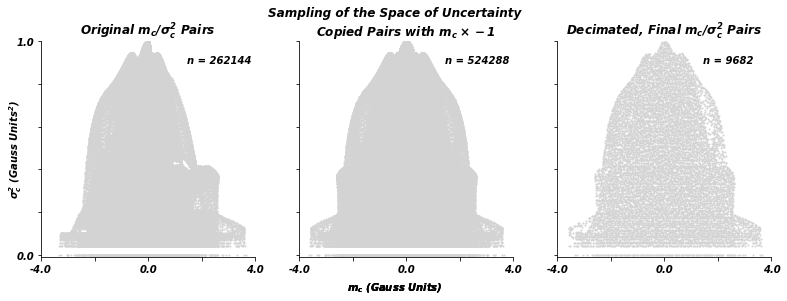

In [622]:
fig, axes = plt.subplots(1, 3, figsize=(11, 4), sharey=True)
plt.suptitle('Sampling of the Space of Uncertainty', y=1.015)

axes[0].scatter(datafl_dict['MG']['MG_Mean'], 
            datafl_dict['MG']['MG_Var'], c='lightgrey', s=1)

axes[1].scatter(mc_varc_dict['mc_varc_pairs']['MG_Mean'], 
            mc_varc_dict['mc_varc_pairs']['MG_Var'], 
            c='lightgrey', s=1)
axes[2].scatter(mc_varc_dict['final_mc_varc_pairs']['MG_Mean'], 
                mc_varc_dict['final_mc_varc_pairs']['MG_Var'], 
                c='lightgrey', s=1)

title = [r'Original $m_c$/$\sigma_c^2$ Pairs', 
         r'Copied Pairs with $m_c \times -1$', 
         r'Decimated, Final $m_c$/$\sigma_c^2$ Pairs']
ylabel = ['$\sigma_c^2$ (Gauss Units$^2$)', ' ', ' ']
nobs = [datafl_dict['MG']['MG_Mean'].count(),
        mc_varc_pairs_df['MG_Mean'].count(), 
        len(newdf['X'])]
# axes[0].set_ylabel = '$\sigma_c^2$ (Gauss Units$^2$)'

for i, ax in enumerate(axes.flat):
    ax.set(xlim = (-4.0, 4.0),
           xlabel = ' ',
           ylim = (-0.01, 1.0),
           ylabel = ylabel[i],
           title = title[i])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False) 
    ax.text(0.68, 0.90, f'n = {nobs[i]}', transform=ax.transAxes)
    
    
    # x-axis labels
    ax.xaxis.set_ticks(np.arange(-4.0, 4.01, 2))
    xlab = [item.get_text() for item in ax.get_xticklabels()]
    xstr_labels = ['-4.0', '', '0.0', '', '4.0']
    ax.set_xticklabels(xstr_labels)
    fig.text(0.5, 0.03, '$m_c$ (Gauss Units)', ha='center')
    
    #y-axis labels
    ax.yaxis.set_ticks(np.arange(0.0, 1.01, 0.2))
    ylab = [item.get_text() for item in ax.get_yticklabels()]
    ystr_labels = ['0.0', '', '', '', '', '1.0']
    ax.set_yticklabels(ystr_labels)
    ax.yaxis.set_label_coords(-0.10, 0.50)

plt.savefig(pltdir+'mc_varc.png', format='png', dpi=150, transparent=False)
plt.savefig(ccgdir+'mc_varc.pdf', format='pdf', dpi=150, transparent=False,
            bbox_inches='tight')

fig.tight_layout()
plt.show()

In [ ]:
# # Plot for paper
# x = mgest.data['MG_Mean']
# y = mgest.data['MG_Var']
# with sns.axes_style("darkgrid"):
# sns.jointplot(x=x, y=y, kind='scatter', marginal_kws=dict(bins=30, rug=True),
#                   color='grey')

In [ ]:
# from scipy.stats import kde

# x = mgest.data['MG_Mean']
# y = mgest.data['MG_Var']

# nbins=300
# k = kde.gaussian_kde([x, y])
# xi, yi = np.mgrid[x.min():x.max():nbins*1j, y.min():y.max():nbins*1j]
# zi = k(np.vstack([xi.flatten(), yi.flatten()]))

# plt.pcolormesh(xi, yi, zi.reshape(xi.shape))
# plt.show()

# Additonal Code

## Dict comprehension

In [ ]:
test_dict = {
    keys: {
        k: cuts
        for k, cuts in threshes.items()
    }
    for keys, threshes in cutoff_tempdict.items()
}
test_dict

## MG Kriging 4 Times

In [ ]:
parstr = """                 Parameters for KT3DN
                 ********************

START OF PARAMETERS:
{datfl}                          -file with data
1  2  3  4  {col}  0             -   columns for DH,X,Y,Z,var,sec var
-5   5                           -   trimming limits
0                                -option: 0=grid, 1=cross, 2=jackknife
xvk.dat                          -file with jackknife data
1   2   0    3    0              -   columns for X,Y,Z,vr and sec var
kt3dn_dataspacing.out            -data spacing analysis output file (see note)
0    15.0                        -  number to search (0 for no dataspacing analysis, rec. 10 or 20) and composite length
{dbg_lvl}   100                  -debugging level: 0,3,5,10; max data for GSKV
{dbg}                            -file for debugging output
{outfl}                          -file for kriged output
{griddef} 
1    1      1                    -x,y and z block discretization
{minsamp} {maxsamp} 12    1      -min, max data for kriging,upper max for ASO,ASO incr
0      0                         -max per octant, max per drillhole (0-> not used)
{srch}  {srch}  1.0              -maximum search radii
 0.0   0.0   0.0                 -angles for search ellipsoid
0                                -0=SK,1=OK,2=LVM(resid),3=LVM((1-w)*m(u))),4=colo,5=exdrift
{mean}   0   0                   -  mean (if 0,4,5,6), corr. (if 4 or 6), var. reduction factor (if 4)
0 0 0 0 0 0 0 0 0                -drift: x,y,z,xx,yy,zz,xy,xz,zy
0                                -0, variable; 1, estimate trend
extdrift.out                     -gridded file with drift/mean
4                                -  column number in gridded file
keyout.out                       -gridded file with keyout (see note)
0    1                           -  column (0 if no keyout) and value to keep
1    0.0                         -nst, nugget effect
1    1.0  0.0   0.0   0.0        -it,cc,ang1,ang2,ang3
     {vrng}  {vrng}   1.0        -a_hmax, a_hmin, a_vert


"""

In [ ]:
minsamp = [20, 16, 16, 16]
maxsamp = [24, 24, 24, 24]
srch = [128, 128, 256, 512]
vrng = [64, 64, 64, 64]

# MG Kriging: Gaussian Data and tranform copy to gauss_ln estimate
print("Kriging Gaussian Data")
for i, xypair in enumerate(xygrids):
    print(f"    {str(xygrids[i][0])} x {str(xygrids[i][0])} grid:")
    pars = dict(datfl = dataflname_dict['samp_' + str(xygrids[i][0])],
                col = 7,
                dbg_lvl = 0,
                dbg = outdir + 'kt3dn_' + str(xygrids[i][0]) + '.dbg',
                outfl = outdir + 'kt3dn_' + str(xygrids[i][0]) + '.out',
                griddef = krig_griddef,
                minsamp = minsamp[i],
                maxsamp = maxsamp[i],
                srch = srch[i],
                mean = mu_g,
                vrng = vrng[i])
    kt3dn.run(parstr=parstr.format(**pars), liveoutput=False)
    # Update datafile name dictionary
    dataflname_dict.update({'mg_krig_' + str(xygrids[i][0]): 
                            outdir + 'kt3dn_' + str(xygrids[i][0]) + '.out'})
print("Estimation finished.")

In [ ]:
parstr = """                  Parameters for ADDCOORD
                  ***********************

START OF PARAMETERS:
{datafl}                          -file with data
{outfl}                           -file for output
1                                 -realization number
{griddef}
"""

In [ ]:
print(f"Adding coordinates to estimates:")
for i, xypair in enumerate(xygrids):
    print(f"{str(xygrids[i][0])} x {str(xygrids[i][0])} grid:")
    pars = dict(datafl = dataflname_dict['mg_krig_' + str(xygrids[i][0])],
                outfl = outdir + 'mgest_' + str(xygrids[i][0]) + '.out',
                griddef = krig_griddef)             
    addcoord.run(parstr=parstr.format(**pars), liveoutput=False)
    # Update data file dictionary
    dataflname_dict.update({'mgest_' + str(xygrids[i][0]): 
                            outdir + 'mgest_' + str(xygrids[i][0]) + '.out'})
    # Import datafile
    print(f"    Importing file:")
    mgest = gs.DataFile(flname=dataflname_dict['mgest_'+ str(xygrids[i][0])], 
                        columns=['X', 'Y', 'Z', 'MG_Mean', 'MG_Var'])
    datafl_dict.update({str(xygrids[i][0]) + '_MG' : mgest.data}) # data in file
    print(mgest.describe())
    print()

In [ ]:
# Filter Gauss and NS estimation dictionaries:
gauss_ests_dict = {k: v for k, v in datafl_dict.items() if k.endswith('MG')}

In [ ]:
# Plot estimates for each sample scenario for Gauss and NS-Transformed LN Data
fig, axes = plt.subplots(2, 2, figsize=(10,8), sharey=True, sharex=True)
plt.suptitle('Gaussian Estimates:', y=1.0)

keys = [key for key in gauss_ests_dict.keys()]
for i, ax in enumerate(axes.flat): 
    gs.pixelplt(data=gauss_ests_dict[keys[i]]['MG_Mean'], griddef=krig_griddef, 
                vlim=(-2.5,2.5), ax=ax, cmap='PiYG', cbar_label=cbar_lab[i], 
                xlabel=False, ylabel=False, 
                title=f'{str(xygrids[i][0])} x {str(xygrids[i][0])} Grid')
    if i % 2 == 0:
        ax.set_ylabel('Northing (m)')
    if i >= 2:
        ax.set_xlabel('Easting (m)')

fig.tight_layout()

### Split Estimates and Combine into Single File

In [ ]:
print(f"Splitting and recombining Gaussian estimates:")
keys = [key for key in gauss_ests_dict.keys()]

# Split grid into 4 equal subgrids. Use middle coordinate in x,y (256, 256) 
xsplit, ysplit = 256, 256

# 8x8 < (256, 256)
s1 = datafl_dict[keys[0]].loc[(datafl_dict[keys[0]]['X'] < xsplit) & 
                              (datafl_dict[keys[0]]['Y'] < ysplit)]

# 16x16 (512, 256)
s2 = datafl_dict[keys[1]].loc[(datafl_dict[keys[1]]['X'] >= xsplit) & 
                              (datafl_dict[keys[1]]['Y'] < ysplit)]

# 32x32 (512, 512)
s3 = datafl_dict[keys[2]].loc[(datafl_dict[keys[2]]['X'] >= xsplit) & 
                              (datafl_dict[keys[2]]['Y'] >= ysplit)]

# 64x64 (512, 256)
s4 = datafl_dict[keys[3]].loc[(datafl_dict[keys[3]]['X'] < xsplit) & 
                              (datafl_dict[keys[3]]['Y'] >= ysplit)]

# Concatenate into new df and sort
dfs = [s1, s2, s3, s4]
mgest = pd.concat(dfs)
mgest.sort_values(['X', 'Y'], inplace=True)
a = mgest['MG_Mean'].count()
print(f"There are {a} records in the combined model datafile.")

# Export combined model to file
print(f"Exporting combined model. \n" )
gs.write_gslib(mgest, outdir + 'mgest_combined.out')

# Update datafile dictionary with combined model
datafl_dict.update({'MG_COMB': mgest}) # data in file

In [ ]:
# Filter combined estimate files into new dictionary:
comb_ests_dict = {k: v for k, v in datafl_dict.items() if k.endswith('COMB')}
prnt_keys(comb_ests_dict)

In [ ]:
# Plot combined estimates
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
plt.suptitle('Gaussian Data', y=0.92)
gs.pixelplt(comb_ests_dict['MG_COMB']['MG_Mean'], griddef=krig_griddef, 
            ax=ax, cmap='PiYG', vlim=(-2.5,2.5), 
            cbar_label=('Gaussian Units'))
plt.show()

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(9, 4), sharey=True)
fig.suptitle('Gaussian Data', y=1.0)
gs.pixelplt(comb_ests_dict['MG_COMB']['MG_Mean'], griddef=krig_griddef, 
            cmap='PiYG', cbar_label='Gauss. Units', ax=ax1, 
            vlim=(-2.5, 2.5), title='Conditional Mean')
gs.pixelplt(comb_ests_dict['MG_COMB']['MG_Var'], griddef=krig_griddef, 
            cmap='PiYG', vlim=(0,1), cbar_label=('Gauss. Units$^2$'), 
            ax=ax2, ylabel=False, title='Conditional Variance')

plt.tight_layout(h_pad=0.3)
fig.subplots_adjust(bottom=0.1)

#     plt.savefig(pltdir + flnames[j] + '.png', dpi=600, transparent=True)
#     plt.savefig(ccgdir + flnames[j] + '.pdf', dpi=600, transparent=True)

In [ ]:
print(f"Results of MG Estimate of 'Gaussian RF': ")
print(f"    Mean: {np.mean(comb_ests_dict['MG_COMB']['MG_Mean']):.3f}")
print(f"    Variance: {np.std(comb_ests_dict['MG_COMB']['MG_Mean']) ** 2 :.3f}")
print(f"    Standard Dev.: {np.std(comb_ests_dict['MG_COMB']['MG_Mean']):.3f}")
print(f"    Min: {np.min(comb_ests_dict['MG_COMB']['MG_Mean']):.3f}")
print(f"    Max: {np.max(comb_ests_dict['MG_COMB']['MG_Mean']):.3f}")
no_samp = comb_ests_dict['MG_COMB']['MG_Mean'].count()

fig, ax = plt.subplots(1, 1, figsize=(5,4))
plt.suptitle(f'Dist. of Est. Means: Gaussian Data', y=0.96)
gs.histplt(comb_ests_dict['MG_COMB']['MG_Mean'], bins=25, icdf=False, ax=ax, 
           xlabel=('Value (Gauss)'), xlim=(-4.1,4), stat_blk=False)
ax.text(0.73, 0.90, f'n = {no_samp}', transform=ax.transAxes)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# plt.savefig(pltdir + 'hist_mgest.png', dpi=600, transparent=True)
# plt.savefig(ccgdir + 'hist_mgest.pdf', dpi=600, transparent=True)

## Other

In [ ]:
# def thresholds(low, high):
#     """This takes the range of thresholds provided (lower and upper limits) 
#     and calculates the evenly distributed incremental CDF values and 
#     corresponding Y-values (Gaussian N(0,1) distribution only) for each of the
#     given number of thresholds. A dictionary containing the threshold number 
#     (key), CDF values[0], and Gauss values[1] is returned."""
    
#     thresholds = np.arange(low, high + 2, 1) # Plus 2 to make coding easier
    
#     # Generate dictionary keys and report range of thresholds
#     keys = [str(num) for num in thresholds[:-1]]
#     print(f"Range of thresholds to be examined: {keys[0]} -- {keys[-1]}")
    
#     # Calculate CDF increments for each threshold in range
#     increment = [1 / (thresh + 1) for thresh in thresholds[:-1]]
    
#     # Calculate multipliers, CDF values, and Y-vals for each threshold
#     mults = [] # multipliers
#     cdf = [] # CDF values
#     y = [] # Y-values (Gauss)
#     for i, v in enumerate(thresholds[:-1]):
#         mults.append(np.array(list(range(1, thresholds[i+1]))))
#         a = mults[i] * increment[i] # Calculate CDF value
#         b = stats.norm.ppf(a) # Calculate y-value (N(0,1))
#         cdf.append(a) # Append CDF values 
#         y.append(b) # Append Y-values

#     # Generate dictionary with thresholds, CDF, and Y-values
#     thresh_dict = dict(zip(keys, zip(cdf, y)))
#     return thresh_dict

In [ ]:
## Testing various quantile ranges for Normal/Log-Normal Dists
# ltemp = [1000, 10000, 100000, 1000000]
# fig, axes = plt.subplots(2, 2, figsize=(8,8), sharex=True, sharey=True)

# ax = axes.flatten()
# for i, ax in enumerate(axes.flat):
#     randln = lognorm.rvs(s=beta, loc=0, scale=np.exp(alpha), size=ltemp[i], 
#                         random_state=20200521)
#     gs.histplt(randln, bins=50, ax=ax, title=f"{ltemp[i]} Random Deviates")
# fig.tight_layout()
# plt.show()

In [ ]:
## Second method testing
# uppval = [0.9999, 0.99995, 0.99996, 0.99997, 0.99998, 0.99999]
# fig, axes = plt.subplots(2, 3, figsize=(10,8), sharex=True, sharey=True)

# ax = axes.flatten()
# for i, ax in enumerate(axes.flat):
#     check = np.linspace(0.00001, uppval[i], 10000)
#     ln2 = lognorm.ppf(check, s=beta, loc=0, scale=np.exp(alpha))
# #     ln2cdf = lognorm.cdf(ln2, s=beta, loc=0, scale=np.exp(alpha))
#     gs.histplt(ln2, bins=50, ax=ax, title=(f"Upper Percentile.: {uppval[i]}"))
# fig.tight_layout()
# plt.show()

In [ ]:
# # Randomly generate lognormal distribution
# rand_ln = lognorm.rvs(s=beta, loc=0, scale=np.exp(alpha), size=L, 
#                       random_state=20200521)
# rand_ln = np.sort(rand_ln)
# lncdf = lognorm.cdf(rand_ln, s=beta, loc=0, scale=np.exp(alpha))
# lnpdf = lognorm.pdf(rand_ln, s=beta, loc=0, scale=np.exp(alpha))


# fig, ax = plt.subplots(1, 1)
# # # Calculate weights for correct probability density values
# # weights = np.ones(len(rand_ln)) / len(rand_ln) # weight data equally
# # #   prob_wts are the correct probability density values
# # prob_wts, bins = np.histogram(rand_ln, bins=50, weights=weights, 
# #                               normed=True)
# # prob_dens = prob_wts.sum()

# # glob_dist = lognorm(s=beta, loc=0, scale=np.exp(alpha)) #generate RV with specified parameters
# # glob_probs = [glob_dist.pdf(value) for value in rand_ln]
# # pdf_yvals = glob_probs

# # ax.plot(rand_ln, pdf_yvals, 'r-', lw=3, alpha=0.35, 
# #          label='pdf correct density')
# # ax.legend(loc='lower right', frameon=False)

# gs.histplt(rand_ln, bins=50, ax=ax)
# ax.plot(rand_ln, lncdf, 'g-', alpha=0.5)
# ax.plot(rand_ln, lnpdf, 'k-', alpha=0.5)
# plt.show()

In [ ]:
# # Temporary dict to update with class means for each thresh scenario
# update_threshes = dict.fromkeys([k for k in thresh_dict['n_thresh'].keys()])

# means_dict = {}
# for k, ncls in zip(threshes, thresh_dict['n_classes'].values()):
#     print(f"    With {int(k)} thresholds / {ncls} classes:")
#     loc_cm = np.zeros((ncls, nloc)) # conditional class means
#     chk_num = np.zeros((ncls, nloc)) # total percentiles in each class

#     for j in range(nloc): # loop over locations
#         if (j % 1500 == 0): # report progress
#             print(f"        Working on location index: {j}")
#         for i in range(ncls): # loop indices based on the target array
#             if i == 0: # Lower Tail
#                 aa = y_gauss[:,j][y_gauss[:,j] <= min(threshes[k])]
#             elif i > 0 and i < len(threshes[k]): # Middle
#                 aa = y_gauss[:,j][(y_gauss[:,j] > threshes[k][i-1]) & 
#                                 (y_gauss[:,j] <= threshes[k][i])] 
#             else: # Upper tail
#                 aa = y_gauss[:,j][y_gauss[:,j] > max(threshes[k])]

#             chk_num[i,j] = np.count_nonzero(~np.isnan(aa)) # non-NaN values
#             loc_cm[i,j] = aa.mean() # calculate mean of class
#     means_dict[k] = loc_cm # Update local class mean dict
#     quants = np.sum(chk_num, axis=0) # sum quantiles 
#     if np.unique(quants)[0] != L:
#         print(f"Error! There are not {L} unique quantiles calculated!")
#         break
#         if loc_cm.shape != (k, nloc):
#             print("Error! The output array is not the correct shape!")
#     # Calculate Gauss-LN quantiles using alpa/beta parameters
    
    
# update_threshes = means_dict

# print(f"\nFinished calculating conditional class means.")
# del(means_dict)

## Example CCDFs Illustration

In [ ]:
# # Select 3 CCDFs for plotting 
# # Specify threshold values for selecting CCDF
# samp_lst = [-2.0, (-0.10, 0.10), 2.5]
# random.seed(20200503) # make extraction repeatable

# # Generate empty lists 
# ccdf_samp = [] # CCDF m_c/var_c pairs pseudo-randomly selected
# ccdf_clsmean = [] # conditional class means for each CCDF
# ccdf_clsmean_yval = [] # y-values of conditional class mean projected to CCDF
# ccdf_mean = [] # mean of CCDFs
# ccdf_std = [] # std of CCDF
# ccdf_xvals = [] # x-values of each CCDF
# # ccdf_yvals = [] # y-values of each CCDF

# # Extract values
# for i, v in enumerate(samp_lst):
#     # Select CCDFs from low, average, high areas
#     if i == 0:
#         a = arr_calcs[(arr_calcs[:, mean_idx] <= samp_lst[i]) &
#                       (arr_calcs[:, var_idx] >= 0.2)]
#     elif i == 1:
#         a = arr_calcs[(arr_calcs[:, mean_idx] >= samp_lst[i][0]) &
#                       (arr_calcs[:, mean_idx] <= samp_lst[i][1]) &
#                       (arr_calcs[:, var_idx] >= 0.5) & 
#                       (arr_calcs[:, var_idx] <= 0.6)]
#     else:
#         a = arr_calcs[(arr_calcs[:, mean_idx] >= samp_lst[-1]) &
#                       (arr_calcs[:, var_idx] >= 0.15)]
    
#     # Randomly select CCDF from CCDF's matching criteria
#     random_item = random.choice(a)
#     ccdf_samp.append(random_item[mean_idx:var_idx+1]) # extract only m_c/var_c
    
#     # Store CCDF mean and std values
#     a = ccdf_samp[i][0]
#     ccdf_mean.append(a)
#     b = np.sqrt(ccdf_samp[i][1])
#     ccdf_std.append(b) 
     
#     # Find index of selected CCDF's  
#     idx = np.array([(arr_calcs[:,0] == random_item[0]) & 
#                     (arr_calcs[:,1] == random_item[1]) & 
#                     (arr_calcs[:,2] == random_item[2])]).nonzero()[1] #[1] loc. of non-zero
    
#     # Extract corresponding conditional class mean values
#     ccdf_clsmean.append(ccdf_class_mean_dict['9'].T[idx[0],:])

#     # Calculate corresponding ymax value for conditional class mean
#     a = stats.norm.cdf(ccdf_clsmean[i], loc=ccdf_mean[i], scale=ccdf_std[i])
#     ccdf_clsmean_yval.append(a)
    
#     # Extract x- & y-values of conditional distributions
#     ccdf_xvals.append(np.squeeze(ycond.T[idx,:]))
# #     tmparr = np.squeeze(ccdf_xvals[0]) # reduce array dimensions
# #     ytemp = stats.norm.cdf(tmparr, loc=ccdf_mean[i], scale=ccdf_std[i])
# #     ccdf_yvals.append(ytemp)
    
# print(f"Mean and variance values of conditional distributions: \n{ccdf_samp}")

### Plot All Thresholds

In [ ]:
# for k, plot in enumerate(nrows_classes):
#     figsize = (ncols * 3 + 1, nrows_classes[k] * 3 + 1)
#     fig, axes = plt.subplots(nrows_classes[k], ncols, 
#                              figsize=figsize, sharey=True)
# #     plt.suptitle(f"Distribution of Conditional Means by Class: "
# #                  f"{k + low_thresh} Thresholds", y=1.01)

#     ax = axes.flatten()
#     if (nrows_classes[k] * ncols) % nclass[k] == 1:
#         ax[-1].axis('off')
#     elif (nrows_classes[k] * ncols) % nclass[k] == 2:
#         ax[-1].axis('off')
#         ax[-2].axis('off')
    
#     for i, ax in enumerate(axes.flat):
#         ax.xaxis.set_major_formatter(FormatStrFormatter('%.3f')) #2 dec places
#         gs.histplt(ccdf_class_mean_lst[k][i], bins=25, ax=ax, ylim=(0,0.5), 
#                    stat_blk='minimal')
#         ax.axvline(x=list(glob_class_mean_lst)[k][i], ymin=0, 
#                    ymax=0.7, linestyle='--', color='powderblue', 
#                    label='Global Class Mean')
#         ax.axvline(x=list(stats_ccm_dict.values())[k][0][i], ymin=0, ymax=0.6, 
#                    linestyle='--', color='k', 
#                    label='Mean of Conditional Class Means')

#         # Remove top and right axes
#         ax.spines['top'].set_visible(False)
#         ax.spines['right'].set_visible(False)

#         # y-tick marks
#         ylab = [item.get_text() for item in ax.get_yticklabels()]
#         y_string_labels = ['0.0', '', '', '', '', '0.5']
#         ax.set_yticklabels(y_string_labels)
#         ax.set_ylabel('')

#         # x-tick marks with global class mean, title, legend
#         if i == 0: # lower tail
#             ax.set_title(f'Lower Tail: Y <= {min(cutoffs_lst[k]):.3f}')
#             ax.set_xticks([np.nanmin(list(ccdf_class_mean_lst)[0]), 
#                            min(list(glob_class_mean_lst)[k]), 
#                            min(cutoffs_lst[k])])
#             ax.set_xlim(np.nanmin(list(ccdf_class_mean_lst)[0]),
#                         min(cutoffs_lst[k]) + 0.05)
#             ax.get_xticklabels()[1].set_color('powderblue') 
#         elif i > 0 and i < len(cutoffs_lst[k]): # middle
#             ax.set_title(f'Class {i + 1}: {cutoffs_lst[k][i - 1]:.3f} < Y '
#                          f'<= {cutoffs_lst[k][i]:.3f}')
#             ax.set_xticks([cutoffs_lst[k][i-1], 
#                            list(glob_class_mean_lst)[k][i],
#                            cutoffs_lst[k][i]])
#             ax.set_xlim(cutoffs_lst[k][i-1], cutoffs_lst[k][i])
#             ax.get_xticklabels()[1].set_color('powderblue') 
#         else: # upper tail
#             ax.set_title(f'Upper Tail: Y > {max(cutoffs_lst[k]):.3f}')
#             ax.set_xticks([max(cutoffs_lst[k]), 
#                            max(list(glob_class_mean_lst)[k]),
#                            np.nanmax(list(ccdf_class_mean_lst)[k])])
#             ax.set_xlim(max(cutoffs_lst[k]), 
#                         np.nanmax(list(ccdf_class_mean_lst)[k]))
#             ax.get_xticklabels()[1].set_color('powderblue') 

#             # Legend entry
#             handles, labels = ax.get_legend_handles_labels()
#             fig.legend(handles, labels, loc = 'best', 
#                        bbox_to_anchor=(1.0, 0.08), frameon=False)
#         if i == len(cutoffs_lst[k]):
#             break

#     # Shared axis labels
#     fig.text(0.5, 0.005, 'Conditional Class Mean (Gauss)', ha='center')
#     fig.text(0.008, 0.52, 'Frequency', ha='center', rotation='vertical')      

#     fig.tight_layout()
#     plt.subplots_adjust(bottom=0.08, left=0.06, right=0.97, top=0.96)
#     plt.savefig(pltdir+'Appendix_Class_Means/Class_Means_Gauss_'+
#                 f'{k + low_thresh}'+'_thresh_del.png', 
#                 dpi=600, transparent=True)
#     plt.savefig(ccgdir+'Appendix_Class_Means/Class_Means_Gauss_'+
#                 f'{k + low_thresh}'+'_thresh.pdf', 
#                 dpi=600, transparent=True)

# Gradient Boosting Example

In [ ]:
df = pd.DataFrame({'age': [5, 11,14, 8, 12, 10],
                   'sq_ft': [1500, 2030, 1442, 2501, 1300, 1789],
                   'location': [5, 12 ,6, 4, 9, 11],
                   'price': [480, 1090, 350, 1310, 400, 500]
                  })

In [ ]:
m_price = df['price'].mean()
print(f"Average price is: {m_price:.2f}")

In [ ]:
df['residuals'] = df['price'] - m_price

In [ ]:
df